## Filling NaN

---



In [ ]:
PATH = "/content/drive/MyDrive/job vacancy/newraw_gender.xlsx"

In [ ]:
real_data = pd.read_csv(PATH)
data = pd.DataFrame(real_data)

In [ ]:
for i in enumerate(data["requirement"]):
  print(i)

In [ ]:
data["salary_min"]

In [ ]:
data["salary_min"].dropna()

salary_minmax

In [ ]:
mean_min = data["salary_min"].dropna().mean()
data["salary_min"] = data["salary_min"].fillna(int(mean_min))

mean_max = data["salary_max"].dropna().mean()
data["salary_max"] = data["salary_max"].fillna(int(mean_max))

In [ ]:
SAVE = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_salarymean.xlsx"
data.to_csv(SAVE, index=False)

## START

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random



from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from collections import defaultdict
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
# !pip3 install lux-api
# !pip3 install pandas-profiling


In [ ]:
# import lux

In [ ]:
def content_encoder(nonandata, features, change_data):
  for ind, content in zip(nonandata.keys(), nonandata):
    for ind2, feature in enumerate(features, 1):
      if content == feature and feature in content:
        change_data[ind] = str(ind2)
      else:pass
  return change_data


def create_dataframe(data):
  result = pd.DataFrame(data.values(), index=data.keys())
  result.rename(columns={0:"Total"}, inplace=True)
  result["Date"] = pd.to_datetime(result.index, infer_datetime_format=True).strftime('%Y %m')
  result.set_index("Date", inplace=True)
  result.sort_values("Date", inplace=True)
  return result


def test_stationary(timeseries):
  movingAverage = timeseries.rolling(window=2).mean()
  movingSTD= timeseries.rolling(window=2).std()
  plt.figure(random.randrange(1, 100))
  orig = plt.plot(timeseries, color="blue", label="Original")
  mean = plt.plot(movingAverage, color="red", label="Mean")
  std = plt.plot(movingSTD, color="black", label="Std")
  plt.legend(loc="best")
  plt.show(block=False)

  # for i in totalads_per_month_cn:
  print("Results of Dicker-Fuller Test:")
  dftest = adfuller(timeseries["Total"], autolag="AIC")

  dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", "p-value", "#Lags Used", "Number of Observations Used"])
  for ind, contents in dftest[4].items():
    dfoutput[f"Critical Value ({ind})"] = contents
  print(dfoutput)

## ARIMA FUNCTION

In [ ]:
####################################################################################################################################################################################
####################################################################################################################################################################################

def create_arima(data, a=2, b=0, c=1):
  plt.figure("init")
  plt.plot(data)
  rolmean = data.rolling(window=2).mean()
  rolstd= data.rolling(window=2).std()
  # print(rolmean, rolstd)
  plt.show()

  print("*" * 80)
  print("*" * 80)
  print("*" * 80, "\n")

  plt.figure("init_2")
  orig = plt.plot(data, color="blue", label="Original")
  mean = plt.plot(rolmean, color="red", label="Mean")
  std = plt.plot(rolstd, color="black", label="Std")
  plt.show()

  print("*" * 80)
  print("*" * 80)
  print("*" * 80, "\n")


  print("Results of Dicker-Fuller Test:")
  dftest = adfuller(data["Total"], autolag="AIC")

  dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", "p-value", "#Lags Used", "Number of Observations Used"])
  for ind, contents in dftest[4].items():
    dfoutput[f"Critical Value ({ind})"] = contents

  print(dfoutput)

  print("*" * 80)
  print("*" * 80)
  print("*" * 80, "\n")

  #Estimating Trend

  date_logScale = np.log(data)
  plt.figure("Log Scale")
  print("\t\t\t\tLog Scale")
  plt.plot(date_logScale)
  plt.show()

  movingAverage = date_logScale.rolling(window=12).mean()
  movingSTD = date_logScale.rolling(window=12).std()
  plt.figure("Moving Everage")
  print("\t\t\t\tMoving Everage")
  plt.plot(movingAverage, color="red")
  plt.title("Moving Everage")
  # plt.plot(movingSTD)
  plt.show()

  print("*" * 80)
  print("*" * 80)
  print("*" * 80, "\n")
  try:
    #Log Scale Minus Moving Avarage
    print("\t\t\t\tLog Scale Minus Moving Avarage")
    lsmma = date_logScale - movingAverage
    lsmma.dropna(inplace=True)
    # exec(f"globals()[f'{str_data}_lsmma'] = {lsmma}")
    test_stationary(lsmma)
  except:
    pass

  print("*" * 80)
  print("*" * 80)
  print("*" * 80, "\n")

  try:
    #Exponential Decay Weight Avarage
    print("\t\t\t\tExponential Decay Weight Avarage")
    plt.figure("Exponential Decay Weight Avarage")
    expdwa = date_logScale.ewm(halflife=12, min_periods=0, adjust=True).mean()
    plt.plot(date_logScale)
    plt.plot(expdwa, color="red")
    plt.show()

    print("*" * 80)
    print("*" * 80)
    print("*" * 80, "\n")

    #dataset Log Scale - Moving Exp Decay Avarage
    print("\t\t\t\tdataset Log Scale - Moving Exp Decay Avarage")
    ds_lsmedwa = date_logScale - expdwa
    test_stationary(ds_lsmedwa)
  except:
    pass

  #dataset Log Diff Shifting
  print("\t\t\t\tdataset Log Diff Shifting")
  ds_lds_ls = date_logScale - date_logScale.shift()
  # plt.plot(ds_lds)
  ds_lds_ls.dropna(inplace=True)
  test_stationary(ds_lds_ls)


  print("*" * 80)
  print("*" * 80)
  print("*" * 80, "\n")


  print("\t\t\t\tDecomposition")
  decomposition = seasonal_decompose(ds_lds_ls, freq=2)

  trend = decomposition.trend
  seasonal = decomposition.seasonal
  residual = decomposition.resid
  plt.figure(random.randrange(100, 200))
  plt.plot(date_logScale, label="original")
  plt.legend(loc="best")
  plt.show()

  plt.figure(random.randrange(200, 300))
  plt.plot(trend, label="Trend")
  plt.legend(loc="best")
  plt.figure(random.randrange(300, 400))
  plt.plot(seasonal, label="Seasonal")
  plt.legend(loc="best")
  plt.figure(random.randrange(400, 500))
  plt.plot(residual, label="Residual")
  plt.legend(loc="best")
  # plt.tight_layout()
  plt.show()

  print("*" * 80)
  print("*" * 80)
  print("*" * 80, "\n")

  #Desompose Log Data
  print("\t\t\t\tDesompose Log Data")
  decomposedLogData = residual
  decomposedLogData.dropna(inplace=True)
  test_stationary(decomposedLogData)

  print("*" * 80)
  print("*" * 80)
  print("*" * 80, "\n")

  #ACF and PACF Plot

  print("\t\t\t\tACF and PACF Plot")

  lag_acf = acf(ds_lds_ls, nlags=20, fft=False)
  lag_pacf = pacf(ds_lds_ls, nlags=20, method="ols")

  #Plot ACF
  plt.figure("ACF")
  plt.subplot(121)
  plt.plot(lag_acf)
  plt.axhline(y=0, linestyle="--", color="gray")
  plt.axhline(y=-1.96/np.sqrt(len(ds_lds_ls)), linestyle="--", color="gray")
  plt.axhline(y=1.96/np.sqrt(len(ds_lds_ls)), linestyle="--", color="gray")
  plt.title("Auto Correlation Function")
  plt.show()

  #Plot PACF
  plt.figure("PACF")
  plt.subplot(122)
  plt.plot(lag_pacf)
  plt.axhline(y=0, linestyle="--", color="gray")
  plt.axhline(y=-1.96/np.sqrt(len(ds_lds_ls)), linestyle="--", color="gray")
  plt.axhline(y=1.96/np.sqrt(len(ds_lds_ls)), linestyle="--", color="gray")
  plt.title("Partial Auto Correlation Function")
  plt.show()

  print("*" * 80)
  print("*" * 80)
  print("*" * 80, "\n")

  print("\t\t\tPLOTTING ARIMA")
  model = ARIMA(date_logScale, order=(a, b, c))
  results_arima = model.fit(disp=-1, transparams=False)
  plt.plot(ds_lds_ls)
  plt.plot(results_arima.fittedvalues, color="red")
  plt.title("RSS: %.4f"% sum((results_arima.fittedvalues - ds_lds_ls["Total"] ** 2)))
  plt.show()

  return ds_lds_ls, results_arima


def after_arima(data, a_result, step:int):

  print("\t\tpredictions_diff")
  predictions_diff = pd.Series(a_result.fittedvalues, copy=True)
  print(predictions_diff, "\n\n")


  print("\t\tpredictions_diff_cumsum")
  predictions_diff_cumsum = predictions_diff.cumsum()
  print(predictions_diff_cumsum, "\n\n")


  print("\t\tpredictions_log")
  predictions_log = pd.Series(data["Total"], index=data.index)
  predictions_log = predictions_log.add(predictions_diff_cumsum, fill_value=0)
  print(predictions_log, "\n\n")


  print("\t\tpredictions_arima")
  predictions_arima = np.exp(predictions_log)
  print(predictions_arima, "\n\n")

  plt.figure("predictions ARIMA Log")
  plt.plot(predictions_arima)
  plt.title("Prediction Result")
  plt.show()

  plt.figure("Plot predictions ARIMA")
  a_result.plot_predict(1, len(data) + step)
  plt.show()
  forecast_result = a_result.forecast(steps=step)

  return forecast_result

##ADDING GENDER COLUMN

In [ ]:
PATH = "/content/drive/MyDrive/job vacancy/raw.xlsx"

In [ ]:
real_data = pd.read_excel(PATH)

In [ ]:
# uncolumns = ["industry", "title", "experience", "salary_currency", "description", "ads_end", "company", "company_industry", "company_nearby_transportation", "company_hq", "company_web", "scraper_uuid", "scraper_timestamp", "kode"]
data = pd.DataFrame(real_data)
data["gender"] = data["requirement"].fillna(str(2))

In [ ]:
data["ads_start"]

0         43780
1         43791
2         43866
3         43740
4         43735
          ...  
164908    44385
164909    44378
164910    44384
164911    44384
164912    44387
Name: ads_start, Length: 164913, dtype: int64

In [ ]:
pd.options.mode.chained_assignment = None

dropna_req = data["requirement"].fillna("2")
dropna_gen = data["gender"].fillna("2")

gend_female = ["perempuan", "wanita", "female"]
# gend_male = ["pria", "laki-laki", "laki - laki", "laki laki", "male", "laki"]
gend_male = ["pria", "male", "laki"]



for ind, content in zip(dropna_req.keys(), dropna_req):
    hitung = 0
    for gendm in gend_male:
      if gendm in content:
        data["gender"][ind] = dropna_gen[ind].replace(dropna_gen[ind], "1")
        hitung += 1
    for gendf in gend_female:
      if gendf in content:
        data["gender"][ind] = dropna_gen[ind].replace(dropna_gen[ind], "0")
        hitung += 1
    if hitung >= 2:
      data["gender"][ind] = dropna_gen[ind].replace(dropna_gen[ind], "2")
    if data["gender"][ind] not in ["0", "1", "2"]:
      data["gender"][ind] = dropna_gen[ind].replace(dropna_gen[ind], "2")

In [ ]:
for gend, req in zip(data["gender"], data["requirement"]):
  print(f"Gen: {gend}, \t\t Req: {req}")

Streaming output truncated to the last 5000 lines.
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: diutamakan lulusan luar negeri; min. 19 tahun, laki-laki / perempuan; aktif, enerjik, mampu berkomunikasi dengan baik; highly motivated; dapat berbahasa inggris (min. pasif)
Gen: 2, 		 Req: diutamakan lulusan luar negeri; min. 19 tahun, laki-laki / perempuan; aktif, enerjik, mampu berkomunikasi dengan baik; highly motivated; dapat berbahasa inggris (min. pasif)
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 1, 		 Req: pria 20-40 tahun; pengalaman di bidang electrical min 2thn; memiliki kendaraan pribadi ( motor ); bisa membaca cad; dapat bekerja sama dalam tim; sehat jasmani dan rohani
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: pendidikan minimal s1; pengalaman minimal 3 tahun di bidang yang sama; berpengalaman dengan erp system leb

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Gen: 2, 		 Req: nan
Gen: 1, 		 Req: pria, maks. 45 tahun; pendidikan minimal sma sederajat; berpengalaman minimal 2 tahun; memiliki sim a; menguasai rute jakarta dan bandung
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: pria/wanita, maks. 40 tahun; minimal pendidikan d3 semua jurusan; diutamakan bisa mengendarai mobil; menguasai komputer; dapat bekerja dengan cekatan, rajin, dan teliti
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: male/female; min. bachelor degree in accounting; prefer experienced in the same field; licence with tax brefet a/b; honest and dedicated; hard worker and organize; placement at south cimahi
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 2, 		 Req: nan
Gen: 1, 		 Req: pria; pendidikan s1 / sederajat; umur maksimal 35 tahun; pengalaman 

In [ ]:
pd.DataFrame(data["gender"], data["requirement"])

,gender
requirement,
"usia maksimal 35 tahun; lulusan minimal d iii (segala jurusan); memiliki sim c & sim a; memiliki pengalaman kerja sebagai sales supervisor, minimal 2 tahun di perusahaan consumer goods; mahir dalam penggunaan sistem microsoft office (word, excel, powerpoint, access, outlook, dan lain-lain); dapat bekerja secara team; dapat bekerja overtime, under pressure, dan terbiasa dengan sistem target; akan ditempatkan di dki jakarta",NaN
NaN,NaN
NaN,NaN
"pria/wanita; pendidikan min. s1 akuntansi,; mampu bekerja secara individu/kelompok, memiliki mobilitas yang tinggi,; disiplin dan teliti,; memiliki pengalaman pada perusahaan food & beverage",NaN
usia maksimal 35 tahun; pendidikan minimal smk; berpengalaman; jujur dan disiplin; diutamakan domisili surabaya-sidoarjo,NaN
...,...
NaN,NaN
NaN,NaN
NaN,NaN


In [ ]:
SAVE = "/content/drive/MyDrive/job vacancy/newraw_gender.xlsx"
data.to_csv(SAVE, index=False)

## Adding Company Size Categories

In [ ]:
PATH = "/content/drive/MyDrive/job vacancy/newraw_gender.xlsx"

In [ ]:
real_data = pd.read_csv(PATH)
data = pd.DataFrame(real_data)

In [ ]:
data

In [ ]:
# data["company_sizecategory"] = data["company_size"]
# dropna_sizecategory = data["company_sizecategory"].dropna()

# size_categories = ["1 - 10 employees", "11 - 50 employees", "51 - 200 employees", "201 - 500 employees", "501 - 1000 employees", "1001 - 5000 employees", "5001 - 10,000 employees", "10,001+ employees"]

# for ind, content in zip(dropna_sizecategory.keys(), dropna_sizecategory):
#     for category in size_categories:
#       if size_categories[0] in content:
#         data["company_sizecategory"][ind] = "1"
#       elif size_categories[1] in content:
#         data["company_sizecategory"][ind] = "2"
#       elif size_categories[2] in content:
#         data["company_sizecategory"][ind] = "3"
#       elif size_categories[3] in content:
#         data["company_sizecategory"][ind] = "4"
#       elif size_categories[4] in content:
#         data["company_sizecategory"][ind] = "5"
#       elif size_categories[5] in content:
#         data["company_sizecategory"][ind] = "6"
#       elif size_categories[6] in content:
#         data["company_sizecategory"][ind] = "7"
#       elif size_categories[7] in content:
#         data["company_sizecategory"][ind] = "8"


In [ ]:
data["company_sizecategory"] = data["company_size"]
dropna_sizecategory = data["company_sizecategory"].dropna()
features = set(dropna_sizecategory)


# def content_encoder(nonandata, features, change_data):
#   for ind, content in zip(nonandata.keys(), nonandata):
#     for ind2, feature in enumerate(features, 1):
#       if feature in content and content == feature:
#         change_data[ind] = str(ind2)
#       else:pass
#   return change_data

data["company_sizecategory"] = content_encoder(dropna_sizecategory, features, data["company_sizecategory"])

In [ ]:
SAVE = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories.xlsx"
data.to_csv(SAVE, index=False)

## Adding Degree Categories

In [ ]:
PATH = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories.xlsx"

In [ ]:
real_data = pd.read_csv(PATH)
data = pd.DataFrame(real_data)

In [ ]:
data["degree_categories"] = data["pend_min"]
dropna_degreecategory = data["degree_categories"].dropna()
features = set(dropna_degreecategory)


# def content_encoder(nonandata, features, change_data):
#   for ind, content in zip(nonandata.keys(), nonandata):
#     for ind2, feature in enumerate(features, 1):
#       if feature in content and content == feature:
#         change_data[ind] = str(ind2)
#       else:pass
#   return change_data

data["degree_categories"] = content_encoder(dropna_degreecategory, features, data["degree_categories"])

In [ ]:
data

In [ ]:
SAVE = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories_degreecategories.xlsx"
data.to_csv(SAVE, index=False)

## Filter Category

In [ ]:
uncolumns1 = ["company_size", "pend_min"]
uncolumns2 = ["industry", "title", "experience", "salary_currency", "description", "ads_end", "company", "company_industry", "company_nearby_transportation", "company_hq", "company_web", "scraper_uuid", "scraper_timestamp", "kode",
              "company_size", "pend_min", "location", "category",
              "requirement"]
PATH = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories.xlsx"
real_data = pd.read_csv(PATH)
data = pd.DataFrame(real_data)

# data = pd.DataFrame(real_data).drop(columns=uncolumns2)

In [ ]:
# category_list = ["Engineer", "IT"]
cat_list = list(set(data["category"].dropna()))

import string
for ind, content in enumerate(cat_list):
    for punc in string.punctuation:
      if punc in content:
        cat_list[ind] = cat_list[ind].replace(punc, "")



# for i in cat_list:
#   print(i.split())

cat_list

In [ ]:
xxx = cat_list

from collections import Counter
# Counter(word_list).most_common()




for i in xxx:
  counter = 0
  for z in set(i.split()):
    if z in i:
      # counter = sum(int(counter))
      print(counter, z)
    # else:
    #   counter = 0



In [ ]:
set(data["category"])

## Adding Categories' Code

In [ ]:
PATH = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories_degreecategories.xlsx"

In [ ]:
# uncolumns1 = ["company_size", "pend_min"]
# uncolumns2 = ["industry", "title", "experience", "salary_currency", "description", "ads_end", "company", "company_industry", "company_nearby_transportation", "company_hq", "company_web", "scraper_uuid", "scraper_timestamp", "kode",
#               "company_size", "pend_min"]

real_data = pd.read_csv(PATH)
# data = pd.DataFrame(real_data).drop(columns=uncolumns2)
data = pd.DataFrame(real_data)

In [ ]:
data.loc[lambda data: data["location"] == "jabodetabek"]

In [ ]:
data["category_code"] = data["category"]
dropna_categoriescode = data["category"].dropna()
features = set(dropna_categoriescode)


data["category_code"] = content_encoder(dropna_categoriescode, features, data["category_code"])

In [ ]:
for d, p in zip(data["degree_categories"], data["pend_min"]):
  print(d, p)

In [ ]:
for i in enumerate(set(data["pend_min"]), 1):
  print(i)

In [ ]:
data

In [ ]:
SAVE = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories_degreecategories_categoriesscodes.xlsx"
data.to_csv(SAVE, index=False)

## Filtering and Adding Location Codes

In [ ]:
PATH = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories_degreecategories_categoriesscodes.xlsx"

In [ ]:
real_data = pd.read_csv(PATH)
data = pd.DataFrame(real_data)

In [ ]:
non = ['indonesia - banten - serang', 'indonesia - jakarta raya', 'indonesia - jawa timur - surabaya',]
data["location_code"] = data["location"]
dropna_locationcode = data["location"].dropna()
features = set(data["location"])

for ind, content in zip(dropna_locationcode.keys(), dropna_locationcode):
    if non[0] in content:
      data["location"][ind] = "serang"
    elif non[1] in content:
      data["location"][ind] = "jakarta raya"
    elif non[2] in content:
      data["location"][ind] = "surabaya"

In [ ]:
data["location_code"] = content_encoder(dropna_locationcode, features, data["location_code"])

In [ ]:
SAVE = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories_degreecategories_categoriesscodes_locationscodes.xlsx"
data.to_csv(SAVE, index=False)

## Adding Industry Codes

In [ ]:
# uncolumns1 = ["company_size", "pend_min"]
uncolumns2 = ["industry", "title", "experience", "salary_currency", "description", "ads_end", "company", "company_industry", "company_nearby_transportation", "company_hq", "company_web", "scraper_uuid", "scraper_timestamp", "kode",
              "company_size", "pend_min"]

PATH = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories_degreecategories_categoriesscodes_locationscodes.xlsx"
real_data = pd.read_csv(PATH)
data = pd.DataFrame(real_data)

# data = pd.DataFrame(real_data).drop(columns=uncolumns2)

In [ ]:
for i in enumerate(set(data["industry"])):
  print(i)

In [ ]:
data["industry_code"] = data["industry"]
dropna_industrycode = data["industry"].dropna()
features = set(data["industry"])



data["industry_code"] = content_encoder(dropna_industrycode, features, data["industry_code"])

In [ ]:
SAVE = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories_degreecategories_categoriesscodes_locationscodes_industrycodes.xlsx"
data.to_excel(SAVE, index=False)

## Finished

In [ ]:
uncolumns1 = ["company_size", "pend_min"]
uncolumns2 = ["industry", "title", "experience", "salary_currency", "description", "ads_end", "company", "company_industry", "company_nearby_transportation", "company_hq", "company_web", "scraper_uuid", "scraper_timestamp", "kode",
              "company_size", "pend_min", "location", "category",
              "requirement"]

PATH = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories_degreecategories_categoriesscodes_locationscodes_industrycodes.xlsx"
real_data = pd.read_excel(PATH)
data = pd.DataFrame(real_data)

# data = pd.DataFrame(real_data).drop(columns=uncolumns2)

In [ ]:
data

Convert int to date

In [ ]:
from  datetime import datetime
date_converter = [datetime.fromordinal(datetime(1900, 1, 1).toordinal() + content - 2) for content in data["ads_start"]]
data["ads_start"] = [date.strftime('%d-%m-%Y') for date in date_converter]

List of codes

In [ ]:
pd.set_option("display.max_rows", None)
code_list = [set(data["gender"].dropna()), set(data["company_size"].dropna()), set(data["pend_min"].dropna()), set(data["category"].dropna()), set(data["location"].dropna()), set(data["industry"].dropna())]
code_data = pd.DataFrame(code_list, index=["Gender", "Company Size", "Degree", "Categories Code", "Location Code", "Industry Code"]).swapaxes("index", "columns")

print("\t\t\t\t\t\t\t\t Starting from 1 except Gender")
code_data

In [ ]:
pd.reset_option("all")

?

In [ ]:
data

In [ ]:
uncolumns = ["industry", "title", "experience", "salary_currency", "description", "ads_end", "company", "company_industry", "company_nearby_transportation", "company_hq", "company_web", "scraper_uuid", "scraper_timestamp", "kode",
              "company_size", "pend_min", "location", "category",
              "requirement"]

data = pd.DataFrame(real_data).drop(columns=uncolumns)


## Add Total Ads

In [ ]:
uncolumns1 = ["company_size", "pend_min"]
uncolumns2 = ["industry", "title", "experience", "salary_currency", "description", "company", "company_industry", "company_nearby_transportation", "company_hq", "company_web", "scraper_uuid", "scraper_timestamp", "kode",
              "company_size", "pend_min", "location", "category",
              "requirement"]

PATH = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories_degreecategories_categoriesscodes_locationscodes_industrycodes.xlsx"
real_data = pd.read_excel(PATH)
data = pd.DataFrame(real_data)

# data = pd.DataFrame(real_data).drop(columns=uncolumns2)

In [ ]:
data

In [ ]:
data["adsstart_per_month"] = data["ads_start"]
data["adsend_per_month"] = data["ads_end"]

In [ ]:
# import datetime as dt

from  datetime import datetime
datestart_converter = [datetime.fromordinal(datetime(1900, 1, 1).toordinal() + content - 2) for content in data["adsstart_per_month"]]
data["adsstart_per_month"] = [pd.to_datetime(date, infer_datetime_format=True).strftime('%Y %m') for date in datestart_converter]

dateend_converter = [datetime.fromordinal(datetime(1900, 1, 1).toordinal() + content - 2) for content in data["adsend_per_month"]]
data["adsend_per_month"] = [pd.to_datetime(date, infer_datetime_format=True).strftime('%Y %m') for date in dateend_converter]


# date_converter = [datetime.fromordinal(datetime(1900, 1, 1).toordinal() + content - 2) for content in data["ads_start"]]
# data["ads_start"] = [date.date.strftime('%d-%m-%Y') for date in date_converter]


In [ ]:
features = sorted(list(set(data["adsend_per_month"])))

In [ ]:
data

In [ ]:
# data["adslen_total"] = data["adsstart_per_month"]

# for (ind, start), end in zip(enumerate(data["adsstart_per_month"]), data["adsend_per_month"]):
#   if "0" in start[-2:] or "0" in end[-2:]:
#     dum_start = start[-2:].replace("0", "")
#     dum_end = end[-2:].replace("0", "")
#     new_se = int(dum_end) - int(dum_start)
#     if new_se < 0:
#       new_se = (new_se + 12) + 1
#     elif new_se == 0:
#       new_se = new_se + 1
#     test = []
#     test.append(new_se)

#     for ind2, result in enumerate(test):
#       test2 = []
#       print(test2)

In [ ]:
print(list(range(3)) *3)

In [ ]:
data.iloc[40416]

In [ ]:
data.loc[(data["adsend_per_month"] == "2022 01")]

In [ ]:
sorted(list(set(data["adsstart_per_month"])))

for a,b  in enumerate(sorted(list(set(data["adsstart_per_month"])))):
  print(a, b)

In [ ]:
sorted(list(set(data["adsend_per_month"])))

for a,b  in enumerate(sorted(list(set(data["adsend_per_month"])))):
  print(a, b)

In [ ]:
features = sorted(list(set(data["adsend_per_month"])))

dropna_adsstart = data["adsstart_per_month"]
# features = set(dropna_adsstart)
print(features)
data["adsstart_per_month"] = content_encoder(dropna_adsstart, features, data["adsstart_per_month"])


dropna_adsend = data["adsend_per_month"]
# features = set(dropna_adsend)
print(features)
data["adsend_per_month"] = content_encoder(dropna_adsend, features, data["adsend_per_month"])

In [ ]:
data

In [ ]:
# data["adslen_total"] = data["adsstart_per_month"]

# for (ind, start), (ind2, end) in zip(enumerate(data["adsstart_per_month"]), enumerate(data["adsend_per_month"])):
#   if int(end) > 24:
#     end = 24
#   new_dum = int(end) - int(start)
#   if new_dum == 0:
#     data["adslen_total"][ind] = np.array([int(start)])
#   else:
#     data["adslen_total"][ind] = [int(start)]
#     for non in range(int(new_dum)):
#       data["adslen_total"][ind].append(int(start) + int(non) + 1)

data["adslen_total"] = data["adsstart_per_month"]


for (ind, end) in enumerate(data["adsend_per_month"]):
  if int(end) > 25:
    end = 25
  new_dum = int(end) - int(data["adsstart_per_month"][ind])
  try:
    if new_dum == 0:
      data["adslen_total"][ind] = np.array([int(data["adsstart_per_month"][ind])])
    else:
      data["adslen_total"][ind] = [int(data["adsstart_per_month"][ind])]
      for non in range(int(new_dum)):
        data["adslen_total"][ind].append(int(data["adsstart_per_month"][ind]) + int(non) + 1)
  except:
    pass


# for (ind, end), (ind2, start) in zip(enumerate(data["adsend_per_month"]), enumerate(data["adsstart_per_month"])):
#   if int(end) > 24:
#     end = 24
#   new_dum = int(end) - int(start)
#   if new_dum == 0:
#     data["adslen_total"][ind] = np.array([int(start)])
#   else:
#     data["adslen_total"][ind] = [int(start)]
#     data["adslen_total"][ind].append(int(start) + int(non) + 1)

In [ ]:
data

In [ ]:
SAVE = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories_degreecategories_categoriesscodes_locationscodes_industrycodes_adslen.xlsx"
data.to_excel(SAVE, index=False)

# ARIMA

In [ ]:
import json
uncolumns1 = ["company_size", "pend_min"]
uncolumns2 = ["industry", "title", "experience", "salary_currency", "description", "company", "company_industry", "company_nearby_transportation", "company_hq", "company_web", "scraper_uuid", "scraper_timestamp", "kode",
              "company_size", "pend_min", "location", "category",
              "requirement"]

PATH_STAN = "/content/drive/MyDrive/job vacancy/newraw_gender_companycategories_degreecategories_categoriesscodes_locationscodes_industrycodes_adslen.xlsx"
PATH_FF = "/content/drive/MyDrive/Colab Notebooks/Dataset/big data dataset/job vacancy/newraw_gender_companycategories_degreecategories_categoriesscodes_locationscodes_industrycodes_adslen.xlsx"
real_data = pd.read_excel(PATH_STAN)
data = pd.DataFrame(real_data)

# data = pd.DataFrame(real_data).drop(columns=uncolumns2)

In [ ]:
from  datetime import datetime
datestart_converter = [datetime.fromordinal(datetime(1900, 1, 1).toordinal() + content - 2) for content in data["ads_end"]]
datestart_converter = [pd.to_datetime(date, infer_datetime_format=True).strftime('%Y %m') for date in datestart_converter]
date_feature = sorted(list(set(datestart_converter)))

## ARIMA DATE

In [ ]:
import json
uncolumns1 = ["company_size", "pend_min"]
uncolumns2 = ["industry", "title", "experience", "salary_currency", "description", "company", "company_industry", "company_nearby_transportation", "company_hq", "company_web", "scraper_uuid", "scraper_timestamp", "kode",
              "company_size", "pend_min", "location", "category",
              "requirement"]

PATH = "/content/drive/MyDrive/job vacancy/newraw_gender_companycategories_degreecategories_categoriesscodes_locationscodes_industrycodes_adslen.xlsx"
real_data = pd.read_excel(PATH)
# data = pd.DataFrame(real_data)

data = pd.DataFrame(real_data).drop(columns=uncolumns2)

In [ ]:
from  datetime import datetime
datestart_converter = [datetime.fromordinal(datetime(1900, 1, 1).toordinal() + content - 2) for content in data["ads_end"]]
datestart_converter = [pd.to_datetime(date, infer_datetime_format=True).strftime('%Y %m') for date in datestart_converter]

features = sorted(list(set(datestart_converter)))

In [ ]:
data

,salary_min,salary_max,ads_start,ads_end,gender,company_sizecategory,degree_categories,category_code,location_code,industry_code,adsstart_per_month,adsend_per_month,adslen_total
0,NaN,NaN,43780,43788,2,4.0,3,24.0,260.0,10,3,3,[3]
1,NaN,NaN,43791,43814,2,6.0,7,154.0,66.0,14,3,4,"[3, 4]"
2,2500000.0,3500000.0,43866,43896,2,2.0,7,124.0,203.0,11,6,7,"[6, 7]"
3,NaN,NaN,43740,43759,2,NaN,6,97.0,2.0,37,2,2,[2]
4,NaN,NaN,43735,43765,2,7.0,2,28.0,212.0,37,1,2,"[1, 2]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
164908,NaN,NaN,44385,44399,2,7.0,7,5.0,21.0,14,23,23,[23]
164909,NaN,NaN,44378,44408,2,7.0,7,154.0,21.0,14,23,23,[23]
164910,NaN,NaN,44384,44414,2,7.0,7,36.0,21.0,14,23,24,"[23, 24]"
164911,NaN,NaN,44384,44414,2,7.0,7,82.0,21.0,14,23,24,"[23, 24]"


In [ ]:
features

['2019 09',
 '2019 10',
 '2019 11',
 '2019 12',
 '2020 01',
 '2020 02',
 '2020 03',
 '2020 04',
 '2020 05',
 '2020 06',
 '2020 07',
 '2020 08',
 '2020 09',
 '2020 10',
 '2020 11',
 '2020 12',
 '2021 01',
 '2021 02',
 '2021 03',
 '2021 04',
 '2021 05',
 '2021 06',
 '2021 07',
 '2021 08',
 '2021 09',
 '2022 01']

In [ ]:
from collections import defaultdict
# totalads_per_month = 0
totalads_per_month = defaultdict(list)
totalads_per_month2 = defaultdict(list)
totalads_per_month_c = defaultdict(list)


for ind, contents in enumerate(data["adslen_total"]):
  for content in json.loads(contents):
    for ranges in range(24):
      if ranges == content:
        totalads_per_month[features[content - 1]].append([ind, features[content - 1]])
        totalads_per_month2[features[content - 1]].append([features[content - 1]])
        totalads_per_month_c[features[content - 1]].append([features[content - 1]])

    # totalads_per_month_c[features[content]] = np.array([totalads_per_month]).size

In [ ]:
totalads_per_month2

defaultdict(list,
            {'2019 09': [['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],
              ['2019 09'],

In [ ]:
for i in totalads_per_month_c.keys():
  totalads_per_month_c[i] = (int(np.array([totalads_per_month_c[i]]).size))

totalads_per_month_c

defaultdict(list,
            {'2019 09': 10950,
             '2019 10': 20739,
             '2019 11': 22069,
             '2019 12': 19960,
             '2020 01': 19664,
             '2020 02': 20723,
             '2020 03': 20301,
             '2020 04': 14875,
             '2020 05': 8960,
             '2020 06': 6993,
             '2020 07': 6961,
             '2020 08': 8062,
             '2020 09': 10100,
             '2020 10': 12386,
             '2020 11': 12059,
             '2020 12': 11625,
             '2021 01': 10696,
             '2021 02': 10894,
             '2021 03': 13303,
             '2021 04': 12979,
             '2021 05': 9110,
             '2021 06': 9110,
             '2021 07': 10095})

In [ ]:
for i in totalads_per_month_c:
  print(i)

2019 11
2019 12
2020 02
2020 03
2019 10
2019 09
2020 01
2020 12
2021 01
2020 09
2020 10
2020 04
2020 06
2020 07
2020 08
2020 11
2020 05
2021 02
2021 03
2021 04
2021 05
2021 06
2021 07


In [ ]:
def create_dataframe(data):
  result = pd.DataFrame(data.values(), index=data.keys())
  result.rename(columns={0:"Total"}, inplace=True)
  result["Date"] = pd.to_datetime(result.index, infer_datetime_format=True).strftime('%Y %m')
  result.set_index("Date", inplace=True)
  result.sort_values("Date", inplace=True)
  return result

# totalads_per_month_cn = pd.DataFrame(totalads_per_month_c.values(), index=totalads_per_month_c.keys())
# totalads_per_month_cn.rename(columns={0:"Total"}, inplace=True)
# totalads_per_month_cn["Date"] = pd.to_datetime(totalads_per_month_cn.index, infer_datetime_format=True).strftime('%Y %m')
# totalads_per_month_cn.set_index("Date", inplace=True)
# totalads_per_month_cn.sort_values("Date")

totalads_per_month_cn = create_dataframe(totalads_per_month_c)





# totalads_per_month_cn = pd.DataFrame(totalads_per_month_c.values(), index=pd.to_datetime(totalads_per_month_c.keys())

# totalads_per_month_cn.rename(columns={0:"Total"}, inplace=True)
# totalads_per_month_cn.index.rename("Date", inplace=True)

# pd.to_datetime(totalads_per_month_cn.keys(), infer_datetime_format=False)

In [ ]:
totalads_per_month_cn

,Total
Date,
2019 09,10950
2019 10,20739
2019 11,22069
2019 12,19960
2020 01,19664
2020 02,20723
2020 03,20301
2020 04,14875
2020 05,8960


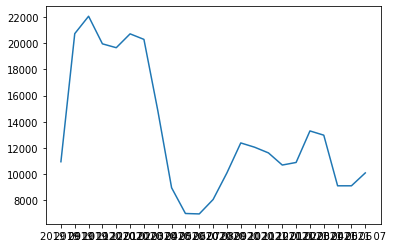

********************************************************************************
********************************************************************************
******************************************************************************** 



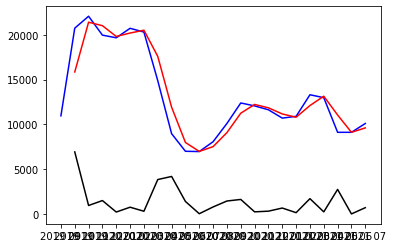

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -2.299148
p-value                         0.172243
#Lags Used                      8.000000
Number of Observations Used    14.000000
Critical Value (1%)            -4.012034
Critical Value (5%)            -3.104184
Critical Value (10%)           -2.690987
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


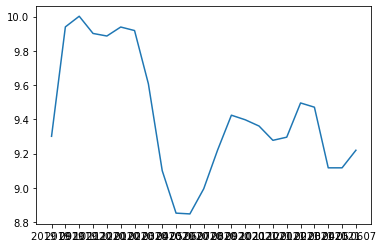

				Moving Everage


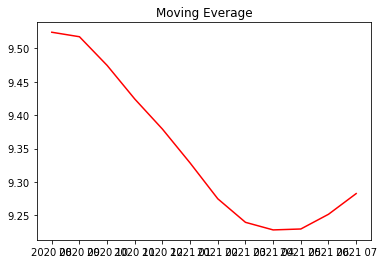

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


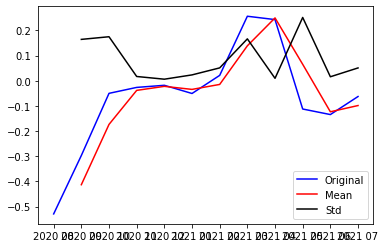

Results of Dicker-Fuller Test:
Test Statistic                -2.370433
p-value                        0.150256
#Lags Used                     4.000000
Number of Observations Used    7.000000
Critical Value (1%)           -4.938690
Critical Value (5%)           -3.477583
Critical Value (10%)          -2.843868
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


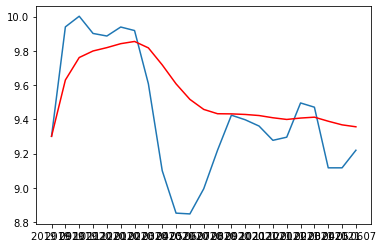

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


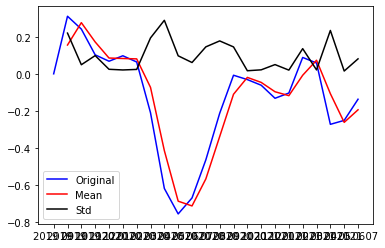

Results of Dicker-Fuller Test:
Test Statistic                 -0.234494
p-value                         0.934283
#Lags Used                      9.000000
Number of Observations Used    13.000000
Critical Value (1%)            -4.068854
Critical Value (5%)            -3.127149
Critical Value (10%)           -2.701730
dtype: float64
				dataset Log Diff Shifting


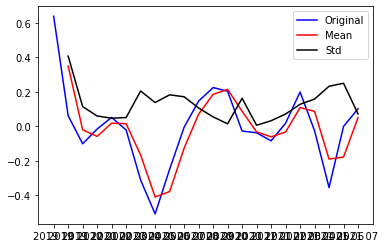

Results of Dicker-Fuller Test:
Test Statistic                 -3.516466
p-value                         0.007574
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


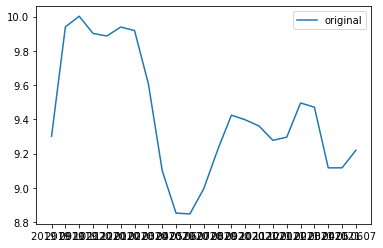

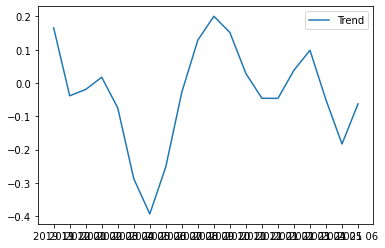

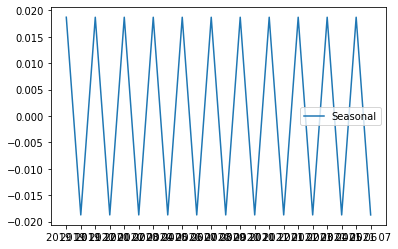

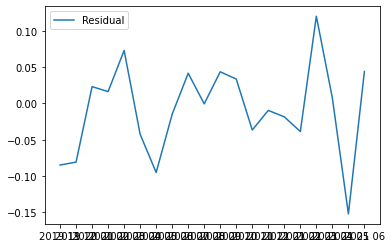

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


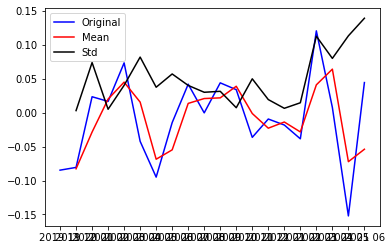

Results of Dicker-Fuller Test:
Test Statistic                 -1.602705
p-value                         0.482235
#Lags Used                      7.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


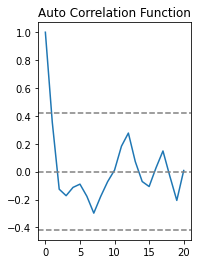

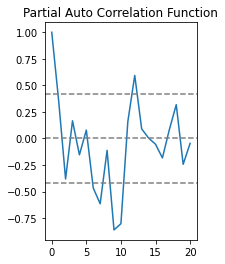

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


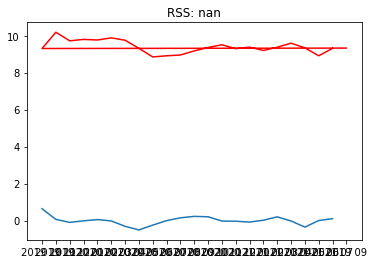

(            Total
 Date             
 2019 10  0.638677
 2019 11  0.062158
 2019 12 -0.100444
 2020 01 -0.014941
 2020 02  0.052455
 2020 03 -0.020574
 2020 04 -0.310988
 2020 05 -0.506912
 2020 06 -0.247861
 2020 07 -0.004587
 2020 08  0.146839
 2020 09  0.225374
 2020 10  0.204031
 2020 11 -0.026756
 2020 12 -0.036653
 2021 01 -0.083288
 2021 02  0.018342
 2021 03  0.199777
 2021 04 -0.024657
 2021 05 -0.353960
 2021 06  0.000000
 2021 07  0.102668,
 <statsmodels.tsa.arima_model.ARMAResultsWrapper at 0x7f74dda5fad0>)

In [ ]:
create_arima(totalads_per_month_cn)

In [ ]:
import random
print(random.randrange(1, 100))

28


In [ ]:
# pd.to_datetime(totalads_per_month.keys(), infer_datetime_format=True)
np.array(sorted(list(set(totalads_per_month.keys()))[1:]))

array(['2019 09', '2019 10', '2019 11', '2019 12', '2020 02', '2020 03',
       '2020 04', '2020 05', '2020 06', '2020 07', '2020 08', '2020 09',
       '2020 10', '2020 11', '2020 12', '2021 01', '2021 02', '2021 03',
       '2021 04', '2021 05', '2021 06', '2021 07'], dtype='<U7')

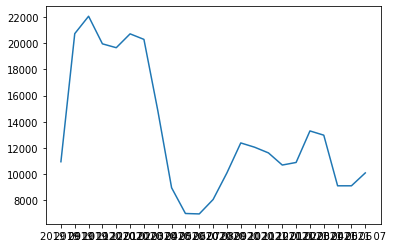

In [ ]:
import matplotlib.pyplot as plt

plt.plot(totalads_per_month_cn)

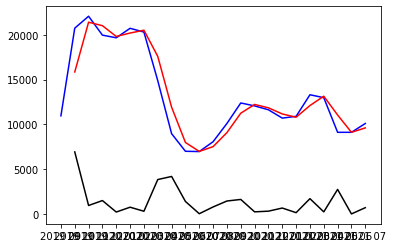

In [ ]:

rolmean = totalads_per_month_cn.rolling(window=2).mean()
rolstd= totalads_per_month_cn.rolling(window=2).std()
# print(rolmean, rolstd)

orig = plt.plot(totalads_per_month_cn, color="blue", label="Original")
mean = plt.plot(rolmean, color="red", label="Mean")
std = plt.plot(rolstd, color="black", label="Std")
plt.show(block=False)

In [ ]:
from statsmodels.tsa.stattools import adfuller
# for i in totalads_per_month_cn:
print("Results of Dicker-Fuller Test:")
dftest = adfuller(totalads_per_month_cn["Total"], autolag="AIC")

dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", "p-value", "#Lags Used", "Number of Observations Used"])
for ind, contents in dftest[4].items():
  dfoutput[f"Critical Value ({ind})"] = contents

print(dfoutput)

Results of Dicker-Fuller Test:
Test Statistic                 -2.299148
p-value                         0.172243
#Lags Used                      8.000000
Number of Observations Used    14.000000
Critical Value (1%)            -4.012034
Critical Value (5%)            -3.104184
Critical Value (10%)           -2.690987
dtype: float64


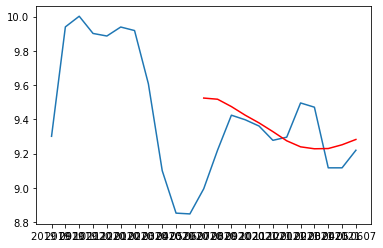

In [ ]:
#Estimating Trend

date_logScale = np.log(totalads_per_month_cn)
# date_logScale = create_dataframe(date_logScale)

plt.plot(date_logScale)

movingAverage = date_logScale.rolling(window=12).mean()
# movingAverage = create_dataframe(movingAverage)

movingSTD = date_logScale.rolling(window=12).std()
# movingSTD = create_dataframe(movingSTD)

plt.plot(movingAverage, color="red")
# plt.plot(movingSTD)

In [ ]:
#Log Scale Minus Moving Avarage

# lsmma = date_logScale - movingAverage
# lsmma.dropna(inplace=True)
# lsmma = lsmma  - movingAverage
# lsmma.dropna(inplace=True)
# lsmma = lsmma  - movingAverage
# lsmma.dropna(inplace=True)
# lsmma = lsmma  - movingAverage
# lsmma.dropna(inplace=True)
# lsmma = lsmma  - movingAverage
# lsmma.dropna(inplace=True)

lsmma = date_logScale - movingAverage
lsmma.dropna(inplace=True)

# lsmma = np.power(lsmma, 2)
# lsmma.dropna(inplace=True)

lsmma

,Total
Date,
2020 08,-0.529406
2020 09,-0.297298
2020 10,-0.050313
2020 11,-0.026705
2020 12,-0.018311
2021 01,-0.050855
2021 02,0.021073
2021 03,0.256074
2021 04,0.242779


In [ ]:
from statsmodels.tsa.stattools import adfuller

def test_stationary(timeseries):
  movingAverage = timeseries.rolling(window=2).mean()
  movingSTD= timeseries.rolling(window=2).std()

  orig = plt.plot(timeseries, color="blue", label="Original")
  mean = plt.plot(movingAverage, color="red", label="Mean")
  std = plt.plot(movingSTD, color="black", label="Std")
  plt.legend(loc="best")
  plt.show(block=False)

  # for i in totalads_per_month_cn:
  print("Results of Dicker-Fuller Test:")
  dftest = adfuller(timeseries["Total"], autolag="AIC")

  dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", "p-value", "#Lags Used", "Number of Observations Used"])
  for ind, contents in dftest[4].items():
    dfoutput[f"Critical Value ({ind})"] = contents
  print(dfoutput)

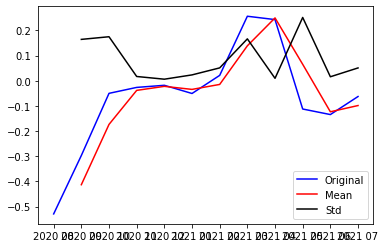

Results of Dicker-Fuller Test:
Test Statistic                -2.370433
p-value                        0.150256
#Lags Used                     4.000000
Number of Observations Used    7.000000
Critical Value (1%)           -4.938690
Critical Value (5%)           -3.477583
Critical Value (10%)          -2.843868
dtype: float64


In [ ]:
test_stationary(lsmma)

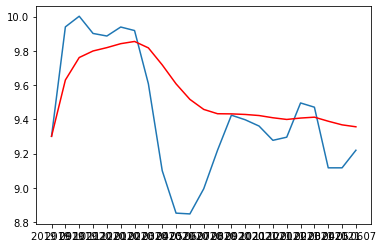

In [ ]:
#Exponential Decay Weight Avarage

expdwa = date_logScale.ewm(halflife=12, min_periods=0, adjust=True).mean()
plt.plot(date_logScale)
plt.plot(expdwa, color="red")

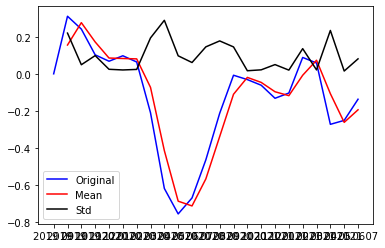

Results of Dicker-Fuller Test:
Test Statistic                 -0.234494
p-value                         0.934283
#Lags Used                      9.000000
Number of Observations Used    13.000000
Critical Value (1%)            -4.068854
Critical Value (5%)            -3.127149
Critical Value (10%)           -2.701730
dtype: float64


In [ ]:
#dataset Log Scale - Moving Exp Decay Avarage
ds_lsmedwa = date_logScale - expdwa
test_stationary(ds_lsmedwa)

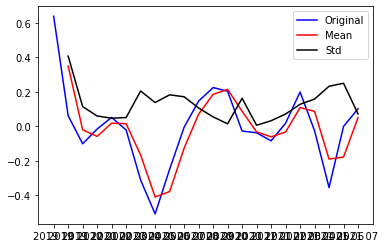

Results of Dicker-Fuller Test:
Test Statistic                 -3.516466
p-value                         0.007574
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64


In [ ]:
#dataset Log Diff Shifting

ds_lds_ls = date_logScale - date_logScale.shift()
# plt.plot(ds_lds)
ds_lds_ls.dropna(inplace=True)

test_stationary(ds_lds_ls)

In [ ]:
ds_lds_ls

,Total
Date,
2019 10,0.638677
2019 11,0.062158
2019 12,-0.100444
2020 01,-0.014941
2020 02,0.052455
2020 03,-0.020574
2020 04,-0.310988
2020 05,-0.506912
2020 06,-0.247861


In [ ]:
data_ds_lds_ls = ds_lds_ls.copy()
data_ds_lds_ls["Date"] = pd.to_datetime(data_ds_lds_ls.index, infer_datetime_format=True)
data_ds_lds_ls.set_index("Date", inplace=True)

totalads_per_month_cn_n = totalads_per_month_cn.copy()
totalads_per_month_cn_n["Date"] = pd.to_datetime(totalads_per_month_cn_n.index, infer_datetime_format=True)
totalads_per_month_cn_n.set_index("Date", inplace=True)

# data_ds_lds_lsmma = ds_lds_lsmma.copy()
# data_ds_lds_lsmma = pd.to_datetime(data_ds_lds_lsmma.index, infer_datetime_format=True)

# data_ds_lds["Date"] = pd.to_datetime(ds_lds.index, infer_datetime_format=True).strftime('%Y %m')
# data_ds_lds.set_index("Date", inplace=True)

# data_ds_lds
# data_ds_lds["Date"] = pd.to_datetime(ds_lds.index, infer_datetime_format=True)
# data_ds_lds.set_index("Date", inplace=True)

# date_logScale_n["Date"] = pd.to_datetime(date_logScale_n.index, infer_datetime_format=True)
# date_logScale_n.set_index("Date", inplace=True)



# for a, i in ds_lds.items():
#   print(i)

In [ ]:
data_ds_lds_ls

,Total
Date,
2019-10-01,0.638677
2019-11-01,0.062158
2019-12-01,-0.100444
2020-01-01,-0.014941
2020-02-01,0.052455
2020-03-01,-0.020574
2020-04-01,-0.310988
2020-05-01,-0.506912
2020-06-01,-0.247861


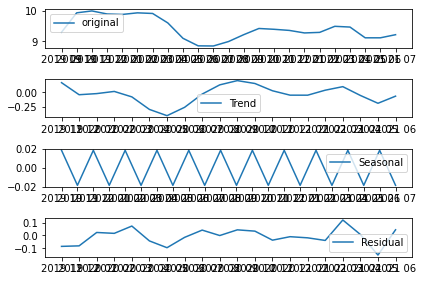

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(ds_lds_ls, freq=2)

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid
plt.subplot(411)
plt.plot(date_logScale, label="original")
plt.legend(loc="best")

plt.subplot(412)
plt.plot(trend, label="Trend")
plt.legend(loc="best")
plt.subplot(413)
plt.plot(seasonal, label="Seasonal")
plt.legend(loc="best")
plt.subplot(414)
plt.plot(residual, label="Residual")
plt.legend(loc="best")
plt.tight_layout()

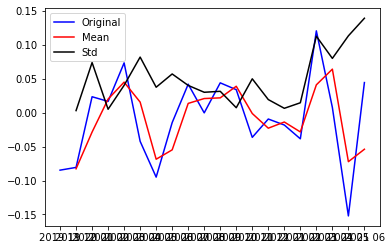

Results of Dicker-Fuller Test:
Test Statistic                 -1.602705
p-value                         0.482235
#Lags Used                      7.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64


In [ ]:
#Desompose Log Data
decomposedLogData = residual
decomposedLogData.dropna(inplace=True)
test_stationary(decomposedLogData)

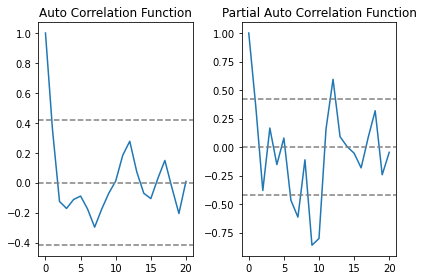

In [ ]:
#ACF and PACF Plot
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

lag_acf = acf(ds_lds_ls, nlags=20, fft=False)
lag_pacf = pacf(ds_lds_ls, nlags=20, method="ols")

#Plot ACF
plt.subplot(121)
plt.plot(lag_acf)
plt.axhline(y=0, linestyle="--", color="gray")
plt.axhline(y=-1.96/np.sqrt(len(ds_lds_ls)), linestyle="--", color="gray")
plt.axhline(y=1.96/np.sqrt(len(ds_lds_ls)), linestyle="--", color="gray")
plt.title("Auto Correlation Function")

#Plot PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0, linestyle="--", color="gray")
plt.axhline(y=-1.96/np.sqrt(len(ds_lds_ls)), linestyle="--", color="gray")
plt.axhline(y=1.96/np.sqrt(len(ds_lds_ls)), linestyle="--", color="gray")
plt.title("Partial Auto Correlation Function")

plt.tight_layout()

In [ ]:
lag_acf.shape

(21,)

In [ ]:
date_logScale

,Total
Date,
2019 09,9.301095
2019 10,9.939771
2019 11,10.001929
2019 12,9.901486
2020 01,9.886545
2020 02,9.938999
2020 03,9.918425
2020 04,9.607437
2020 05,9.100526


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


PLOTTING ARIMA


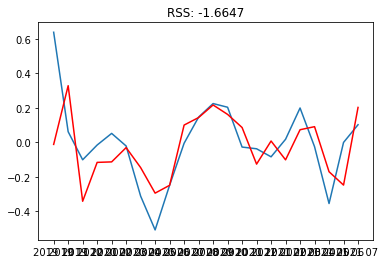

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = ARIMA(date_logScale, order=(2, 1, 2))
results_arima = model.fit(disp=-1, transparams=False)
plt.plot(ds_lds_ls)
plt.plot(results_arima.fittedvalues, color="red")
plt.title("RSS: %.4f"% sum((results_arima.fittedvalues - ds_lds_ls["Total"] ** 2)))

print("PLOTTING ARIMA")

In [ ]:
print(results_arima.summary().tables[0])
print(results_arima.summary().tables[1])
print(results_arima.summary().tables[2])

                             ARIMA Model Results                              
Dep. Variable:                D.Total   No. Observations:                   22
Model:                 ARIMA(2, 1, 2)   Log Likelihood                   8.339
Method:                       css-mle   S.D. of innovations              0.153
Date:                Mon, 04 Oct 2021   AIC                             -4.678
Time:                        12:47:42   BIC                              1.868
Sample:                    10-01-2019   HQIC                            -3.136
                         - 07-01-2021                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0114      0.019     -0.584      0.567      -0.049       0.027
ar.L1.D.Total     1.0855      0.264      4.107      0.001       0.567       1.604
ar.L2.D.Total    -0.5005      0.248     

In [ ]:
predictions_diff = pd.Series(results_arima.fittedvalues, copy=True)
predictions_diff

Date
2019 10   -0.011361
2019 11    0.328924
2019 12   -0.340859
2020 01   -0.115541
2020 02   -0.112681
2020 03   -0.029845
2020 04   -0.145605
2020 05   -0.293742
2020 06   -0.248300
2020 07    0.100719
2020 08    0.144325
2020 09    0.217157
2020 10    0.162504
2020 11    0.086540
2020 12   -0.125546
2021 01    0.008312
2021 02   -0.100831
2021 03    0.073722
2021 04    0.091406
2021 05   -0.169704
2021 06   -0.247116
2021 07    0.202913
dtype: float64

In [ ]:
predictions_diff_cumsum = predictions_diff.cumsum()
predictions_diff_cumsum

Date
2019 10   -0.011361
2019 11    0.317562
2019 12   -0.023297
2020 01   -0.138838
2020 02   -0.251519
2020 03   -0.281363
2020 04   -0.426968
2020 05   -0.720710
2020 06   -0.969010
2020 07   -0.868291
2020 08   -0.723966
2020 09   -0.506809
2020 10   -0.344305
2020 11   -0.257765
2020 12   -0.383310
2021 01   -0.374998
2021 02   -0.475829
2021 03   -0.402107
2021 04   -0.310701
2021 05   -0.480405
2021 06   -0.727521
2021 07   -0.524609
dtype: float64

In [ ]:
predictions_log = pd.Series(date_logScale["Total"], index=date_logScale.index)
predictions_log = predictions_log.add(predictions_diff_cumsum, fill_value=0)
predictions_log

Date
2019 09     9.301095
2019 10     9.928410
2019 11    10.319491
2019 12     9.878189
2020 01     9.747707
2020 02     9.687481
2020 03     9.637062
2020 04     9.180469
2020 05     8.379815
2020 06     7.883655
2020 07     7.979788
2020 08     8.270951
2020 09     8.713482
2020 10     9.080017
2020 11     9.139802
2020 12     8.977603
2021 01     8.902627
2021 02     8.820138
2021 03     9.093638
2021 04     9.160387
2021 05     8.636723
2021 06     8.389607
2021 07     8.695187
dtype: float64

Date
2019 09    10950.000000
2019 10    20504.708341
2019 11    30317.834727
2019 12    19500.367403
2020 01    17114.943193
2020 02    16114.598941
2020 03    15322.262925
2020 04     9705.701665
2020 05     4358.203630
2020 06     2653.553459
2020 07     2921.310295
2020 08     3908.665003
2020 09     6084.388882
2020 10     8778.118606
2020 11     9318.917355
2020 12     7923.614682
2021 01     7351.258149
2021 02     6769.200782
2021 03     8898.500951
2021 04     9512.738833
2021 05     5634.834137
2021 06     4401.087291
2021 07     5974.089414
dtype: float64


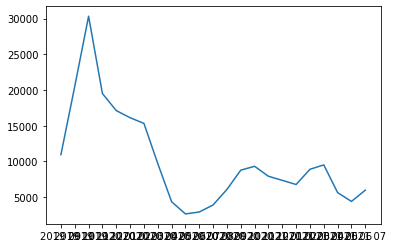

In [ ]:
predictions_arima = np.exp(predictions_log)
print(predictions_arima)

plt.plot(predictions_arima)

In [ ]:
print(len(date_logScale))

23


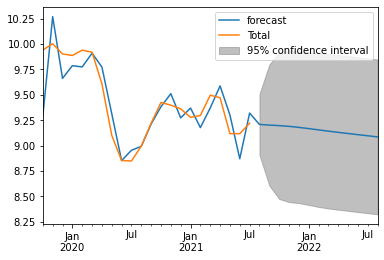

In [ ]:
STEPS = 12

results_arima.plot_predict(1, len(date_logScale) + STEPS)
x = results_arima.forecast(steps=STEPS)

In [ ]:
print(np.exp(x[2]))

[[ 7391.40110554 13455.46870014]
 [ 5467.14872952 17971.28725348]
 [ 4792.32483387 20288.95232107]]


In [ ]:
len(x[1])

3

In [ ]:
np.exp(x[1])

array([1.16512264, 1.35470217, 1.44503644])

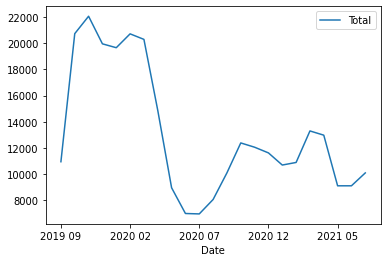

In [ ]:
totalads_per_month_cn.plot()

## ARIMA INDUSTRY

In [ ]:
data = pd.DataFrame(real_data)

# data = pd.DataFrame(real_data).drop(columns=uncolumns2)

In [ ]:
data

,industry,title,location,experience,category,salary_currency,salary_min,salary_max,description,requirement,ads_start,ads_end,company,company_industry,company_size,company_nearby_transportation,company_hq,company_web,scraper_uuid,scraper_timestamp,kode,pend_min,gender,company_sizecategory,degree_categories,category_code,location_code,industry_code,adsstart_per_month,adsend_per_month,adslen_total
0,retail distribusi,Supervisor Sales (jakarta Raya),jakarta raya,NaN,Sales & Business Development,NaN,NaN,NaN,NaN,usia maksimal 35 tahun; lulusan minimal d iii ...,43780,43788,Selatan Jaya Prima Perkasa PT,Retail & Wholesale Trading,11 - 50 employees,Stasiun Buaran,"kawasan industri pulogadung blok iii.jj.10, ja...",https://www.sejaya.com,a0d6e078-638e-4409-bc1e-4b63386ae76f,2019-11-18 08:07:52.021000+07:00,MTA2NjE5,D2,2,4.0,3,24.0,260.0,10,3,3,[3]
1,pendidikan pelatihan,Wakil Direktur Medik,tangerang,NaN,Administrative & Customer Relationship,NaN,NaN,NaN,NaN,NaN,43791,43814,Yayasan Abdi Karya,Education & Training,1001 - 5000 employees,NaN,graha yadika jl. raden saleh no. 11 karang te...,http://yadika.or.id/,b32c49a2-afcf-4c74-ad24-d5404fc564b1,2019-11-25 08:19:03.104000+07:00,MTA5OTcz,Tidak Tercantum,2,6.0,7,154.0,66.0,14,3,4,"[3, 4]"
2,it telekomunikasi,Creative Web Designer,bandung,Fresh Graduate akan dipertimbangkan,Design,IDR,2500000.0,3500000.0,design web sites and ensure they are visually ...,NaN,43866,43896,Walden Global Services PT,IT & Telecommunication,201 - 500 employees,Leuwipanjang,jl. soekarno hatta no. 104 babakan ciparay ban...,https://www.wgs.co.id,8b9c622b-a35a-466f-b258-32f3aa85441f,2020-02-10 08:21:05.594000+07:00,MTAzMDky,Tidak Tercantum,2,2.0,7,124.0,203.0,11,6,7,"[6, 7]"
3,makanan minuman,Accounting Staff,sukoharjo,NaN,Accounting & Finance,NaN,NaN,NaN,NaN,"pria/wanita; pendidikan min. s1 akuntansi,; ma...",43740,43759,Ara Savis Sejahtera PT,Food & Beverage,NaN,NaN,"jl. kencur no.24c, grogol, kwarasan - sukoharjo.",http://www.savistea.com/,7f79a714-fdc9-42d9-9dde-aeab1a7101a2,2019-10-07 08:00:50.466000+07:00,MTE5NTA2,S1,2,NaN,6,97.0,2.0,37,2,2,[2]
4,makanan minuman,Tukang Bubut,sidoarjo,NaN,Supply Chain & Logistic,NaN,NaN,NaN,NaN,usia maksimal 35 tahun; pendidikan minimal smk...,43735,43765,Surya Agung Abadi UD,Food & Beverage,51 - 200 employees,NaN,jl. sadang tangkis no.18 kec. taman - kab. sid...,NaN,e734bf75-4587-4d27-a95d-2f7e0e296395,2019-09-30 08:00:54.120000+07:00,MTEyNjk3,SMK,2,7.0,2,28.0,212.0,37,1,2,"[1, 2]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164908,pendidikan pelatihan,Guru Biologi,jabodetabek,NaN,Education & Science,NaN,NaN,NaN,NaN,NaN,44385,44399,Alexandria Islamic School,Education & Training,51 - 200 employees,Stasiun Bekasi/Terminal Bekasi,jl. pengasinan raya no 50 rawa lumbu bekasi ti...,https://alexandriaschool.sch.id,b2530909-6148-4aae-bd8b-ab984f4289a5,2021-07-13 03:13:38,MzEwOTEx,Tidak Tercantum,2,7.0,7,5.0,21.0,14,23,23,[23]
164909,pendidikan pelatihan,Admin Accounting,jabodetabek,NaN,Administrative & Customer Relationship,NaN,NaN,NaN,NaN,NaN,44378,44408,Alexandria Islamic School,Education & Training,51 - 200 employees,Stasiun Bekasi/Terminal Bekasi,jl. pengasinan raya no 50 rawa lumbu bekasi ti...,https://alexandriaschool.sch.id,b2530909-6148-4aae-bd8b-ab984f4289a5,2021-07-13 03:24:28,MzExMTkw,Tidak Tercantum,2,7.0,7,154.0,21.0,14,23,23,[23]
164910,pendidikan pelatihan,Cashier & Waiters,jabodetabek,Fresh Graduate akan dipertimbangkan,General Worker,NaN,NaN,NaN,NaN,NaN,44384,44414,Alexandria Islamic School,Education & Training,51 - 200 employees,Stasiun Bekasi/Terminal Bekasi,jl. pengasinan raya no 50 rawa lumbu bekasi ti...,https://alexandriaschool.sch.id,b2530909-6148-4aae-bd8b-ab984f4289a5,2021-07-13 03:14:57,MzExNDU2,Tidak Tercantum,2,7.0,7,36.0,21.0,14,23,24,"[23, 24]"
164911,pendidikan pelatihan,Koordinator Cleaning Service,jabodetabek,NaN,Tour & Travel,NaN,NaN,NaN,NaN,NaN,44384,44414,Alexandria 

In [ ]:
from  datetime import datetime
datestart_converter = [datetime.fromordinal(datetime(1900, 1, 1).toordinal() + content - 2) for content in data["ads_end"]]
datestart_converter = [pd.to_datetime(date, infer_datetime_format=True).strftime('%Y %m') for date in datestart_converter]
date_feature = sorted(list(set(datestart_converter)))
# len(date_feature)

In [ ]:
industry_feature = sorted(list(set(data["industry"])))
features_var = [i.replace(" ", "") for i in industry_feature]
features_var

['alatberatperalatanindustri',
 'alatelektronikperlengkapandanperabotanrumahtanggakantor',
 'asuransi',
 'bahanbangunansanitary',
 'bahankimiaindustri',
 'busanatekstilfashion',
 'businessprocessoutsourcingbpo',
 'conglomerateholdingcompany',
 'engineeringprocurementconstructionepc',
 'fmcg',
 'hiburan',
 'ittelekomunikasi',
 'jasalainnya',
 'kecantikankesehatan',
 'kertasdanprodukhutan',
 'komputerithardware',
 'konsultanbisnismanajemen',
 'konsultanitiptek',
 'konsultanlegalriset',
 'layanankesehatanfarmasi',
 'lembagapemerintahnonprofitngofacilitaspublik',
 'lingkunganjasaperawatanperbaikanfasilitas',
 'makananminuman',
 'manufacturing',
 'manufakturelektronik',
 'manufakturlainnya',
 'mediahiburanperiklanan',
 'mekaniklistrik',
 'otomotifkomponen',
 'pendidikanpelatihan',
 'pengapalan',
 'penginapanperjalananpariwisata',
 'perbankanlembagapembiayaan',
 'percetakandankemasan',
 'percetakanpenerbitan',
 'perdagangankomoditas',
 'perdaganganumum',
 'perhiasanbarangmewah',
 'pertambang

In [ ]:
from collections import defaultdict

for (indv, variables) in enumerate(features_var):
  exec(f'globals()[f"{variables}"] = pd.DataFrame([data.loc[data["industry"] == industry_feature[{indv}]]["industry"], data.loc[data["industry"] == industry_feature[{indv}]]["adslen_total"]] ).swapaxes("index", "columns")')

In [ ]:
def convert_total(data, data_str):
  exec(f'globals()[f"{data_str}_c"] = defaultdict(list)')
  for ind, contents in enumerate(data["adslen_total"]):
    for content in json.loads(contents):
      for ranges in range(24):
        if ranges == content:
          # totalads_per_month[date_feature[content - 1]].append([ind, date_feature[content - 1]])
          eval(f"{data_str}_c['{date_feature[content - 1]}'].append([date_feature[content - 1]])")
  return eval(f"{data_str}_c")

In [ ]:
#Total without Count
for indv, variables in enumerate(features_var):
  exec(f"globals()[f'total_{variables}'] = convert_total({variables}, '{variables}')")

In [ ]:
def count_total(data, data_str):
  exec(f'globals()[f"{data_str}_new"] = {data_str}.copy()')
  for datas in data.keys():
    exec(f"{data_str}_new['{datas}'] = (int(np.array({data_str}_new['{datas}']).size))")
  return eval(f"{data_str}_new")

In [ ]:
#Total with Count
for indv, variables in enumerate(features_var):
  exec(f"globals()[f'total_{variables}_cn'] = count_total(total_{variables}, 'total_{variables}')")
  exec(f"globals()[f'total_{variables}_cn'] = create_dataframe(total_{variables}_cn)")

In [ ]:
total_perbankanlembagapembiayaan_cn

,Total
Date,
2019 09,1125
2019 10,2402
2019 11,2700
2019 12,2325
2020 01,1990
2020 02,2178
2020 03,2289
2020 04,1796
2020 05,1203


perbankan lembaga pembiayaan

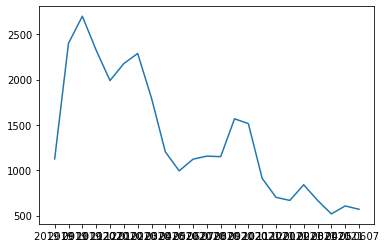

********************************************************************************
********************************************************************************
******************************************************************************** 



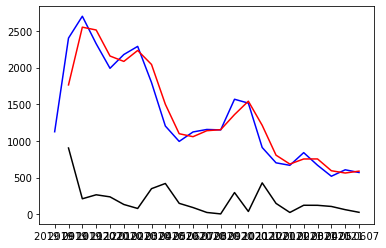

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                  1.055531
p-value                         0.994819
#Lags Used                      9.000000
Number of Observations Used    13.000000
Critical Value (1%)            -4.068854
Critical Value (5%)            -3.127149
Critical Value (10%)           -2.701730
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


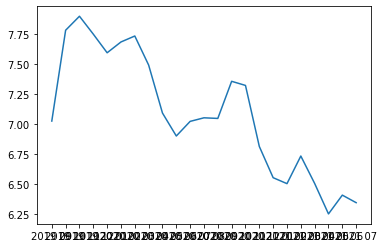

				Moving Everage


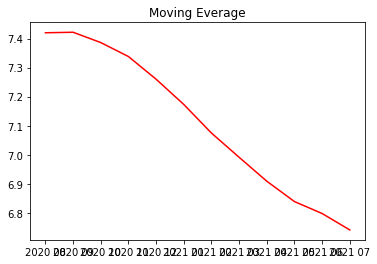

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


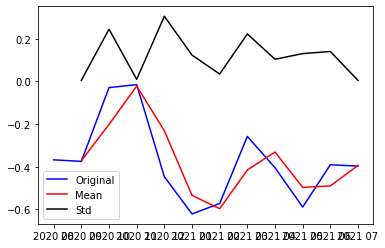

Results of Dicker-Fuller Test:
Test Statistic                 -2.714124
p-value                         0.071626
#Lags Used                      1.000000
Number of Observations Used    10.000000
Critical Value (1%)            -4.331573
Critical Value (5%)            -3.232950
Critical Value (10%)           -2.748700
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


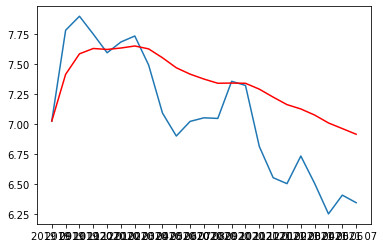

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


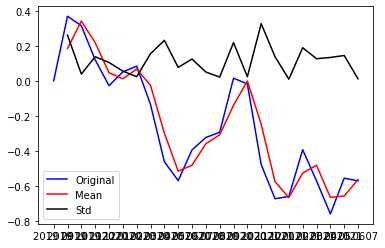

Results of Dicker-Fuller Test:
Test Statistic                  3.287263
p-value                         1.000000
#Lags Used                      9.000000
Number of Observations Used    13.000000
Critical Value (1%)            -4.068854
Critical Value (5%)            -3.127149
Critical Value (10%)           -2.701730
dtype: float64
				dataset Log Diff Shifting


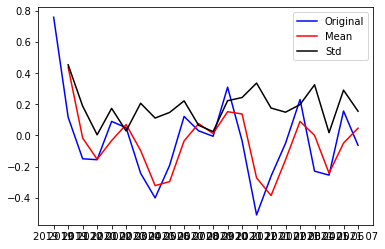

Results of Dicker-Fuller Test:
Test Statistic                 -0.551245
p-value                         0.881622
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


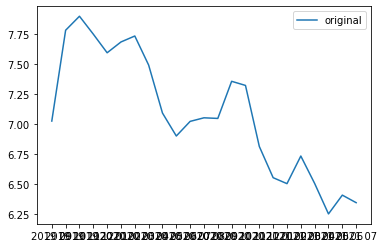

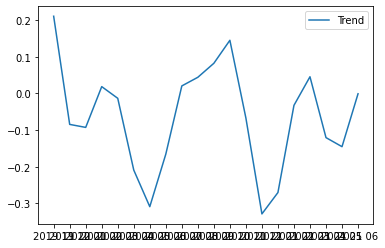

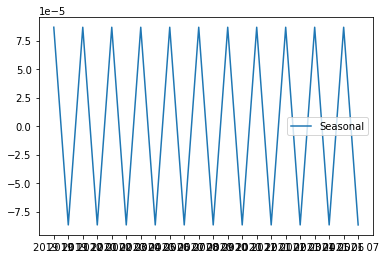

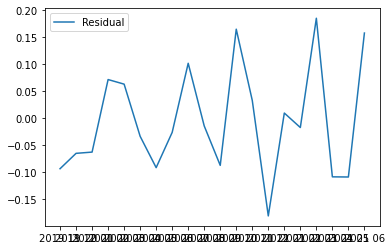

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


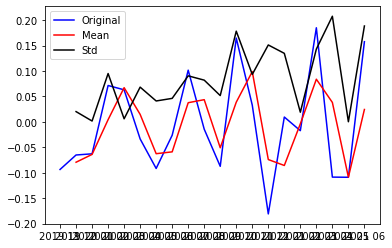

Results of Dicker-Fuller Test:
Test Statistic                 -5.175858
p-value                         0.000010
#Lags Used                      7.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


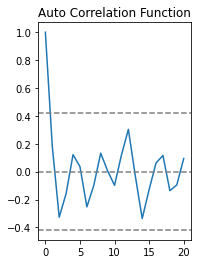

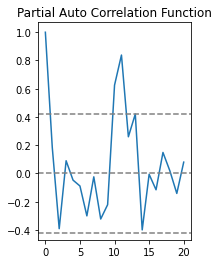

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


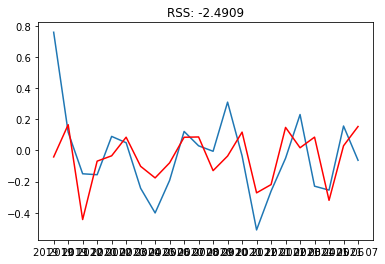

In [ ]:
perbankanlembagapembiayaan_logdiff, perbankanlembagapembiayaan_arima = create_arima(total_perbankanlembagapembiayaan_cn, 2,1,1)

		predictions_diff
Date
2019 10   -0.041443
2019 11    0.165366
2019 12   -0.443164
2020 01   -0.068484
2020 02   -0.034236
2020 03    0.085133
2020 04   -0.101684
2020 05   -0.176026
2020 06   -0.079216
2020 07    0.084735
2020 08    0.086646
2020 09   -0.129364
2020 10   -0.035734
2020 11    0.117713
2020 12   -0.271870
2021 01   -0.218981
2021 02    0.147908
2021 03    0.017350
2021 04    0.085548
2021 05   -0.319913
2021 06    0.030084
2021 07    0.153658
dtype: float64 


		predictions_diff_cumsum
Date
2019 10   -0.041443
2019 11    0.123922
2019 12   -0.319241
2020 01   -0.387725
2020 02   -0.421961
2020 03   -0.336828
2020 04   -0.438513
2020 05   -0.614538
2020 06   -0.693755
2020 07   -0.609020
2020 08   -0.522374
2020 09   -0.651738
2020 10   -0.687472
2020 11   -0.569759
2020 12   -0.841629
2021 01   -1.060610
2021 02   -0.912702
2021 03   -0.895352
2021 04   -0.809804
2021 05   -1.129718
2021 06   -1.099634
2021 07   -0.945975
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


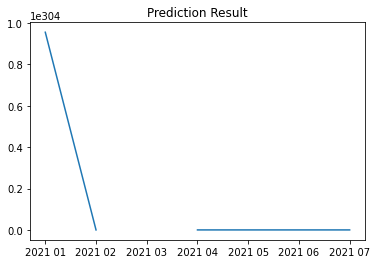

<Figure size 432x288 with 0 Axes>

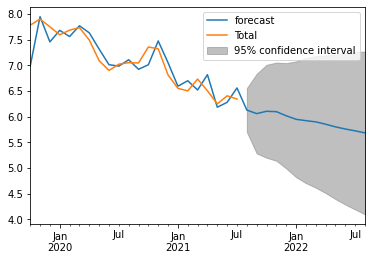

In [ ]:
perbankanlembagapembiayaan_forecast_result = after_arima(total_perbankanlembagapembiayaan_cn, perbankanlembagapembiayaan_arima, 12)

konsultan legal riset

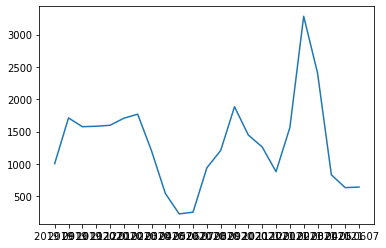

********************************************************************************
********************************************************************************
******************************************************************************** 



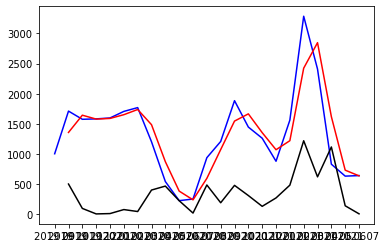

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -2.784226
p-value                         0.060562
#Lags Used                      8.000000
Number of Observations Used    14.000000
Critical Value (1%)            -4.012034
Critical Value (5%)            -3.104184
Critical Value (10%)           -2.690987
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


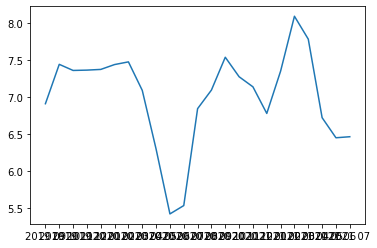

				Moving Everage


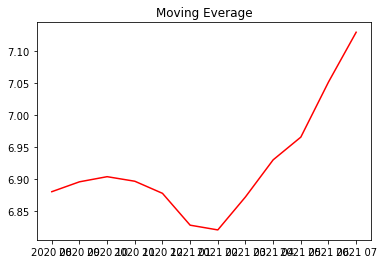

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


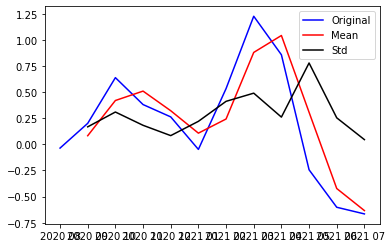

Results of Dicker-Fuller Test:
Test Statistic                 -2.846102
p-value                         0.051984
#Lags Used                      1.000000
Number of Observations Used    10.000000
Critical Value (1%)            -4.331573
Critical Value (5%)            -3.232950
Critical Value (10%)           -2.748700
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


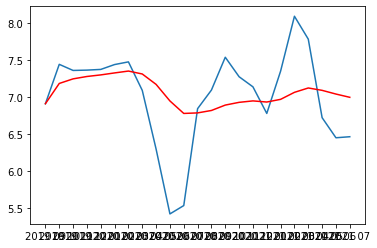

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


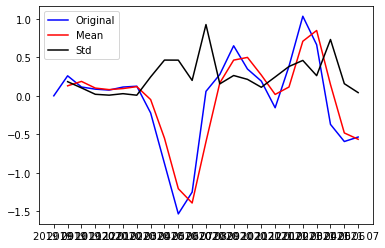

Results of Dicker-Fuller Test:
Test Statistic                 -0.386739
p-value                         0.912289
#Lags Used                      9.000000
Number of Observations Used    13.000000
Critical Value (1%)            -4.068854
Critical Value (5%)            -3.127149
Critical Value (10%)           -2.701730
dtype: float64
				dataset Log Diff Shifting


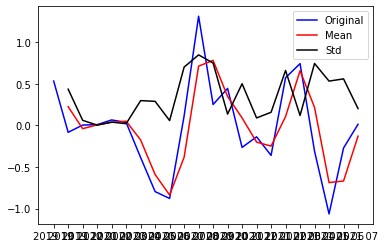

Results of Dicker-Fuller Test:
Test Statistic                 -3.236484
p-value                         0.017968
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


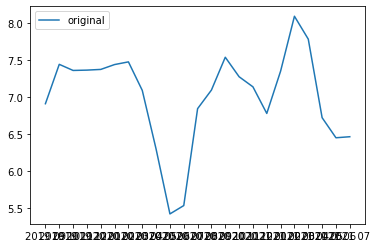

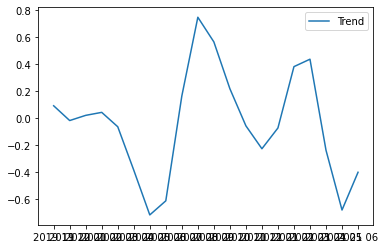

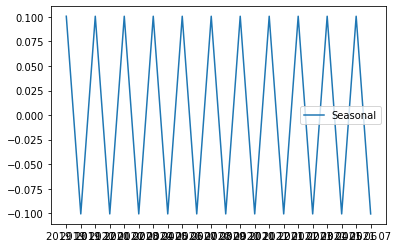

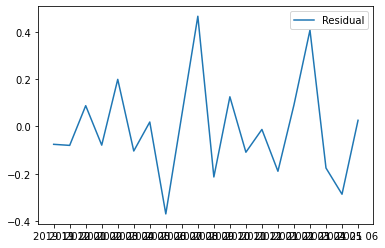

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


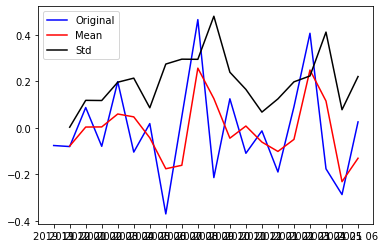

Results of Dicker-Fuller Test:
Test Statistic                 -4.774371
p-value                         0.000061
#Lags Used                      5.000000
Number of Observations Used    14.000000
Critical Value (1%)            -4.012034
Critical Value (5%)            -3.104184
Critical Value (10%)           -2.690987
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


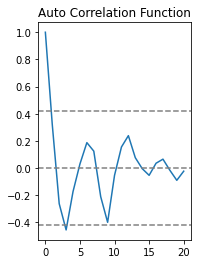

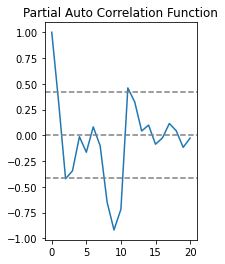

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


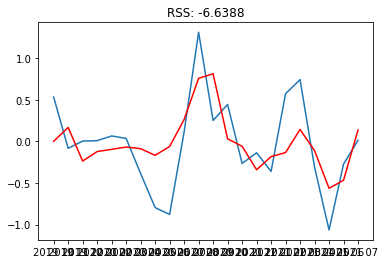

In [ ]:
konsultanlegalriset_logdiff, konsultanlegalriset_arima = create_arima(total_konsultanlegalriset_cn, 2,1,1)

		predictions_diff
Date
2019 10    0.001313
2019 11    0.168352
2019 12   -0.236352
2020 01   -0.121946
2020 02   -0.095018
2020 03   -0.067649
2020 04   -0.087198
2020 05   -0.167344
2020 06   -0.061147
2020 07    0.263465
2020 08    0.759877
2020 09    0.814383
2020 10    0.031245
2020 11   -0.058092
2020 12   -0.340934
2021 01   -0.183029
2021 02   -0.134136
2021 03    0.144535
2021 04   -0.111386
2021 05   -0.563936
2021 06   -0.467254
2021 07    0.137909
dtype: float64 


		predictions_diff_cumsum
Date
2019 10    0.001313
2019 11    0.169665
2019 12   -0.066687
2020 01   -0.188633
2020 02   -0.283652
2020 03   -0.351300
2020 04   -0.438498
2020 05   -0.605842
2020 06   -0.666989
2020 07   -0.403524
2020 08    0.356353
2020 09    1.170736
2020 10    1.201981
2020 11    1.143890
2020 12    0.802955
2021 01    0.619926
2021 02    0.485790
2021 03    0.630326
2021 04    0.518940
2021 05   -0.044996
2021 06   -0.512251
2021 07   -0.374342
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


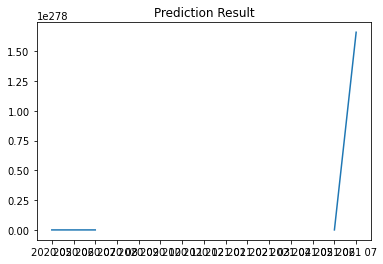

<Figure size 432x288 with 0 Axes>

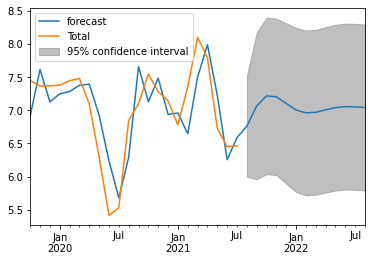

In [ ]:
konsultanlegalriset_forecast_result = after_arima(total_konsultanlegalriset_cn, konsultanlegalriset_arima, 12)

it telekomunikasi

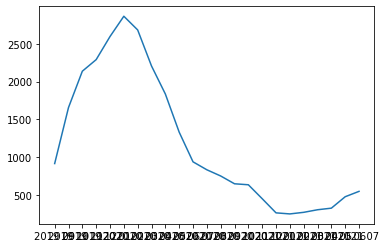

********************************************************************************
********************************************************************************
******************************************************************************** 



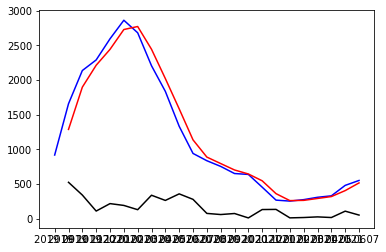

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -2.104945
p-value                         0.242531
#Lags Used                      9.000000
Number of Observations Used    13.000000
Critical Value (1%)            -4.068854
Critical Value (5%)            -3.127149
Critical Value (10%)           -2.701730
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


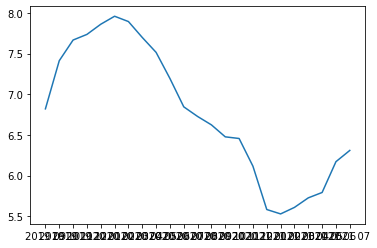

				Moving Everage


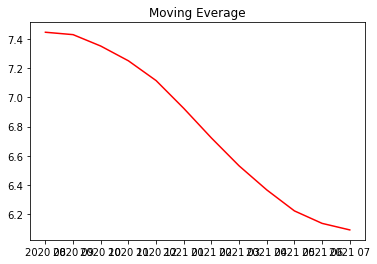

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


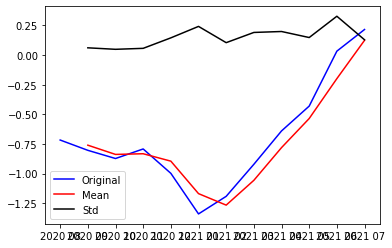

Results of Dicker-Fuller Test:
Test Statistic                -1.812259
p-value                        0.374393
#Lags Used                     4.000000
Number of Observations Used    7.000000
Critical Value (1%)           -4.938690
Critical Value (5%)           -3.477583
Critical Value (10%)          -2.843868
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


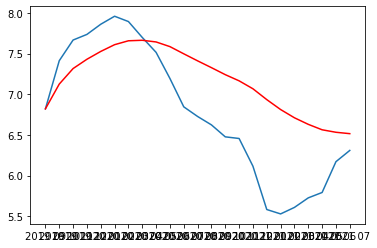

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


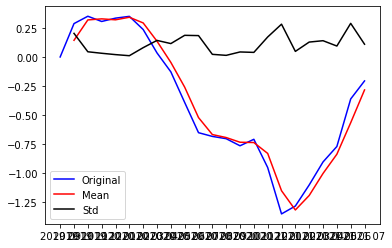

Results of Dicker-Fuller Test:
Test Statistic                 -2.632397
p-value                         0.086485
#Lags Used                      9.000000
Number of Observations Used    13.000000
Critical Value (1%)            -4.068854
Critical Value (5%)            -3.127149
Critical Value (10%)           -2.701730
dtype: float64
				dataset Log Diff Shifting


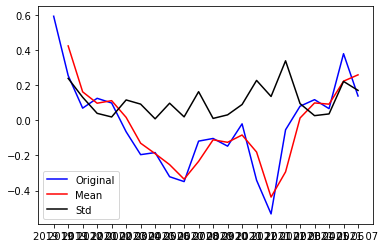

Results of Dicker-Fuller Test:
Test Statistic                 -2.998941
p-value                         0.034993
#Lags Used                      0.000000
Number of Observations Used    21.000000
Critical Value (1%)            -3.788386
Critical Value (5%)            -3.013098
Critical Value (10%)           -2.646397
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


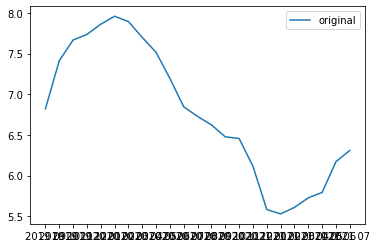

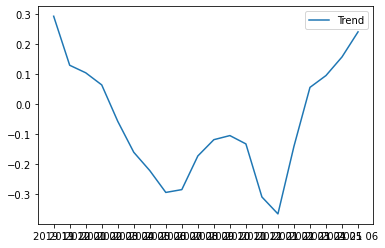

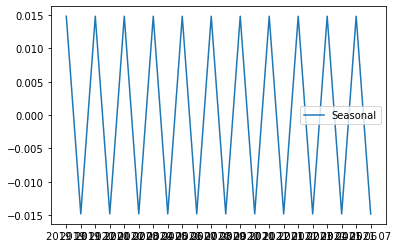

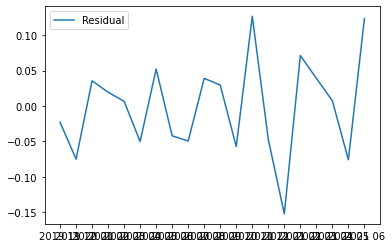

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


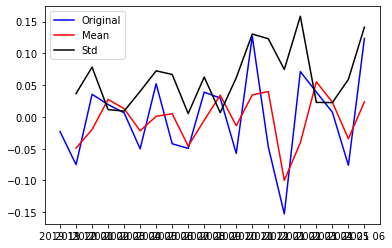

Results of Dicker-Fuller Test:
Test Statistic                 -1.653578
p-value                         0.455175
#Lags Used                      7.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


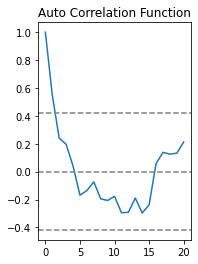

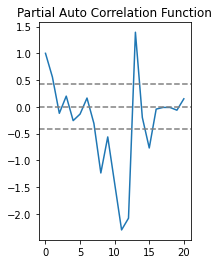

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


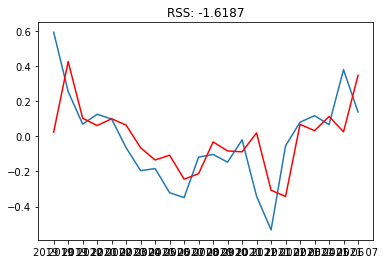

In [ ]:
ittelekomunikasi_logdiff, ittelekomunikasi_arima = create_arima(total_ittelekomunikasi_cn, 2,1,1)

		predictions_diff
Date
2019 10    0.023503
2019 11    0.424615
2019 12    0.102982
2020 01    0.061144
2020 02    0.099660
2020 03    0.063667
2020 04   -0.065346
2020 05   -0.134836
2020 06   -0.107466
2020 07   -0.244019
2020 08   -0.212616
2020 09   -0.032005
2020 10   -0.083327
2020 11   -0.088340
2020 12    0.019256
2021 01   -0.306870
2021 02   -0.342206
2021 03    0.068177
2021 04    0.031886
2021 05    0.112947
2021 06    0.025554
2021 07    0.346812
dtype: float64 


		predictions_diff_cumsum
Date
2019 10    0.023503
2019 11    0.448118
2019 12    0.551100
2020 01    0.612244
2020 02    0.711904
2020 03    0.775572
2020 04    0.710225
2020 05    0.575389
2020 06    0.467923
2020 07    0.223904
2020 08    0.011288
2020 09   -0.020717
2020 10   -0.104045
2020 11   -0.192385
2020 12   -0.173129
2021 01   -0.479999
2021 02   -0.822205
2021 03   -0.754028
2021 04   -0.722142
2021 05   -0.609195
2021 06   -0.583641
2021 07   -0.236829
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


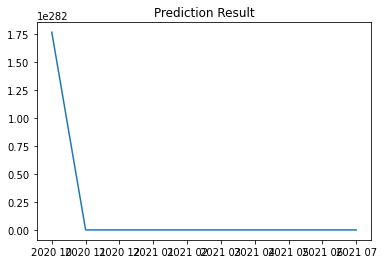

<Figure size 432x288 with 0 Axes>

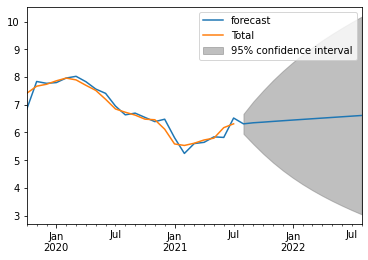

In [ ]:
ittelekomunikasi_forecast_result = after_arima(total_ittelekomunikasi_cn, ittelekomunikasi_arima, 12)

perdagangan komoditas

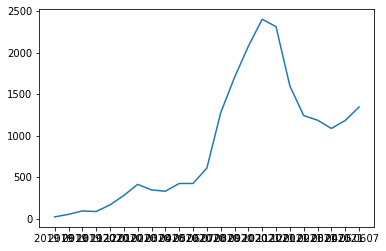

********************************************************************************
********************************************************************************
******************************************************************************** 



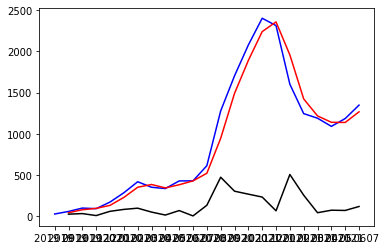

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                -5.677030e+00
p-value                        8.657417e-07
#Lags Used                     9.000000e+00
Number of Observations Used    1.300000e+01
Critical Value (1%)           -4.068854e+00
Critical Value (5%)           -3.127149e+00
Critical Value (10%)          -2.701730e+00
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


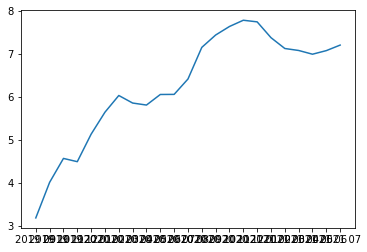

				Moving Everage


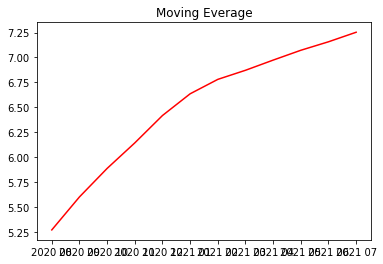

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


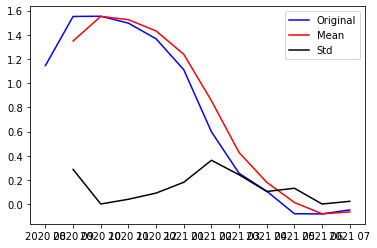

Results of Dicker-Fuller Test:
Test Statistic                 -2.117119
p-value                         0.237687
#Lags Used                      1.000000
Number of Observations Used    10.000000
Critical Value (1%)            -4.331573
Critical Value (5%)            -3.232950
Critical Value (10%)           -2.748700
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


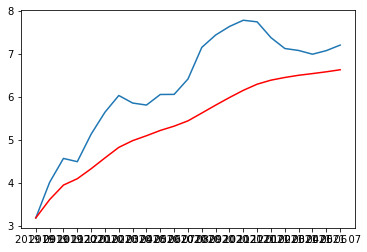

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


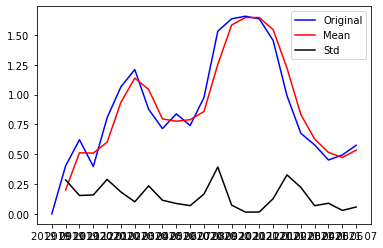

Results of Dicker-Fuller Test:
Test Statistic                 -3.144192
p-value                         0.023451
#Lags Used                      8.000000
Number of Observations Used    14.000000
Critical Value (1%)            -4.012034
Critical Value (5%)            -3.104184
Critical Value (10%)           -2.690987
dtype: float64
				dataset Log Diff Shifting


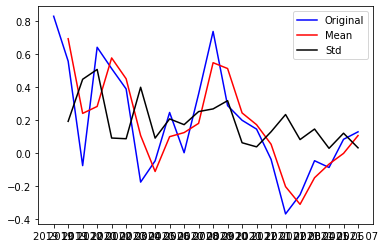

Results of Dicker-Fuller Test:
Test Statistic                  1.024137
p-value                         0.994514
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


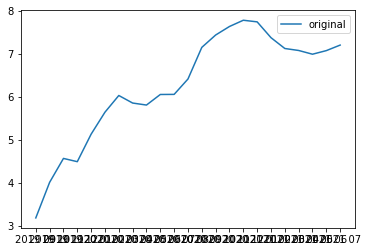

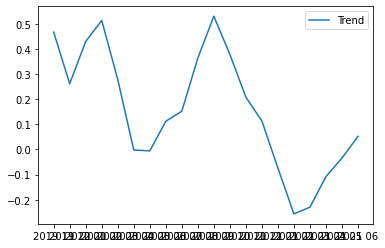

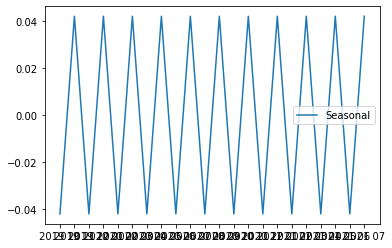

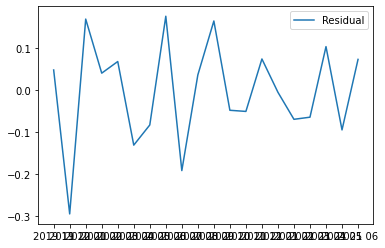

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


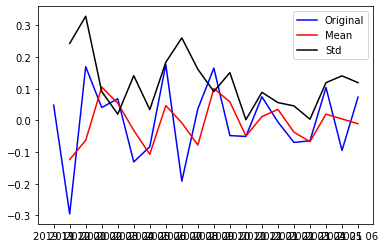

Results of Dicker-Fuller Test:
Test Statistic                 -1.720551
p-value                         0.420556
#Lags Used                      8.000000
Number of Observations Used    11.000000
Critical Value (1%)            -4.223238
Critical Value (5%)            -3.189369
Critical Value (10%)           -2.729839
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


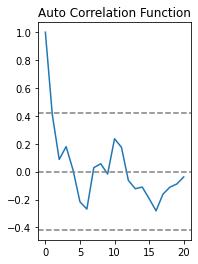

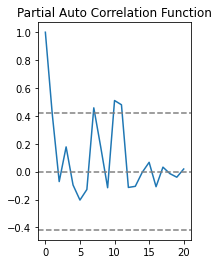

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


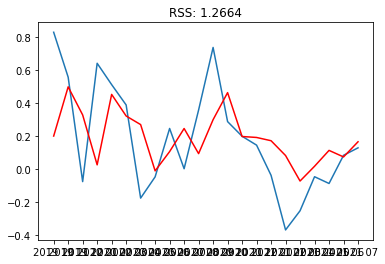

In [ ]:
perdagangankomoditas_logdiff, perdagangankomoditas_arima = create_arima(total_perdagangankomoditas_cn, 2,1,0)

		predictions_diff
Date
2019 10    0.200274
2019 11    0.498473
2019 12    0.328358
2020 01    0.025923
2020 02    0.452624
2020 03    0.321896
2020 04    0.269796
2020 05   -0.010651
2020 06    0.106166
2020 07    0.246100
2020 08    0.093959
2020 09    0.299547
2020 10    0.463418
2020 11    0.197599
2020 12    0.191806
2021 01    0.172005
2021 02    0.082272
2021 03   -0.072115
2021 04    0.017317
2021 05    0.113457
2021 06    0.073907
2021 07    0.165683
dtype: float64 


		predictions_diff_cumsum
Date
2019 10    0.200274
2019 11    0.698747
2019 12    1.027105
2020 01    1.053029
2020 02    1.505652
2020 03    1.827548
2020 04    2.097344
2020 05    2.086693
2020 06    2.192859
2020 07    2.438959
2020 08    2.532918
2020 09    2.832465
2020 10    3.295882
2020 11    3.493481
2020 12    3.685287
2021 01    3.857292
2021 02    3.939564
2021 03    3.867449
2021 04    3.884765
2021 05    3.998223
2021 06    4.072129
2021 07    4.237812
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


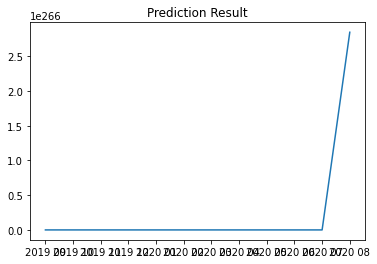

<Figure size 432x288 with 0 Axes>

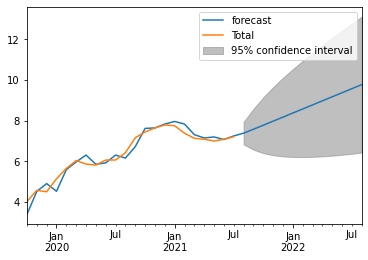

In [ ]:
perdagangankomoditas_forecast_result = after_arima(total_perdagangankomoditas_cn, perdagangankomoditas_arima, 12)

retail distribusi

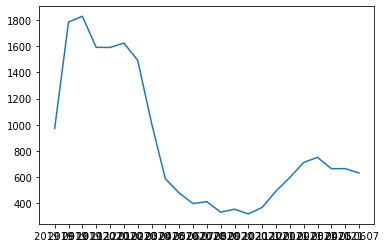

********************************************************************************
********************************************************************************
******************************************************************************** 



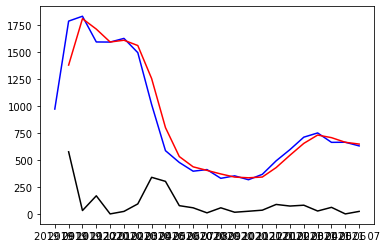

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -1.979959
p-value                         0.295429
#Lags Used                      9.000000
Number of Observations Used    13.000000
Critical Value (1%)            -4.068854
Critical Value (5%)            -3.127149
Critical Value (10%)           -2.701730
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


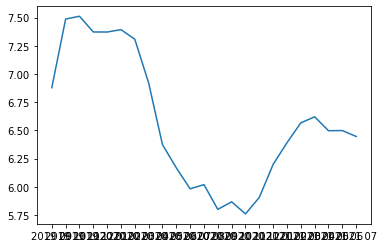

				Moving Everage


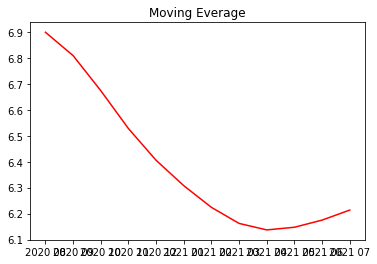

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


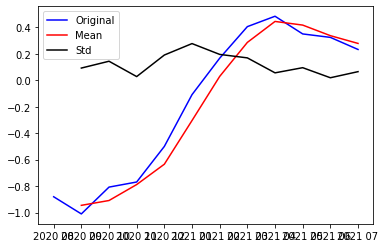

Results of Dicker-Fuller Test:
Test Statistic                -0.994449
p-value                        0.755283
#Lags Used                     4.000000
Number of Observations Used    7.000000
Critical Value (1%)           -4.938690
Critical Value (5%)           -3.477583
Critical Value (10%)          -2.843868
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


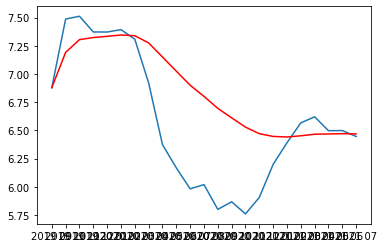

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


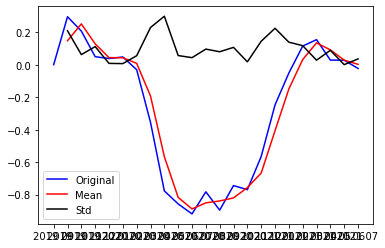

Results of Dicker-Fuller Test:
Test Statistic                 -2.129119
p-value                         0.232968
#Lags Used                      9.000000
Number of Observations Used    13.000000
Critical Value (1%)            -4.068854
Critical Value (5%)            -3.127149
Critical Value (10%)           -2.701730
dtype: float64
				dataset Log Diff Shifting


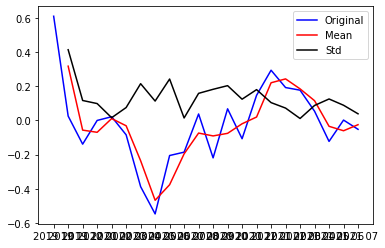

Results of Dicker-Fuller Test:
Test Statistic                 -3.741018
p-value                         0.003572
#Lags Used                      0.000000
Number of Observations Used    21.000000
Critical Value (1%)            -3.788386
Critical Value (5%)            -3.013098
Critical Value (10%)           -2.646397
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


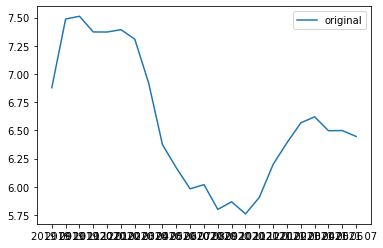

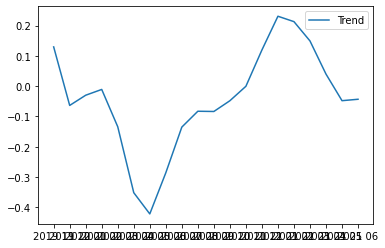

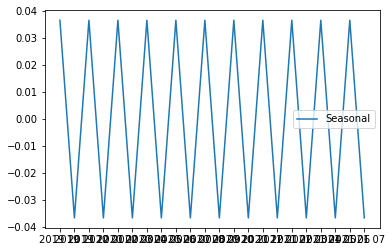

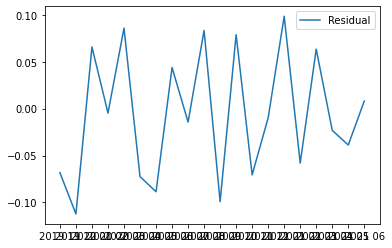

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


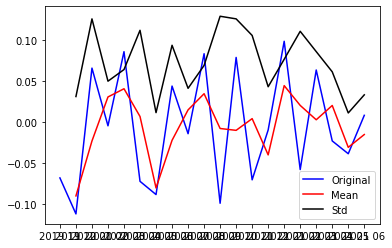

Results of Dicker-Fuller Test:
Test Statistic                  1.075976
p-value                         0.995006
#Lags Used                      8.000000
Number of Observations Used    11.000000
Critical Value (1%)            -4.223238
Critical Value (5%)            -3.189369
Critical Value (10%)           -2.729839
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


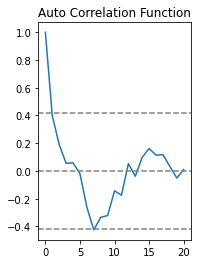

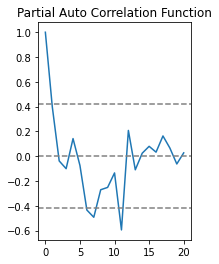

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


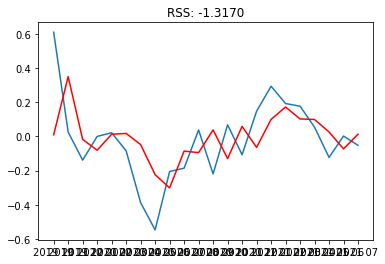

In [ ]:
retaildistribusi_logdiff, retaildistribusi_arima = create_arima(total_retaildistribusi_cn, 2,1,0)

		predictions_diff
Date
2019 10    0.009109
2019 11    0.349343
2019 12   -0.017898
2020 01   -0.081185
2020 02    0.012285
2020 03    0.016946
2020 04   -0.048094
2020 05   -0.224097
2020 06   -0.301624
2020 07   -0.086359
2020 08   -0.095294
2020 09    0.037886
2020 10   -0.130186
2020 11    0.058093
2020 12   -0.064658
2021 01    0.098875
2021 02    0.171675
2021 03    0.101748
2021 04    0.098691
2021 05    0.025580
2021 06   -0.073275
2021 07    0.012594
dtype: float64 


		predictions_diff_cumsum
Date
2019 10    0.009109
2019 11    0.358453
2019 12    0.340555
2020 01    0.259369
2020 02    0.271654
2020 03    0.288600
2020 04    0.240506
2020 05    0.016409
2020 06   -0.285215
2020 07   -0.371574
2020 08   -0.466868
2020 09   -0.428981
2020 10   -0.559167
2020 11   -0.501074
2020 12   -0.565732
2021 01   -0.466857
2021 02   -0.295182
2021 03   -0.193434
2021 04   -0.094743
2021 05   -0.069163
2021 06   -0.142438
2021 07   -0.129843
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


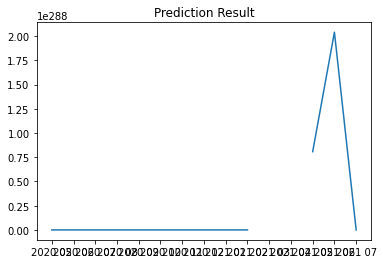

<Figure size 432x288 with 0 Axes>

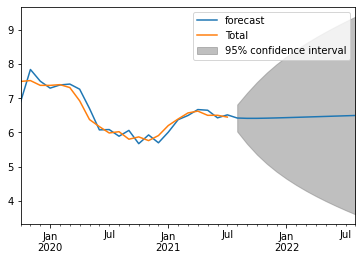

In [ ]:
retaildistribusi_forecast_result = after_arima(total_retaildistribusi_cn, retaildistribusi_arima, 12)

In [ ]:
total_industry = defaultdict(list)

for (indv, variables) in enumerate(features_var):
  eval(f"total_industry['{industry_feature[indv]}'].append(np.array(total_{variables}_new).size)")
  # print(eval(f"np.array({variables}_cd).size"), "\t\t\t", industry_feature[indv])


In [ ]:
np.array(total_alatberatperalatanindustri_new.values().sum())

AttributeError: ignored

In [ ]:
pd.DataFrame(total_industry.items()).sort_values(1)

In [ ]:
pd.DataFrame(total_industry.items()).sort_values(1)

## ARIMA GENDER

In [ ]:
data = pd.DataFrame(real_data)

In [ ]:
data

,industry,title,location,experience,category,salary_currency,salary_min,salary_max,description,requirement,ads_start,ads_end,company,company_industry,company_size,company_nearby_transportation,company_hq,company_web,scraper_uuid,scraper_timestamp,kode,pend_min,gender,company_sizecategory,degree_categories,category_code,location_code,industry_code,adsstart_per_month,adsend_per_month,adslen_total
0,retail distribusi,Supervisor Sales (jakarta Raya),jakarta raya,NaN,Sales & Business Development,NaN,NaN,NaN,NaN,usia maksimal 35 tahun; lulusan minimal d iii ...,43780,43788,Selatan Jaya Prima Perkasa PT,Retail & Wholesale Trading,11 - 50 employees,Stasiun Buaran,"kawasan industri pulogadung blok iii.jj.10, ja...",https://www.sejaya.com,a0d6e078-638e-4409-bc1e-4b63386ae76f,2019-11-18 08:07:52.021000+07:00,MTA2NjE5,D2,2,4.0,3,24.0,260.0,10,3,3,[3]
1,pendidikan pelatihan,Wakil Direktur Medik,tangerang,NaN,Administrative & Customer Relationship,NaN,NaN,NaN,NaN,NaN,43791,43814,Yayasan Abdi Karya,Education & Training,1001 - 5000 employees,NaN,graha yadika jl. raden saleh no. 11 karang te...,http://yadika.or.id/,b32c49a2-afcf-4c74-ad24-d5404fc564b1,2019-11-25 08:19:03.104000+07:00,MTA5OTcz,Tidak Tercantum,2,6.0,7,154.0,66.0,14,3,4,"[3, 4]"
2,it telekomunikasi,Creative Web Designer,bandung,Fresh Graduate akan dipertimbangkan,Design,IDR,2500000.0,3500000.0,design web sites and ensure they are visually ...,NaN,43866,43896,Walden Global Services PT,IT & Telecommunication,201 - 500 employees,Leuwipanjang,jl. soekarno hatta no. 104 babakan ciparay ban...,https://www.wgs.co.id,8b9c622b-a35a-466f-b258-32f3aa85441f,2020-02-10 08:21:05.594000+07:00,MTAzMDky,Tidak Tercantum,2,2.0,7,124.0,203.0,11,6,7,"[6, 7]"
3,makanan minuman,Accounting Staff,sukoharjo,NaN,Accounting & Finance,NaN,NaN,NaN,NaN,"pria/wanita; pendidikan min. s1 akuntansi,; ma...",43740,43759,Ara Savis Sejahtera PT,Food & Beverage,NaN,NaN,"jl. kencur no.24c, grogol, kwarasan - sukoharjo.",http://www.savistea.com/,7f79a714-fdc9-42d9-9dde-aeab1a7101a2,2019-10-07 08:00:50.466000+07:00,MTE5NTA2,S1,2,NaN,6,97.0,2.0,37,2,2,[2]
4,makanan minuman,Tukang Bubut,sidoarjo,NaN,Supply Chain & Logistic,NaN,NaN,NaN,NaN,usia maksimal 35 tahun; pendidikan minimal smk...,43735,43765,Surya Agung Abadi UD,Food & Beverage,51 - 200 employees,NaN,jl. sadang tangkis no.18 kec. taman - kab. sid...,NaN,e734bf75-4587-4d27-a95d-2f7e0e296395,2019-09-30 08:00:54.120000+07:00,MTEyNjk3,SMK,2,7.0,2,28.0,212.0,37,1,2,"[1, 2]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164908,pendidikan pelatihan,Guru Biologi,jabodetabek,NaN,Education & Science,NaN,NaN,NaN,NaN,NaN,44385,44399,Alexandria Islamic School,Education & Training,51 - 200 employees,Stasiun Bekasi/Terminal Bekasi,jl. pengasinan raya no 50 rawa lumbu bekasi ti...,https://alexandriaschool.sch.id,b2530909-6148-4aae-bd8b-ab984f4289a5,2021-07-13 03:13:38,MzEwOTEx,Tidak Tercantum,2,7.0,7,5.0,21.0,14,23,23,[23]
164909,pendidikan pelatihan,Admin Accounting,jabodetabek,NaN,Administrative & Customer Relationship,NaN,NaN,NaN,NaN,NaN,44378,44408,Alexandria Islamic School,Education & Training,51 - 200 employees,Stasiun Bekasi/Terminal Bekasi,jl. pengasinan raya no 50 rawa lumbu bekasi ti...,https://alexandriaschool.sch.id,b2530909-6148-4aae-bd8b-ab984f4289a5,2021-07-13 03:24:28,MzExMTkw,Tidak Tercantum,2,7.0,7,154.0,21.0,14,23,23,[23]
164910,pendidikan pelatihan,Cashier & Waiters,jabodetabek,Fresh Graduate akan dipertimbangkan,General Worker,NaN,NaN,NaN,NaN,NaN,44384,44414,Alexandria Islamic School,Education & Training,51 - 200 employees,Stasiun Bekasi/Terminal Bekasi,jl. pengasinan raya no 50 rawa lumbu bekasi ti...,https://alexandriaschool.sch.id,b2530909-6148-4aae-bd8b-ab984f4289a5,2021-07-13 03:14:57,MzExNDU2,Tidak Tercantum,2,7.0,7,36.0,21.0,14,23,24,"[23, 24]"
164911,pendidikan pelatihan,Koordinator Cleaning Service,jabodetabek,NaN,Tour & Travel,NaN,NaN,NaN,NaN,NaN,44384,44414,Alexandria 

In [ ]:

gender_features = [0, 1, 2]
gender_var = ["female", "male", "fmboth"]


from collections import defaultdict

for (indv, variables) in enumerate(gender_var):
  exec(f'globals()[f"{variables}"] = pd.DataFrame([data.loc[data["gender"] == gender_features[{indv}]]["gender"], data.loc[data["gender"] == gender_features[{indv}]]["adslen_total"]] ).swapaxes("index", "columns")')

In [ ]:
def convert_total(data, data_str):
  exec(f'globals()[f"{data_str}_c"] = defaultdict(list)')
  for ind, contents in enumerate(data["adslen_total"]):
    for content in json.loads(contents):
      for ranges in range(24):
        if ranges == content:
          # totalads_per_month[date_feature[content - 1]].append([ind, date_feature[content - 1]])
          eval(f"{data_str}_c['{date_feature[content - 1]}'].append([date_feature[content - 1]])")
  return eval(f"{data_str}_c")

In [ ]:
#Total without Count
for indv, variables in enumerate(gender_var):
  exec(f"globals()[f'total_{variables}'] = convert_total({variables}, '{variables}')")

In [ ]:
def count_total(data, data_str):
  exec(f'globals()[f"{data_str}_new"] = {data_str}.copy()')
  for datas in data.keys():
    exec(f"{data_str}_new['{datas}'] = (int(np.array({data_str}_new['{datas}']).size))")
  return eval(f"{data_str}_new")

In [ ]:
#Total with Count
for indv, variables in enumerate(gender_var):
  exec(f"globals()[f'total_{variables}_cn'] = count_total(total_{variables}, 'total_{variables}')")
  exec(f"globals()[f'total_{variables}_cn'] = create_dataframe(total_{variables}_cn)")

In [ ]:
total_male_cn = total_male_cn["Total"] + total_fmboth_cn["Total"]
total_male_cn = pd.DataFrame(total_male_cn)
total_female_cn = total_female_cn["Total"] + total_fmboth_cn["Total"]
total_female_cn = pd.DataFrame(total_female_cn)

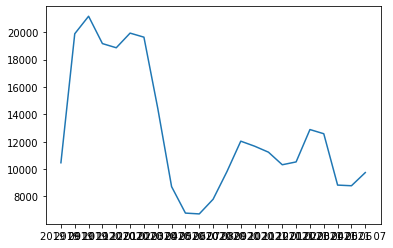

********************************************************************************
********************************************************************************
******************************************************************************** 



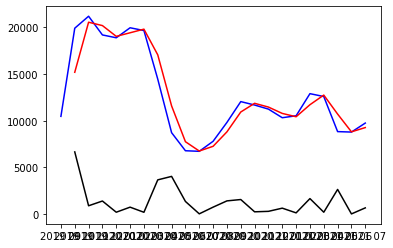

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -2.300763
p-value                         0.171722
#Lags Used                      8.000000
Number of Observations Used    14.000000
Critical Value (1%)            -4.012034
Critical Value (5%)            -3.104184
Critical Value (10%)           -2.690987
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


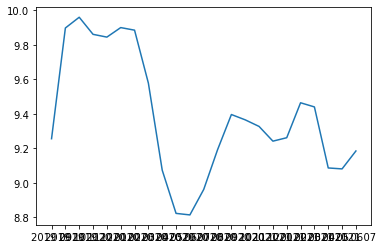

				Moving Everage


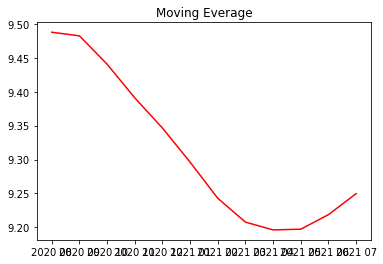

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


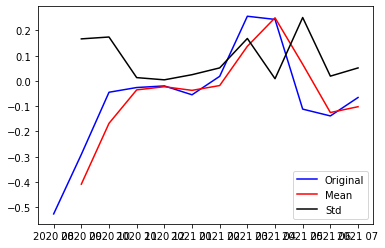

Results of Dicker-Fuller Test:
Test Statistic                -2.398170
p-value                        0.142254
#Lags Used                     4.000000
Number of Observations Used    7.000000
Critical Value (1%)           -4.938690
Critical Value (5%)           -3.477583
Critical Value (10%)          -2.843868
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


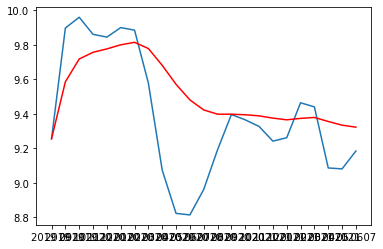

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


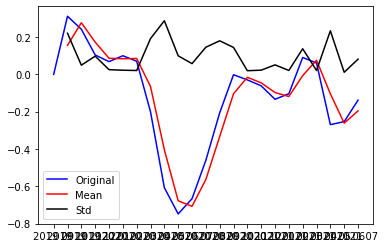

Results of Dicker-Fuller Test:
Test Statistic                 -0.214894
p-value                         0.936723
#Lags Used                      9.000000
Number of Observations Used    13.000000
Critical Value (1%)            -4.068854
Critical Value (5%)            -3.127149
Critical Value (10%)           -2.701730
dtype: float64
				dataset Log Diff Shifting


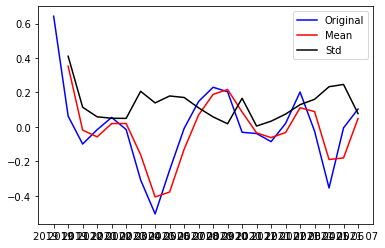

Results of Dicker-Fuller Test:
Test Statistic                 -3.526040
p-value                         0.007343
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


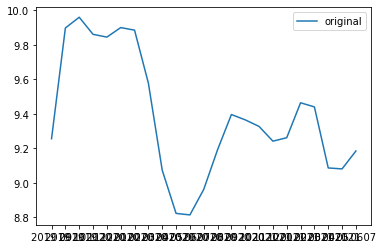

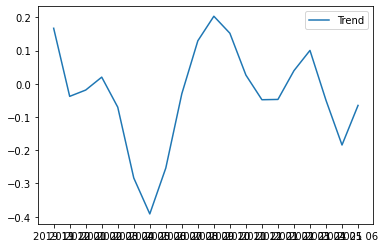

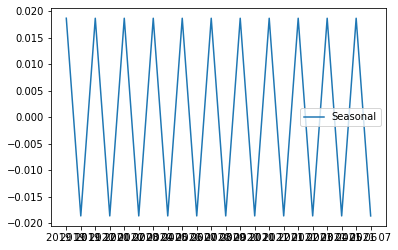

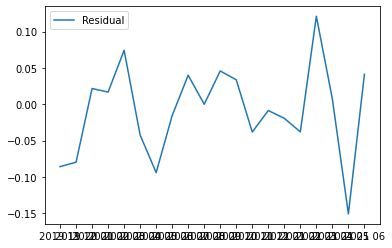

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


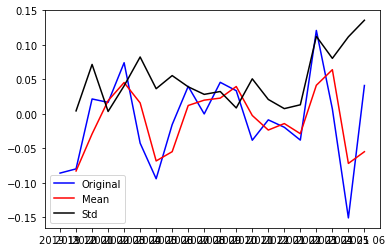

Results of Dicker-Fuller Test:
Test Statistic                 -1.579243
p-value                         0.494012
#Lags Used                      7.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


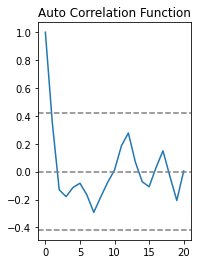

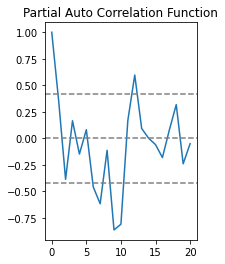

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


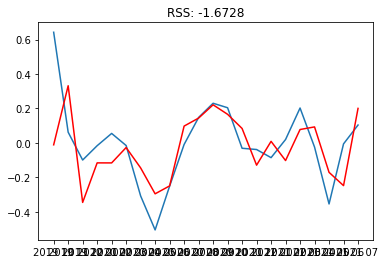

In [ ]:
female_logdiff, female_arima = create_arima(total_female_cn)

In [ ]:
def after_arima(data, a_result, step:int):

  print("\t\tpredictions_diff")
  predictions_diff = pd.Series(a_result.fittedvalues, copy=True)
  print(predictions_diff, "\n\n")


  print("\t\tpredictions_diff_cumsum")
  predictions_diff_cumsum = predictions_diff.cumsum()
  print(predictions_diff_cumsum, "\n\n")


  print("\t\tpredictions_log")
  predictions_log = pd.Series(data["Total"], index=data.index)
  predictions_log = predictions_log.add(predictions_diff_cumsum, fill_value=0)
  print(predictions_log, "\n\n")


  print("\t\tpredictions_arima")
  predictions_arima = np.exp(predictions_log)
  print(predictions_arima, "\n\n")

  plt.figure("predictions ARIMA Log")
  plt.plot(predictions_arima)
  plt.title("Prediction Result")
  plt.show()

  plt.figure("Plot predictions ARIMA")
  a_result.plot_predict(1, len(data) + step)
  plt.show()
  forecast_result = a_result.forecast(steps=step)

  return forecast_result

		predictions_diff
Date
2019 10   -0.010927
2019 11    0.331766
2019 12   -0.345016
2020 01   -0.115682
2020 02   -0.115847
2020 03   -0.026638
2020 04   -0.144790
2020 05   -0.295105
2020 06   -0.249165
2020 07    0.097746
2020 08    0.144191
2020 09    0.221207
2020 10    0.166050
2020 11    0.083904
2020 12   -0.128860
2021 01    0.009243
2021 02   -0.102178
2021 03    0.077943
2021 04    0.092929
2021 05   -0.170553
2021 06   -0.247594
2021 07    0.200393
dtype: float64 


		predictions_diff_cumsum
Date
2019 10   -0.010927
2019 11    0.320839
2019 12   -0.024178
2020 01   -0.139859
2020 02   -0.255706
2020 03   -0.282344
2020 04   -0.427134
2020 05   -0.722239
2020 06   -0.971405
2020 07   -0.873659
2020 08   -0.729467
2020 09   -0.508260
2020 10   -0.342210
2020 11   -0.258306
2020 12   -0.387166
2021 01   -0.377923
2021 02   -0.480102
2021 03   -0.402158
2021 04   -0.309229
2021 05   -0.479782
2021 06   -0.727376
2021 07   -0.526983
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


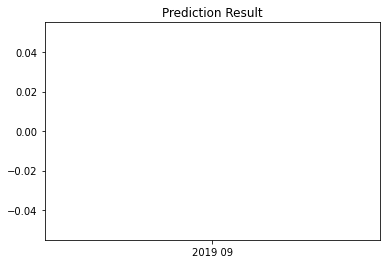

<Figure size 432x288 with 0 Axes>

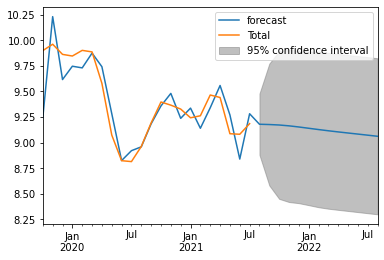

In [ ]:
f_result = after_arima(total_female_cn, female_arima, 12)

In [ ]:
#Total with Count
for indv, variables in enumerate(gender_var):
  exec(f"globals()[f'total_{variables}_cn'] = count_total(total_{variables}, 'total_{variables}')")
  exec(f"globals()[f'total_{variables}_cn'] = create_dataframe(total_{variables}_cn)")

female

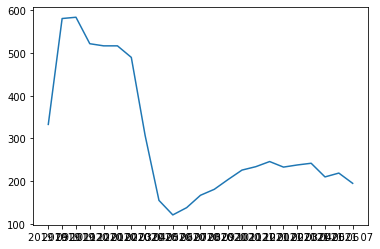

********************************************************************************
********************************************************************************
******************************************************************************** 



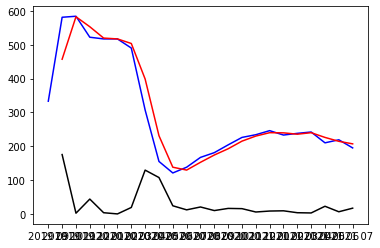

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -5.142939
p-value                         0.000011
#Lags Used                      5.000000
Number of Observations Used    17.000000
Critical Value (1%)            -3.889266
Critical Value (5%)            -3.054358
Critical Value (10%)           -2.666984
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


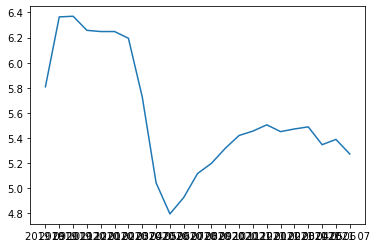

				Moving Everage


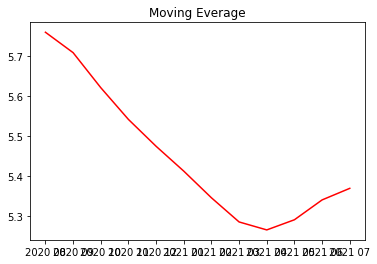

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


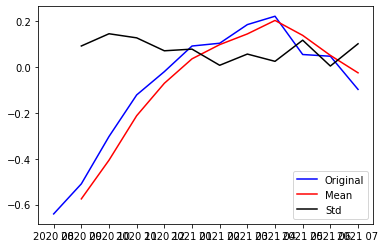

Results of Dicker-Fuller Test:
Test Statistic                -0.538047
p-value                        0.884376
#Lags Used                     3.000000
Number of Observations Used    8.000000
Critical Value (1%)           -4.665186
Critical Value (5%)           -3.367187
Critical Value (10%)          -2.802961
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


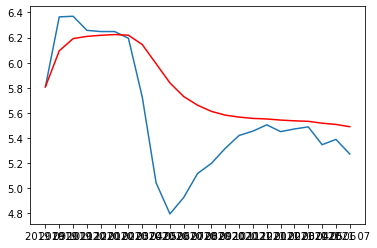

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


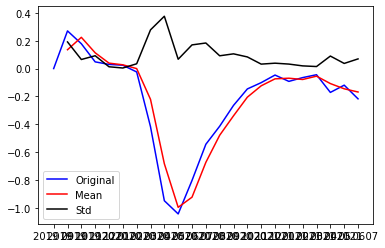

Results of Dicker-Fuller Test:
Test Statistic                 -1.814745
p-value                         0.373166
#Lags Used                      7.000000
Number of Observations Used    15.000000
Critical Value (1%)            -3.964443
Critical Value (5%)            -3.084908
Critical Value (10%)           -2.681814
dtype: float64
				dataset Log Diff Shifting


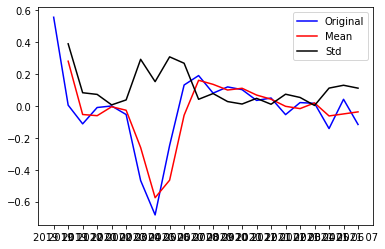

Results of Dicker-Fuller Test:
Test Statistic                 -1.964442
p-value                         0.302378
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


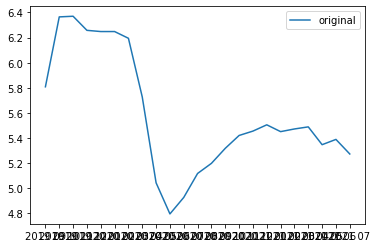

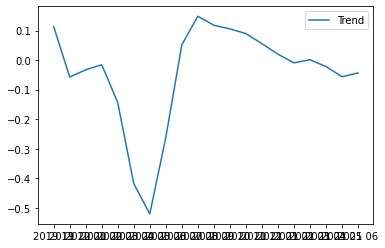

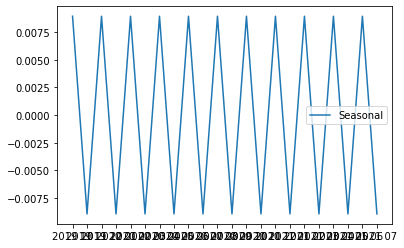

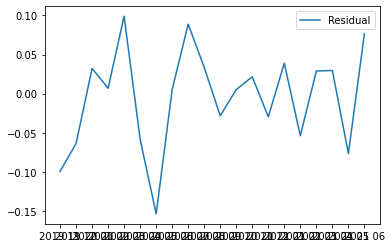

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


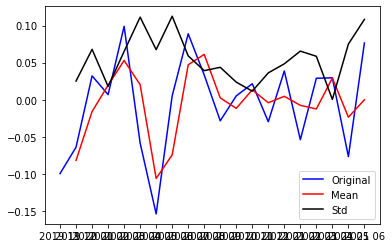

Results of Dicker-Fuller Test:
Test Statistic                 -0.905595
p-value                         0.786124
#Lags Used                      8.000000
Number of Observations Used    11.000000
Critical Value (1%)            -4.223238
Critical Value (5%)            -3.189369
Critical Value (10%)           -2.729839
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


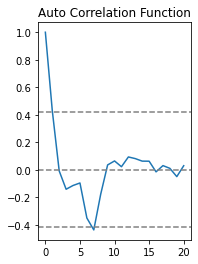

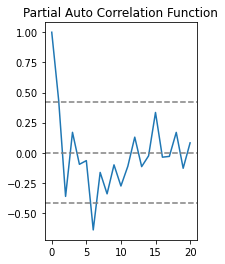

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


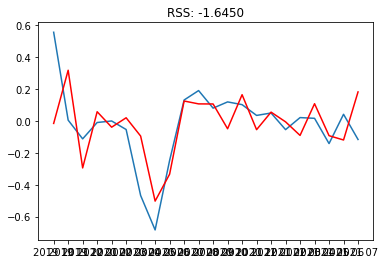

In [ ]:
female_logdiff, female_arima = create_arima(total_female_cn, 2,1,1)

		predictions_diff
Date
2019 10   -0.015369
2019 11    0.318211
2019 12   -0.294563
2020 01    0.058081
2020 02   -0.039034
2020 03    0.020051
2020 04   -0.094668
2020 05   -0.502669
2020 06   -0.333742
2020 07    0.125254
2020 08    0.107143
2020 09    0.106613
2020 10   -0.048841
2020 11    0.164811
2020 12   -0.054574
2021 01    0.055469
2021 02   -0.005436
2021 03   -0.090590
2021 04    0.108284
2021 05   -0.092307
2021 06   -0.119287
2021 07    0.182246
dtype: float64 


		predictions_diff_cumsum
Date
2019 10   -0.015369
2019 11    0.302842
2019 12    0.008279
2020 01    0.066359
2020 02    0.027326
2020 03    0.047377
2020 04   -0.047292
2020 05   -0.549961
2020 06   -0.883703
2020 07   -0.758449
2020 08   -0.651306
2020 09   -0.544693
2020 10   -0.593534
2020 11   -0.428723
2020 12   -0.483297
2021 01   -0.427828
2021 02   -0.433264
2021 03   -0.523854
2021 04   -0.415570
2021 05   -0.507877
2021 06   -0.627164
2021 07   -0.444918
dtype: float64 


		predictions_log
Date
2019 0

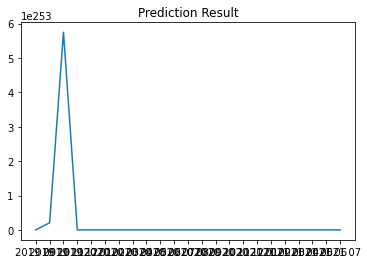

<Figure size 432x288 with 0 Axes>

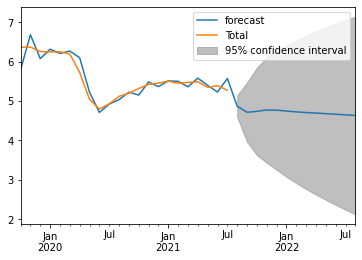

In [ ]:
female_forecast_result = after_arima(total_female_cn, female_arima, 12)

male

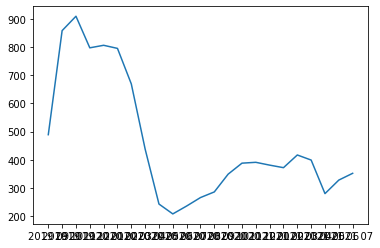

********************************************************************************
********************************************************************************
******************************************************************************** 



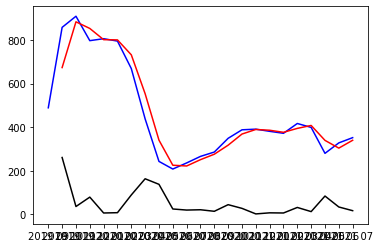

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -4.368682
p-value                         0.000337
#Lags Used                      5.000000
Number of Observations Used    17.000000
Critical Value (1%)            -3.889266
Critical Value (5%)            -3.054358
Critical Value (10%)           -2.666984
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


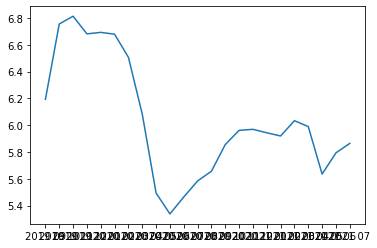

				Moving Everage


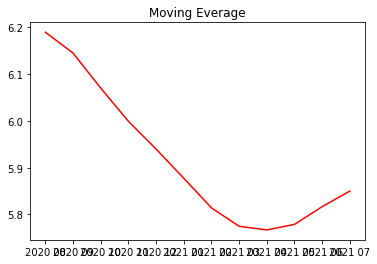

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


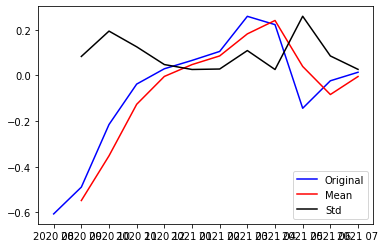

Results of Dicker-Fuller Test:
Test Statistic                 -2.531662
p-value                         0.107959
#Lags Used                      0.000000
Number of Observations Used    11.000000
Critical Value (1%)            -4.223238
Critical Value (5%)            -3.189369
Critical Value (10%)           -2.729839
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


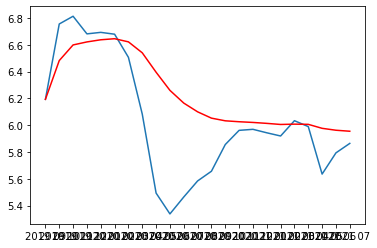

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


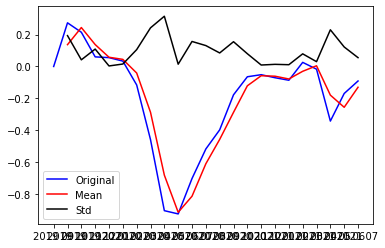

Results of Dicker-Fuller Test:
Test Statistic                 -1.397965
p-value                         0.583251
#Lags Used                      0.000000
Number of Observations Used    22.000000
Critical Value (1%)            -3.769733
Critical Value (5%)            -3.005426
Critical Value (10%)           -2.642501
dtype: float64
				dataset Log Diff Shifting


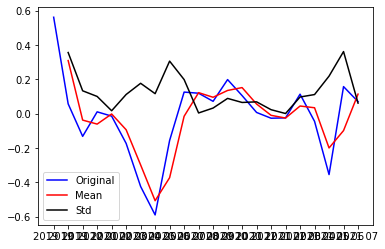

Results of Dicker-Fuller Test:
Test Statistic                 -3.455982
p-value                         0.009192
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


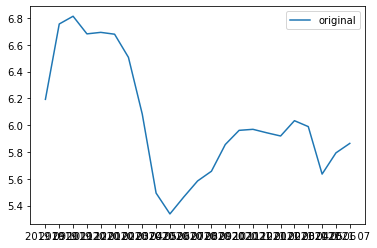

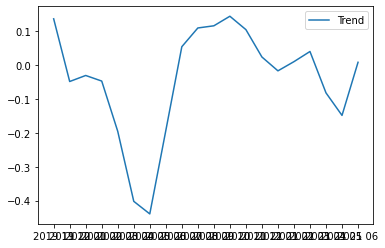

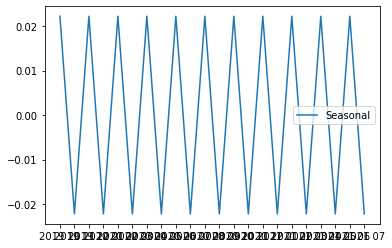

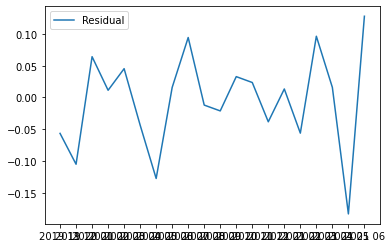

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


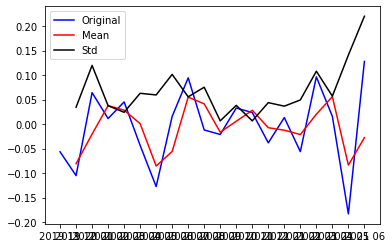

Results of Dicker-Fuller Test:
Test Statistic                 -5.040230
p-value                         0.000018
#Lags Used                      8.000000
Number of Observations Used    11.000000
Critical Value (1%)            -4.223238
Critical Value (5%)            -3.189369
Critical Value (10%)           -2.729839
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


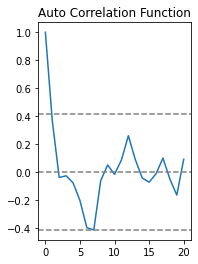

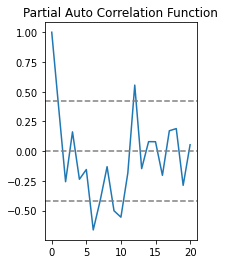

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


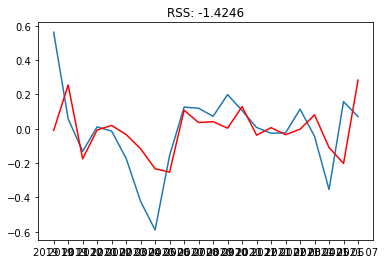

In [ ]:
male_logdiff, male_arima = create_arima(total_male_cn, 2,1,1)

		predictions_diff
Date
2019 10   -0.009661
2019 11    0.254762
2019 12   -0.174923
2020 01   -0.006834
2020 02    0.019352
2020 03   -0.033637
2020 04   -0.116481
2020 05   -0.233249
2020 06   -0.252384
2020 07    0.108072
2020 08    0.036348
2020 09    0.041524
2020 10    0.003432
2020 11    0.129297
2020 12   -0.037312
2021 01    0.006504
2021 02   -0.034435
2021 03   -0.002570
2021 04    0.081168
2021 05   -0.109254
2021 06   -0.202024
2021 07    0.283316
dtype: float64 


		predictions_diff_cumsum
Date
2019 10   -0.009661
2019 11    0.245101
2019 12    0.070177
2020 01    0.063343
2020 02    0.082695
2020 03    0.049059
2020 04   -0.067422
2020 05   -0.300671
2020 06   -0.553054
2020 07   -0.444983
2020 08   -0.408634
2020 09   -0.367110
2020 10   -0.363678
2020 11   -0.234382
2020 12   -0.271694
2021 01   -0.265190
2021 02   -0.299625
2021 03   -0.302195
2021 04   -0.221026
2021 05   -0.330280
2021 06   -0.532304
2021 07   -0.248989
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


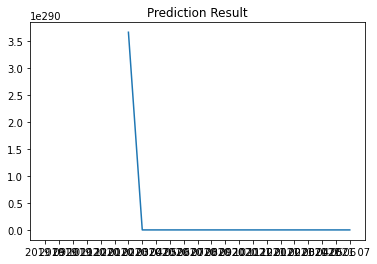

<Figure size 432x288 with 0 Axes>

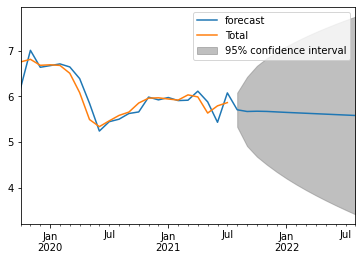

In [ ]:
male_forecast_result = after_arima(total_male_cn, male_arima, 12)

both

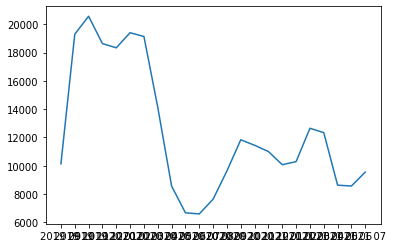

********************************************************************************
********************************************************************************
******************************************************************************** 



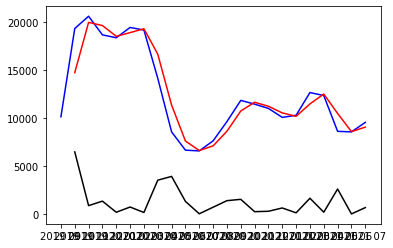

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -2.331215
p-value                         0.162098
#Lags Used                      8.000000
Number of Observations Used    14.000000
Critical Value (1%)            -4.012034
Critical Value (5%)            -3.104184
Critical Value (10%)           -2.690987
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


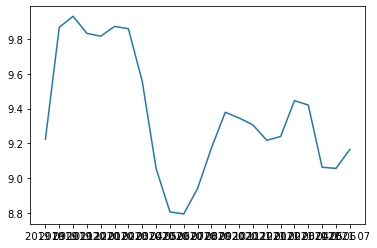

				Moving Everage


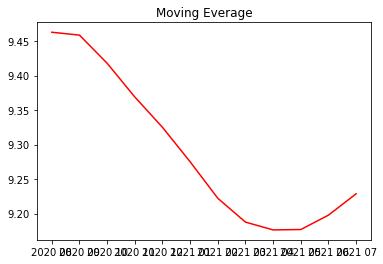

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


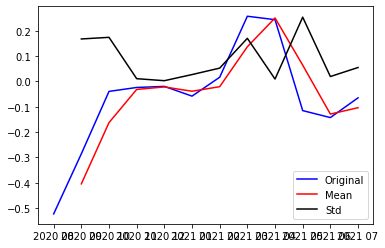

Results of Dicker-Fuller Test:
Test Statistic                -2.393312
p-value                        0.143633
#Lags Used                     4.000000
Number of Observations Used    7.000000
Critical Value (1%)           -4.938690
Critical Value (5%)           -3.477583
Critical Value (10%)          -2.843868
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


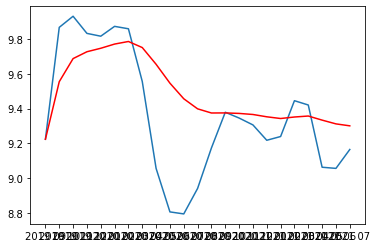

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


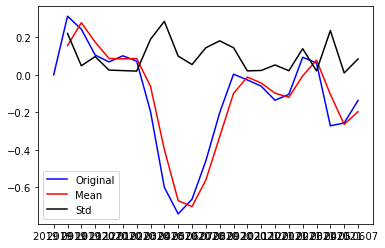

Results of Dicker-Fuller Test:
Test Statistic                 -0.166399
p-value                         0.942410
#Lags Used                      9.000000
Number of Observations Used    13.000000
Critical Value (1%)            -4.068854
Critical Value (5%)            -3.127149
Critical Value (10%)           -2.701730
dtype: float64
				dataset Log Diff Shifting


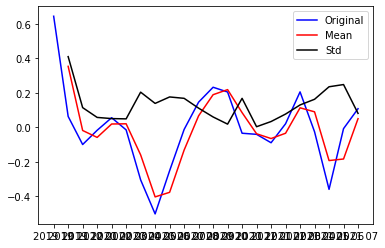

Results of Dicker-Fuller Test:
Test Statistic                 -3.617184
p-value                         0.005441
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


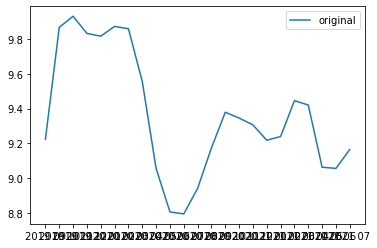

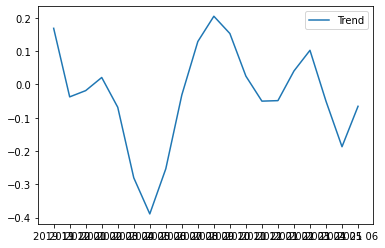

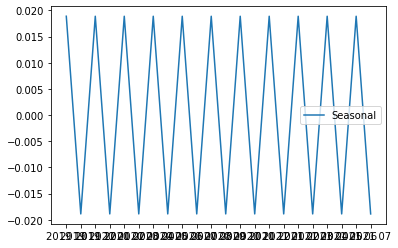

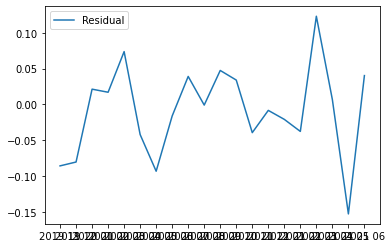

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


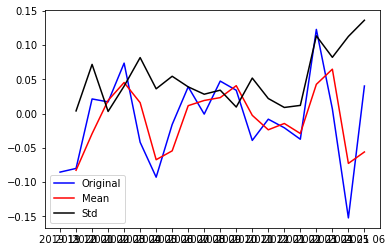

Results of Dicker-Fuller Test:
Test Statistic                 -1.558763
p-value                         0.504268
#Lags Used                      7.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


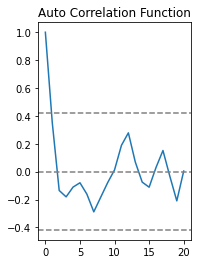

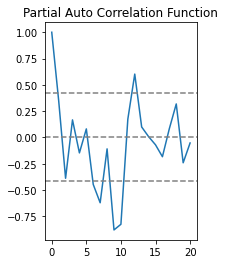

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


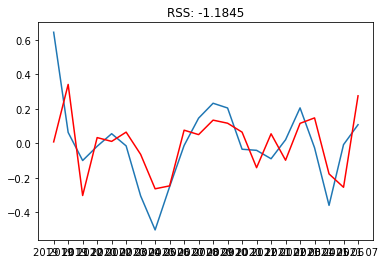

In [ ]:
fmboth_logdiff, fmboth_arima = create_arima(total_fmboth_cn, 2,1,1)

		predictions_diff
Date
2019 10    0.009276
2019 11    0.342367
2019 12   -0.301503
2020 01    0.034155
2020 02    0.012149
2020 03    0.065845
2020 04   -0.063080
2020 05   -0.262667
2020 06   -0.245663
2020 07    0.077125
2020 08    0.051411
2020 09    0.135325
2020 10    0.117491
2020 11    0.065684
2020 12   -0.140259
2021 01    0.056129
2021 02   -0.097023
2021 03    0.116714
2021 04    0.148292
2021 05   -0.176287
2021 06   -0.253895
2021 07    0.276245
dtype: float64 


		predictions_diff_cumsum
Date
2019 10    0.009276
2019 11    0.351643
2019 12    0.050140
2020 01    0.084295
2020 02    0.096445
2020 03    0.162290
2020 04    0.099210
2020 05   -0.163457
2020 06   -0.409120
2020 07   -0.331995
2020 08   -0.280584
2020 09   -0.145259
2020 10   -0.027768
2020 11    0.037916
2020 12   -0.102343
2021 01   -0.046215
2021 02   -0.143238
2021 03   -0.026524
2021 04    0.121769
2021 05   -0.054519
2021 06   -0.308413
2021 07   -0.032168
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


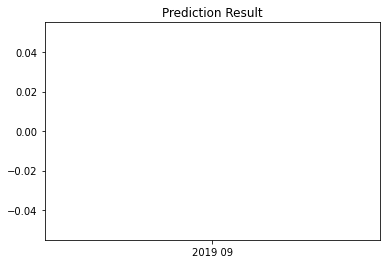

<Figure size 432x288 with 0 Axes>

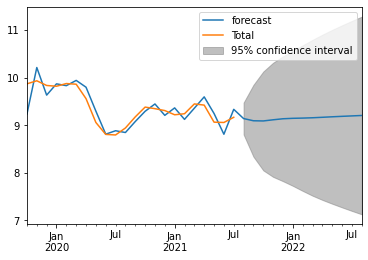

In [ ]:
fmboth_forecast_result = after_arima(total_fmboth_cn, fmboth_arima, 12)

## ARIMA COMPANY SIZE

In [ ]:
data = pd.DataFrame(real_data)

In [ ]:
set(data["company_size"].dropna())

{'1 - 10 employees',
 '10,001+ employees',
 '1001 - 5000 employees',
 '11 - 50 employees',
 '201 - 500 employees',
 '5001 - 10,000 employees',
 '501 - 1000 employees',
 '51 - 200 employees'}

In [ ]:
size_features = ['1 - 10 employees',
 '10,001+ employees',
 '1001 - 5000 employees',
 '11 - 50 employees',
 '201 - 500 employees',
 '5001 - 10,000 employees',
 '501 - 1000 employees',
 '51 - 200 employees']

sizecompany_var = ["e1", "e10001", "e1001", "e11", "e201", "e5001", "e501", "e51"]


from collections import defaultdict

for (indv, variables) in enumerate(sizecompany_var):
  exec(f'globals()[f"{variables}"] = pd.DataFrame([data.loc[data["company_size"] == size_features[{indv}]]["company_size"], data.loc[data["company_size"] == size_features[{indv}]]["adslen_total"]] ).swapaxes("index", "columns")')

In [ ]:
e51

,company_size,adslen_total
4,51 - 200 employees,"[1, 2]"
5,51 - 200 employees,[5]
9,51 - 200 employees,[1]
10,51 - 200 employees,"[16, 17]"
13,51 - 200 employees,[7]
...,...,...
164907,51 - 200 employees,[23]
164908,51 - 200 employees,[23]
164909,51 - 200 employees,[23]
164910,51 - 200 employees,"[23, 24]"


In [ ]:
def convert_total(data, data_str):
  exec(f'globals()[f"{data_str}_c"] = defaultdict(list)')
  for ind, contents in enumerate(data["adslen_total"]):
    for content in json.loads(contents):
      for ranges in range(24):
        if ranges == content:
          # totalads_per_month[date_feature[content - 1]].append([ind, date_feature[content - 1]])
          eval(f"{data_str}_c['{date_feature[content - 1]}'].append([date_feature[content - 1]])")
  return eval(f"{data_str}_c")

In [ ]:
#Total without Count
for indv, variables in enumerate(sizecompany_var):
  exec(f"globals()[f'total_{variables}'] = convert_total({variables}, '{variables}')")

In [ ]:
def count_total(data, data_str):
  exec(f'globals()[f"{data_str}_new"] = {data_str}.copy()')
  for datas in data.keys():
    exec(f"{data_str}_new['{datas}'] = (int(np.array({data_str}_new['{datas}']).size))")
  return eval(f"{data_str}_new")

In [ ]:
#Total with Count
for indv, variables in enumerate(sizecompany_var):
  exec(f"globals()[f'total_{variables}_cn'] = count_total(total_{variables}, 'total_{variables}')")
  exec(f"globals()[f'total_{variables}_cn'] = create_dataframe(total_{variables}_cn)")

e1

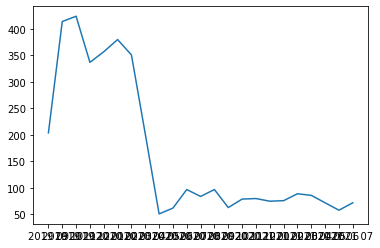

********************************************************************************
********************************************************************************
******************************************************************************** 



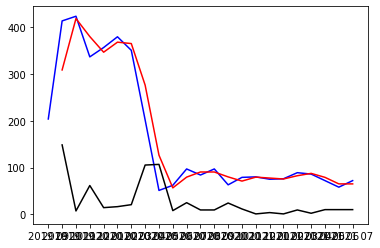

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -1.084617
p-value                         0.721167
#Lags Used                      0.000000
Number of Observations Used    22.000000
Critical Value (1%)            -3.769733
Critical Value (5%)            -3.005426
Critical Value (10%)           -2.642501
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


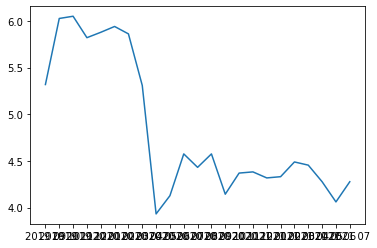

				Moving Everage


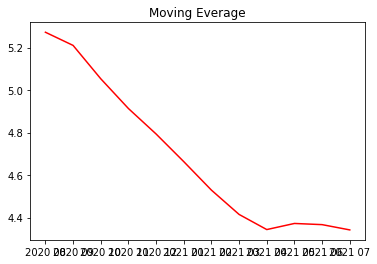

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


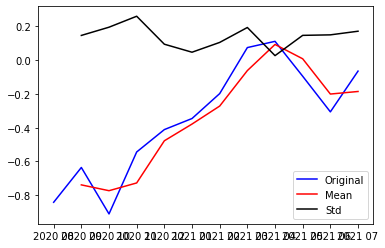

Results of Dicker-Fuller Test:
Test Statistic                -2.296330
p-value                        0.173154
#Lags Used                     2.000000
Number of Observations Used    9.000000
Critical Value (1%)           -4.473135
Critical Value (5%)           -3.289881
Critical Value (10%)          -2.772382
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


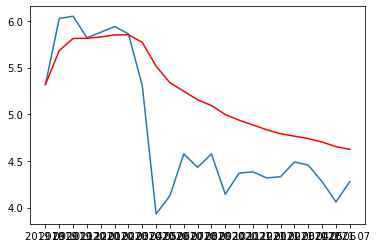

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


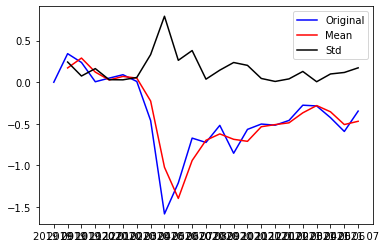

Results of Dicker-Fuller Test:
Test Statistic                 -2.313613
p-value                         0.167615
#Lags Used                      9.000000
Number of Observations Used    13.000000
Critical Value (1%)            -4.068854
Critical Value (5%)            -3.127149
Critical Value (10%)           -2.701730
dtype: float64
				dataset Log Diff Shifting


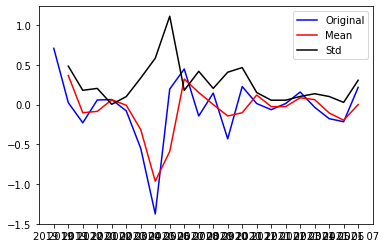

Results of Dicker-Fuller Test:
Test Statistic                 -4.386792
p-value                         0.000313
#Lags Used                      0.000000
Number of Observations Used    21.000000
Critical Value (1%)            -3.788386
Critical Value (5%)            -3.013098
Critical Value (10%)           -2.646397
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


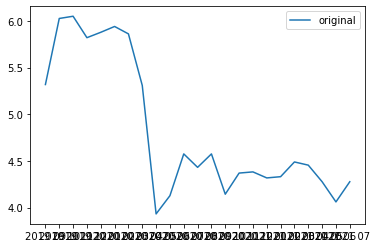

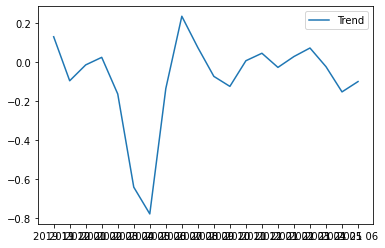

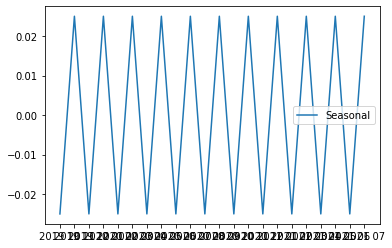

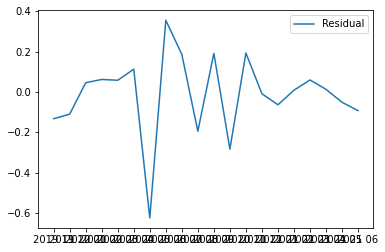

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


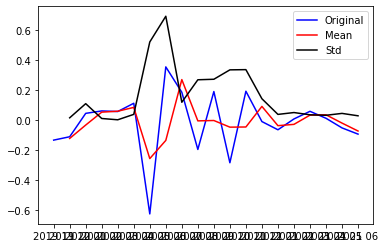

Results of Dicker-Fuller Test:
Test Statistic                 -3.934567
p-value                         0.001795
#Lags Used                      7.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


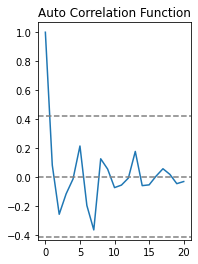

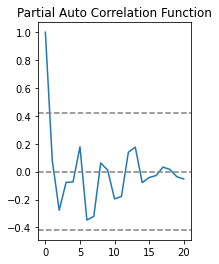

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


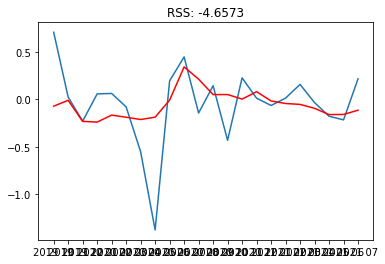

In [ ]:
e1_logdiff, e1_arima = create_arima(total_e1_cn, 2,1,1)

		predictions_diff
Date
2019 10   -0.071898
2019 11   -0.009868
2019 12   -0.232242
2020 01   -0.239536
2020 02   -0.165977
2020 03   -0.188372
2020 04   -0.212378
2020 05   -0.187722
2020 06   -0.007974
2020 07    0.342335
2020 08    0.213227
2020 09    0.050294
2020 10    0.050808
2020 11    0.002907
2020 12    0.081019
2021 01   -0.016509
2021 02   -0.043618
2021 03   -0.053052
2021 04   -0.094368
2021 05   -0.160427
2021 06   -0.158947
2021 07   -0.114357
dtype: float64 


		predictions_diff_cumsum
Date
2019 10   -0.071898
2019 11   -0.081767
2019 12   -0.314009
2020 01   -0.553545
2020 02   -0.719522
2020 03   -0.907894
2020 04   -1.120272
2020 05   -1.307994
2020 06   -1.315968
2020 07   -0.973633
2020 08   -0.760406
2020 09   -0.710112
2020 10   -0.659304
2020 11   -0.656398
2020 12   -0.575378
2021 01   -0.591888
2021 02   -0.635506
2021 03   -0.688557
2021 04   -0.782926
2021 05   -0.943353
2021 06   -1.102300
2021 07   -1.216656
dtype: float64 


		predictions_log
Date
2019 0

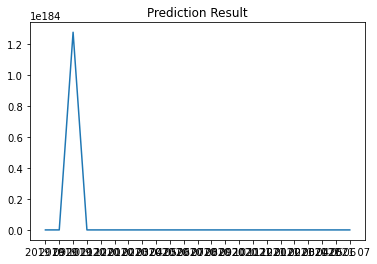

<Figure size 432x288 with 0 Axes>

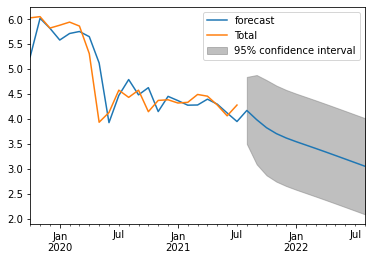

In [ ]:
e1_forecast_result = after_arima(total_e1_cn, e1_arima, 12)

e10001

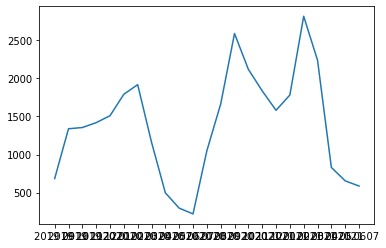

********************************************************************************
********************************************************************************
******************************************************************************** 



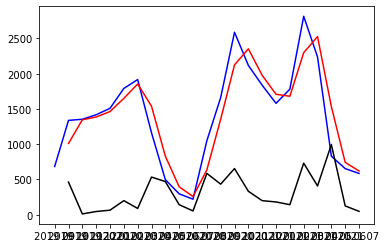

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -2.992992
p-value                         0.035554
#Lags Used                      1.000000
Number of Observations Used    21.000000
Critical Value (1%)            -3.788386
Critical Value (5%)            -3.013098
Critical Value (10%)           -2.646397
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


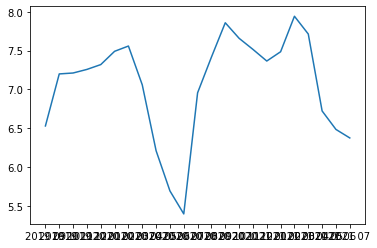

				Moving Everage


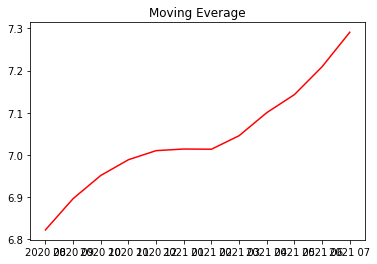

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


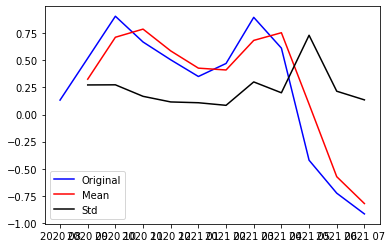

Results of Dicker-Fuller Test:
Test Statistic                 6.221490
p-value                        1.000000
#Lags Used                     4.000000
Number of Observations Used    7.000000
Critical Value (1%)           -4.938690
Critical Value (5%)           -3.477583
Critical Value (10%)          -2.843868
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


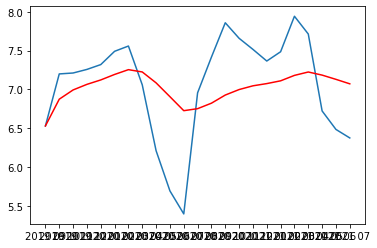

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


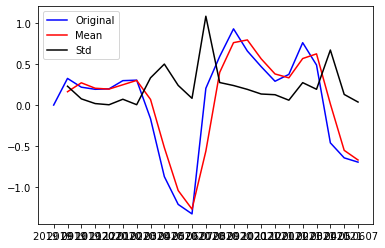

Results of Dicker-Fuller Test:
Test Statistic                 -0.512376
p-value                         0.889579
#Lags Used                      9.000000
Number of Observations Used    13.000000
Critical Value (1%)            -4.068854
Critical Value (5%)            -3.127149
Critical Value (10%)           -2.701730
dtype: float64
				dataset Log Diff Shifting


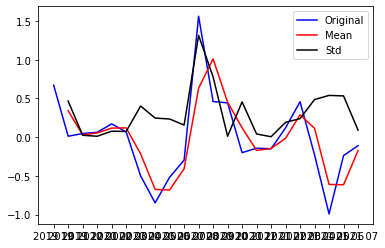

Results of Dicker-Fuller Test:
Test Statistic                 -1.772583
p-value                         0.394156
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


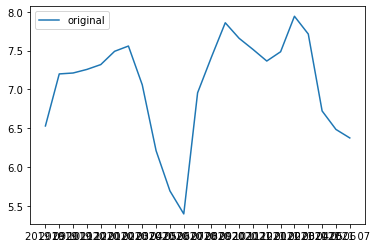

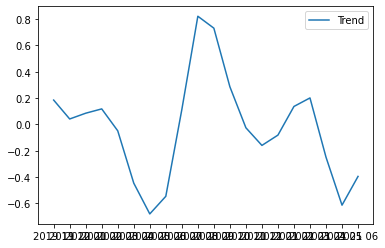

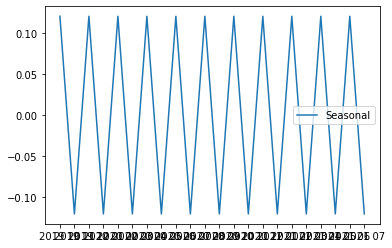

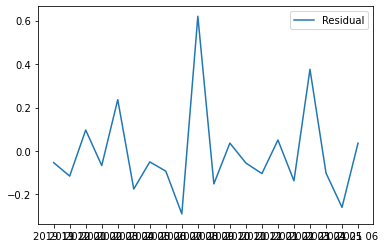

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


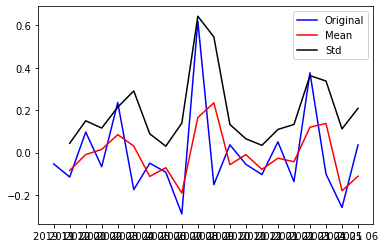

Results of Dicker-Fuller Test:
Test Statistic                 -3.605174
p-value                         0.005663
#Lags Used                      5.000000
Number of Observations Used    14.000000
Critical Value (1%)            -4.012034
Critical Value (5%)            -3.104184
Critical Value (10%)           -2.690987
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


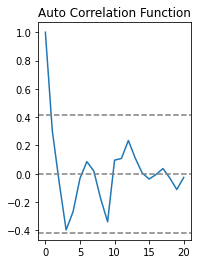

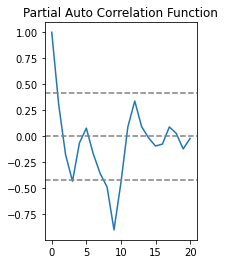

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


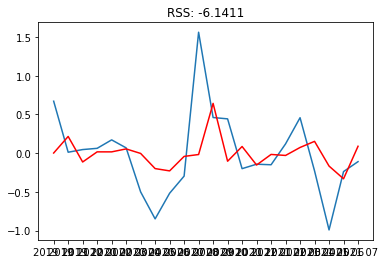

In [ ]:
e10001_logdiff, e10001_arima = create_arima(total_e10001_cn, 2,1,0)

		predictions_diff
Date
2019 10    0.001559
2019 11    0.215529
2019 12   -0.114242
2020 01    0.016527
2020 02    0.016429
2020 03    0.054683
2020 04   -0.003766
2020 05   -0.199534
2020 06   -0.229248
2020 07   -0.042155
2020 08   -0.017894
2020 09    0.642839
2020 10   -0.104640
2020 11    0.085835
2020 12   -0.153448
2021 01   -0.016752
2021 02   -0.029782
2021 03    0.073221
2021 04    0.152328
2021 05   -0.167031
2021 06   -0.331478
2021 07    0.088811
dtype: float64 


		predictions_diff_cumsum
Date
2019 10    0.001559
2019 11    0.217088
2019 12    0.102846
2020 01    0.119373
2020 02    0.135802
2020 03    0.190485
2020 04    0.186719
2020 05   -0.012815
2020 06   -0.242063
2020 07   -0.284217
2020 08   -0.302111
2020 09    0.340728
2020 10    0.236087
2020 11    0.321922
2020 12    0.168474
2021 01    0.151722
2021 02    0.121940
2021 03    0.195161
2021 04    0.347489
2021 05    0.180459
2021 06   -0.151019
2021 07   -0.062208
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


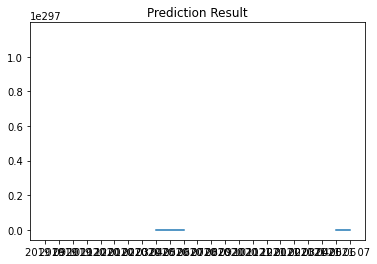

<Figure size 432x288 with 0 Axes>

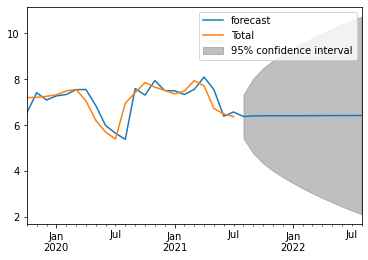

In [ ]:
e10001_forecast_result = after_arima(total_e10001_cn, e10001_arima, 12)

e1001

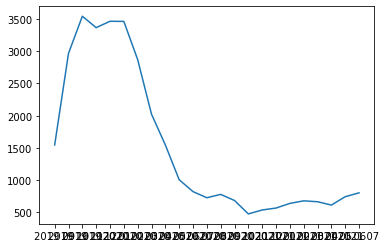

********************************************************************************
********************************************************************************
******************************************************************************** 



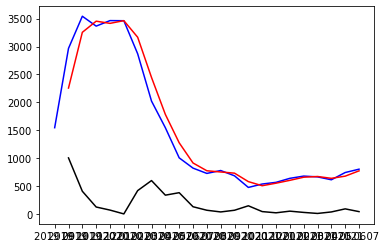

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -0.752674
p-value                         0.832630
#Lags Used                      0.000000
Number of Observations Used    22.000000
Critical Value (1%)            -3.769733
Critical Value (5%)            -3.005426
Critical Value (10%)           -2.642501
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


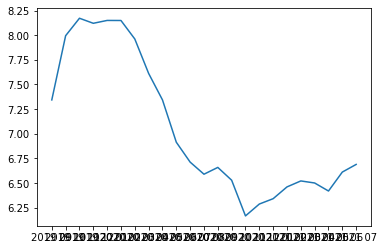

				Moving Everage


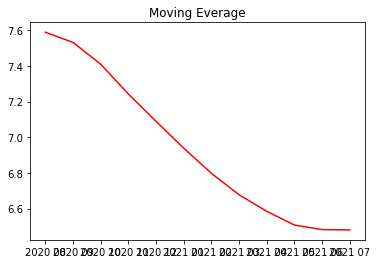

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


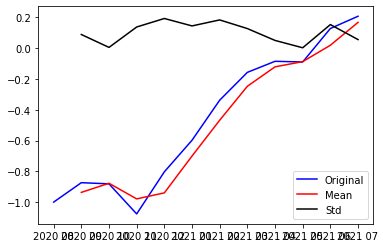

Results of Dicker-Fuller Test:
Test Statistic                 -0.047502
p-value                         0.954423
#Lags Used                      0.000000
Number of Observations Used    11.000000
Critical Value (1%)            -4.223238
Critical Value (5%)            -3.189369
Critical Value (10%)           -2.729839
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


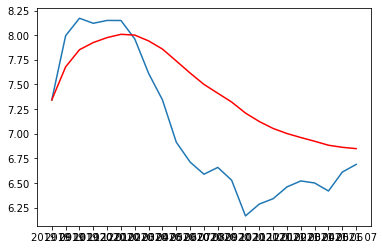

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


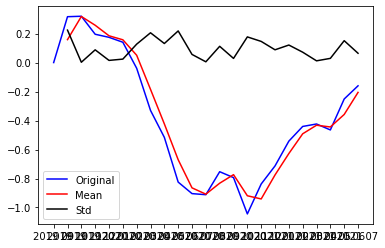

Results of Dicker-Fuller Test:
Test Statistic                 -1.041344
p-value                         0.737888
#Lags Used                      0.000000
Number of Observations Used    22.000000
Critical Value (1%)            -3.769733
Critical Value (5%)            -3.005426
Critical Value (10%)           -2.642501
dtype: float64
				dataset Log Diff Shifting


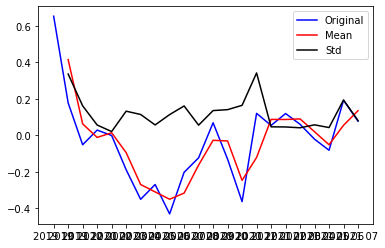

Results of Dicker-Fuller Test:
Test Statistic                 -1.839226
p-value                         0.361168
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


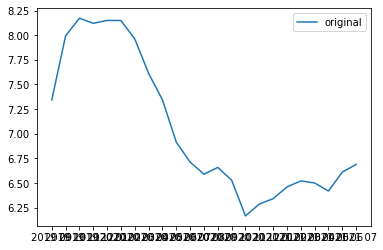

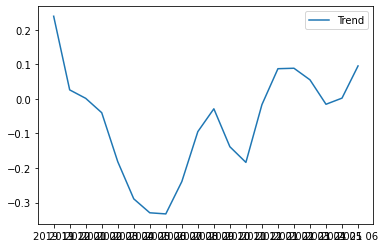

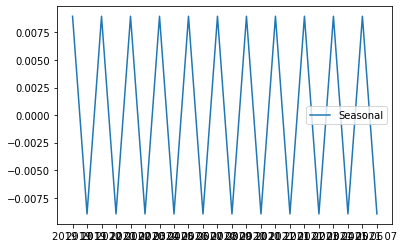

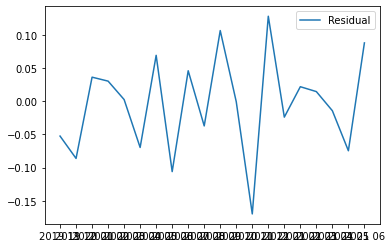

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


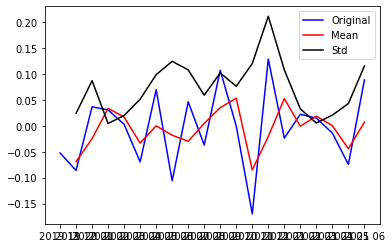

Results of Dicker-Fuller Test:
Test Statistic                 -0.517770
p-value                         0.888502
#Lags Used                      8.000000
Number of Observations Used    11.000000
Critical Value (1%)            -4.223238
Critical Value (5%)            -3.189369
Critical Value (10%)           -2.729839
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


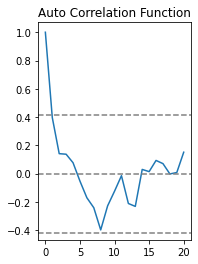

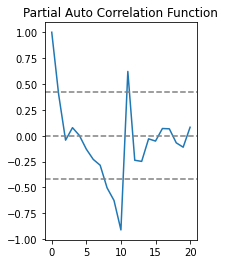

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


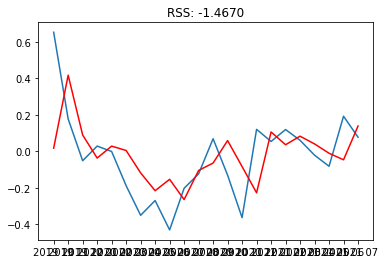

In [ ]:
e1001_logdiff, e1001_arima = create_arima(total_e1001_cn, 2,1,0)

		predictions_diff
Date
2019 10    0.017491
2019 11    0.416883
2019 12    0.089744
2020 01   -0.036612
2020 02    0.028777
2020 03    0.004897
2020 04   -0.117692
2020 05   -0.215079
2020 06   -0.152860
2020 07   -0.263780
2020 08   -0.104229
2020 09   -0.063853
2020 10    0.059179
2020 11   -0.083096
2020 12   -0.226651
2021 01    0.106098
2021 02    0.036448
2021 03    0.083200
2021 04    0.040717
2021 05   -0.010226
2021 06   -0.046057
2021 07    0.138699
dtype: float64 


		predictions_diff_cumsum
Date
2019 10    0.017491
2019 11    0.434374
2019 12    0.524118
2020 01    0.487506
2020 02    0.516283
2020 03    0.521181
2020 04    0.403488
2020 05    0.188410
2020 06    0.035550
2020 07   -0.228230
2020 08   -0.332459
2020 09   -0.396311
2020 10   -0.337133
2020 11   -0.420229
2020 12   -0.646879
2021 01   -0.540781
2021 02   -0.504334
2021 03   -0.421134
2021 04   -0.380416
2021 05   -0.390642
2021 06   -0.436699
2021 07   -0.298000
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


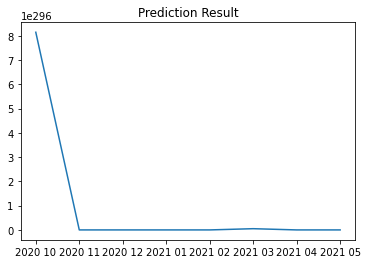

<Figure size 432x288 with 0 Axes>

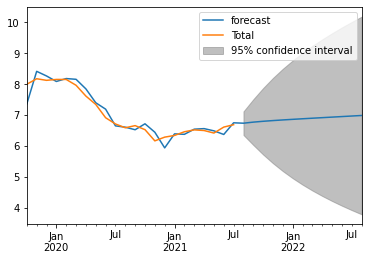

In [ ]:
e1001_forecast_result = after_arima(total_e1001_cn, e1001_arima, 12)

e11

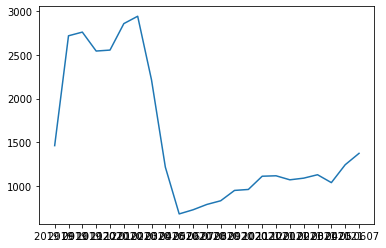

********************************************************************************
********************************************************************************
******************************************************************************** 



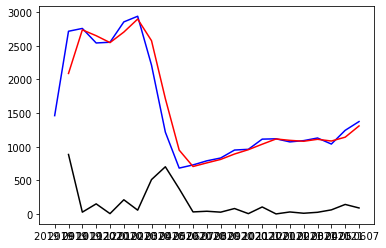

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -1.191081
p-value                         0.677420
#Lags Used                      0.000000
Number of Observations Used    22.000000
Critical Value (1%)            -3.769733
Critical Value (5%)            -3.005426
Critical Value (10%)           -2.642501
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


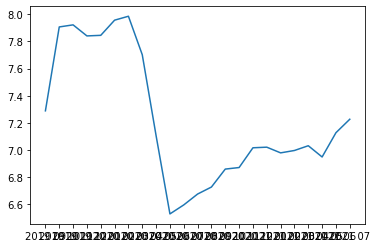

				Moving Everage


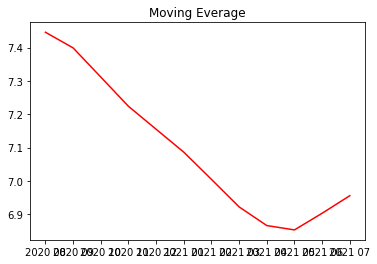

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


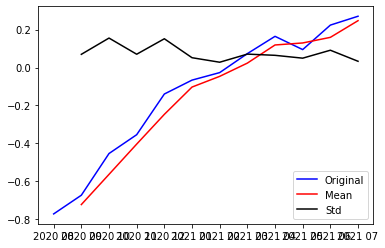

Results of Dicker-Fuller Test:
Test Statistic                -6.626400e+00
p-value                        5.861473e-09
#Lags Used                     3.000000e+00
Number of Observations Used    8.000000e+00
Critical Value (1%)           -4.665186e+00
Critical Value (5%)           -3.367187e+00
Critical Value (10%)          -2.802961e+00
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


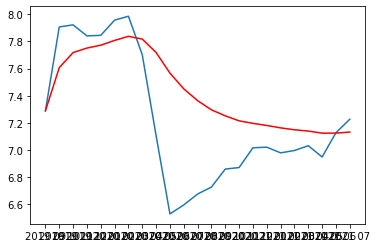

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


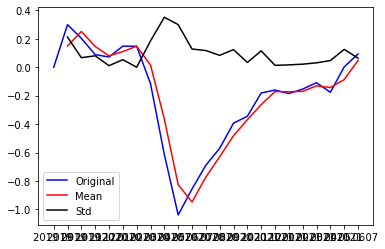

Results of Dicker-Fuller Test:
Test Statistic                 -1.195948
p-value                         0.675336
#Lags Used                      0.000000
Number of Observations Used    22.000000
Critical Value (1%)            -3.769733
Critical Value (5%)            -3.005426
Critical Value (10%)           -2.642501
dtype: float64
				dataset Log Diff Shifting


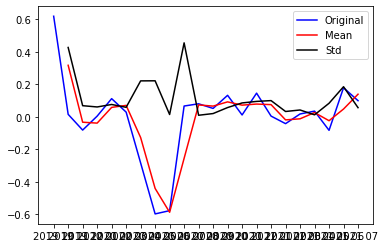

Results of Dicker-Fuller Test:
Test Statistic                 -3.629039
p-value                         0.005230
#Lags Used                      0.000000
Number of Observations Used    21.000000
Critical Value (1%)            -3.788386
Critical Value (5%)            -3.013098
Critical Value (10%)           -2.646397
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


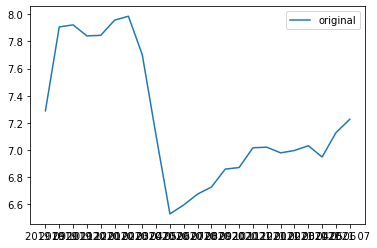

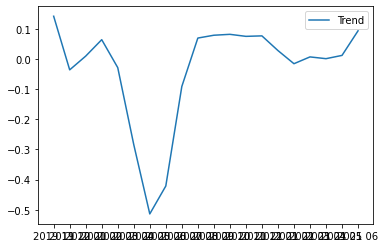

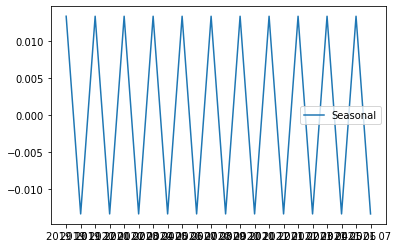

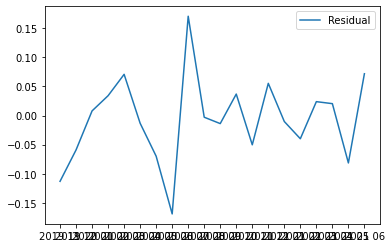

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


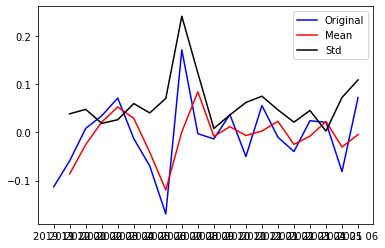

Results of Dicker-Fuller Test:
Test Statistic                 -4.384505
p-value                         0.000316
#Lags Used                      3.000000
Number of Observations Used    16.000000
Critical Value (1%)            -3.924019
Critical Value (5%)            -3.068498
Critical Value (10%)           -2.673893
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


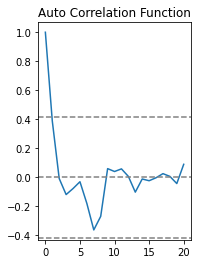

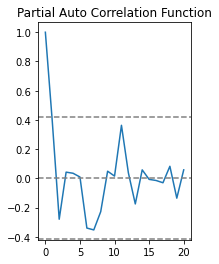

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


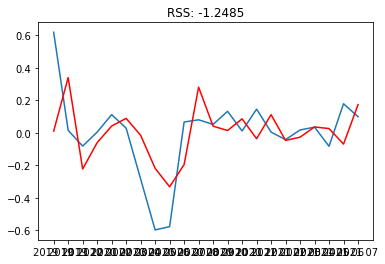

In [ ]:
e11_logdiff, e11_arima = create_arima(total_e11_cn, 2,1,0)

		predictions_diff
Date
2019 10    0.010448
2019 11    0.339812
2019 12   -0.222290
2020 01   -0.060642
2020 02    0.041601
2020 03    0.089051
2020 04   -0.015000
2020 05   -0.217980
2020 06   -0.332118
2020 07   -0.195150
2020 08    0.280915
2020 09    0.041093
2020 10    0.014356
2020 11    0.086082
2020 12   -0.036147
2021 01    0.111724
2021 02   -0.046599
2021 03   -0.026655
2021 04    0.036169
2021 05    0.026219
2021 06   -0.069345
2021 07    0.173459
dtype: float64 


		predictions_diff_cumsum
Date
2019 10    0.010448
2019 11    0.350260
2019 12    0.127970
2020 01    0.067328
2020 02    0.108928
2020 03    0.197979
2020 04    0.182979
2020 05   -0.035000
2020 06   -0.367118
2020 07   -0.562268
2020 08   -0.281353
2020 09   -0.240260
2020 10   -0.225904
2020 11   -0.139822
2020 12   -0.175969
2021 01   -0.064245
2021 02   -0.110844
2021 03   -0.137499
2021 04   -0.101330
2021 05   -0.075111
2021 06   -0.144456
2021 07    0.029003
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


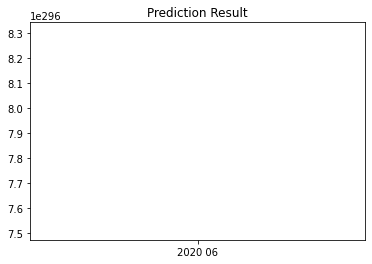

<Figure size 432x288 with 0 Axes>

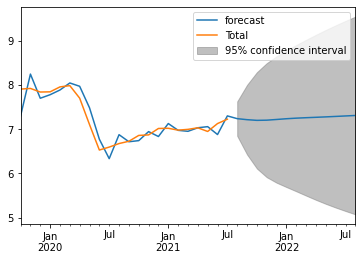

In [ ]:
e11_forecast_result = after_arima(total_e11_cn, e11_arima, 12)

e201

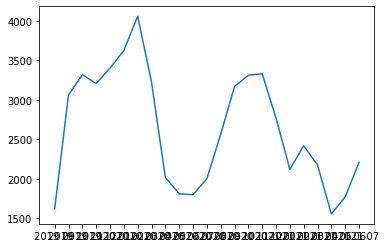

********************************************************************************
********************************************************************************
******************************************************************************** 



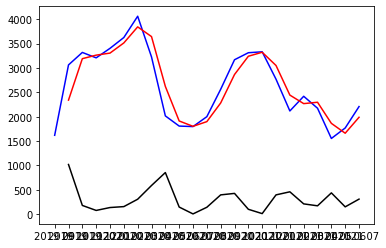

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -2.871828
p-value                         0.048723
#Lags Used                      3.000000
Number of Observations Used    19.000000
Critical Value (1%)            -3.832603
Critical Value (5%)            -3.031227
Critical Value (10%)           -2.655520
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


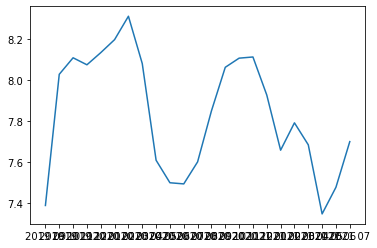

				Moving Everage


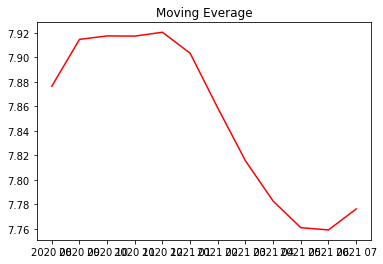

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


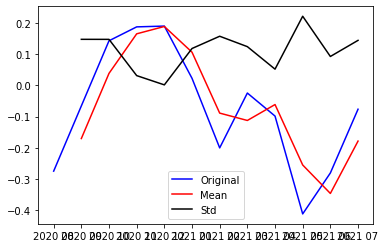

Results of Dicker-Fuller Test:
Test Statistic                -1.350402
p-value                        0.605810
#Lags Used                     3.000000
Number of Observations Used    8.000000
Critical Value (1%)           -4.665186
Critical Value (5%)           -3.367187
Critical Value (10%)          -2.802961
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


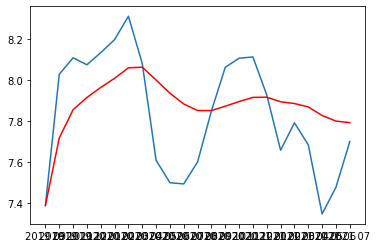

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


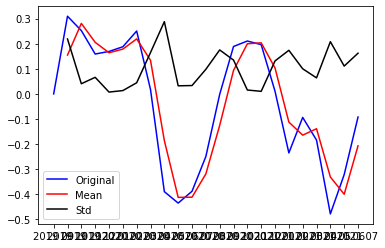

Results of Dicker-Fuller Test:
Test Statistic                 -3.203920
p-value                         0.019759
#Lags Used                      3.000000
Number of Observations Used    19.000000
Critical Value (1%)            -3.832603
Critical Value (5%)            -3.031227
Critical Value (10%)           -2.655520
dtype: float64
				dataset Log Diff Shifting


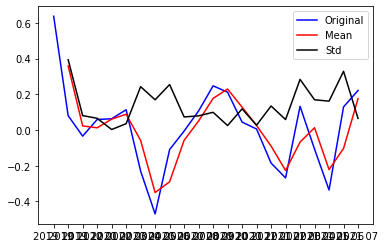

Results of Dicker-Fuller Test:
Test Statistic                 -2.785213
p-value                         0.060417
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


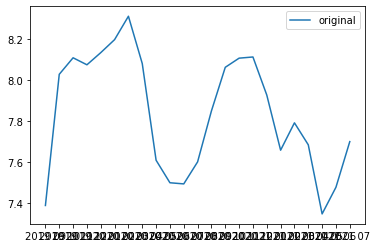

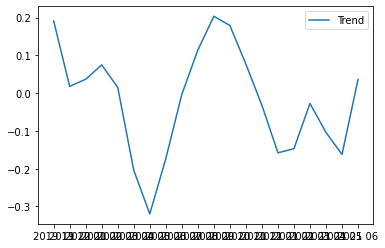

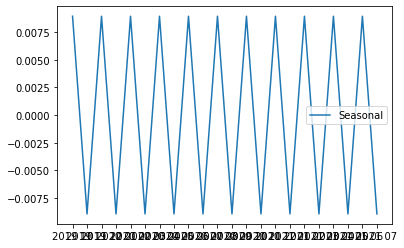

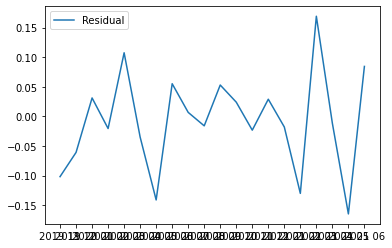

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


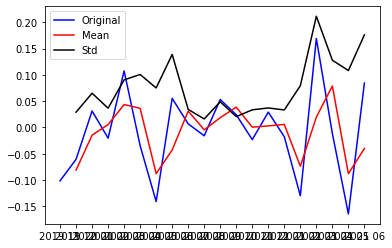

Results of Dicker-Fuller Test:
Test Statistic                 -1.308310
p-value                         0.625362
#Lags Used                      7.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


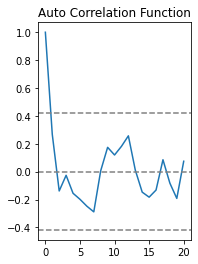

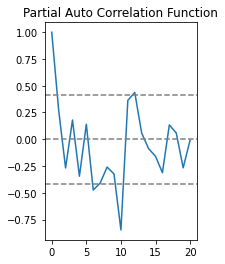

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


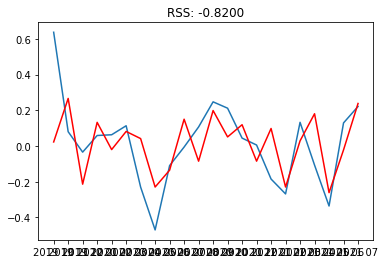

In [ ]:
e201_logdiff, e201_arima = create_arima(total_e201_cn, 2,1,1)

		predictions_diff
Date
2019 10    0.022878
2019 11    0.266662
2019 12   -0.213477
2020 01    0.132716
2020 02   -0.019801
2020 03    0.081725
2020 04    0.041748
2020 05   -0.229509
2020 06   -0.135080
2020 07    0.150310
2020 08   -0.084740
2020 09    0.198754
2020 10    0.051129
2020 11    0.119390
2020 12   -0.084575
2021 01    0.098371
2021 02   -0.229436
2021 03    0.029067
2021 04    0.180904
2021 05   -0.260931
2021 06   -0.021578
2021 07    0.238320
dtype: float64 


		predictions_diff_cumsum
Date
2019 10    0.022878
2019 11    0.289540
2019 12    0.076063
2020 01    0.208780
2020 02    0.188979
2020 03    0.270704
2020 04    0.312452
2020 05    0.082943
2020 06   -0.052137
2020 07    0.098173
2020 08    0.013433
2020 09    0.212187
2020 10    0.263315
2020 11    0.382705
2020 12    0.298130
2021 01    0.396501
2021 02    0.167065
2021 03    0.196132
2021 04    0.377036
2021 05    0.116106
2021 06    0.094527
2021 07    0.332847
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


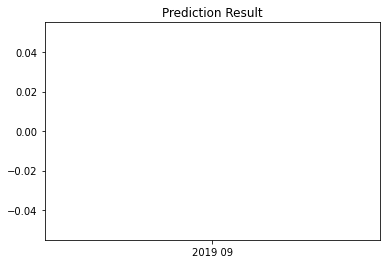

<Figure size 432x288 with 0 Axes>

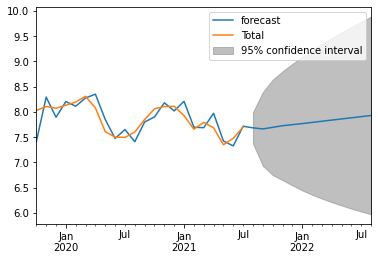

In [ ]:
e201_forecast_result = after_arima(total_e201_cn, e201_arima, 12)

e5001

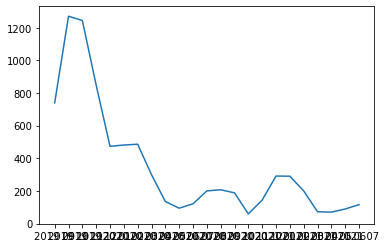

********************************************************************************
********************************************************************************
******************************************************************************** 



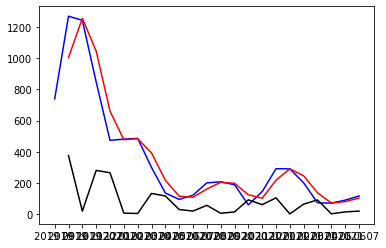

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -5.030040
p-value                         0.000019
#Lags Used                      1.000000
Number of Observations Used    21.000000
Critical Value (1%)            -3.788386
Critical Value (5%)            -3.013098
Critical Value (10%)           -2.646397
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


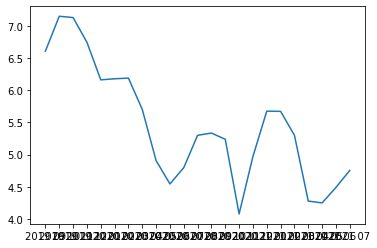

				Moving Everage


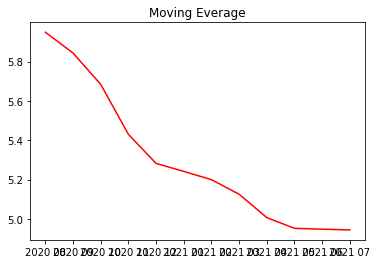

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


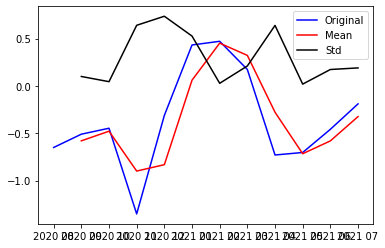

Results of Dicker-Fuller Test:
Test Statistic                -6.564263e+00
p-value                        8.234043e-09
#Lags Used                     3.000000e+00
Number of Observations Used    8.000000e+00
Critical Value (1%)           -4.665186e+00
Critical Value (5%)           -3.367187e+00
Critical Value (10%)          -2.802961e+00
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


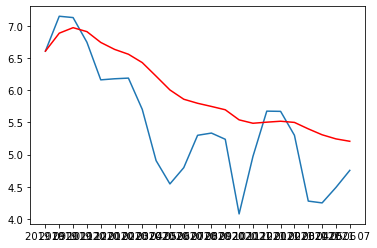

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


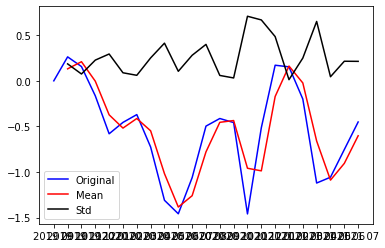

Results of Dicker-Fuller Test:
Test Statistic                 -3.374441
p-value                         0.011862
#Lags Used                      8.000000
Number of Observations Used    14.000000
Critical Value (1%)            -4.012034
Critical Value (5%)            -3.104184
Critical Value (10%)           -2.690987
dtype: float64
				dataset Log Diff Shifting


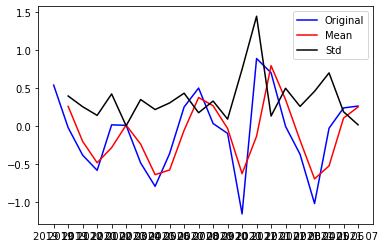

Results of Dicker-Fuller Test:
Test Statistic                  0.148137
p-value                         0.969198
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


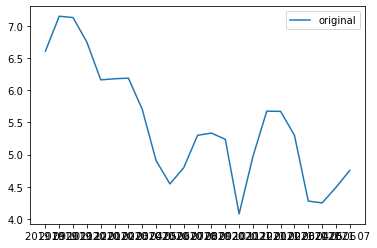

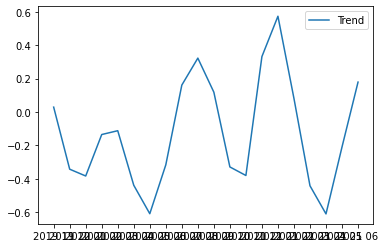

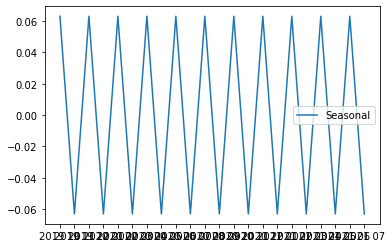

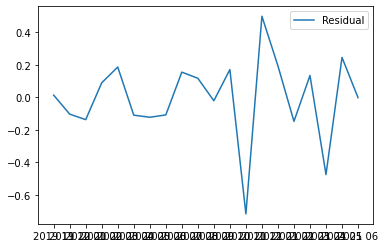

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


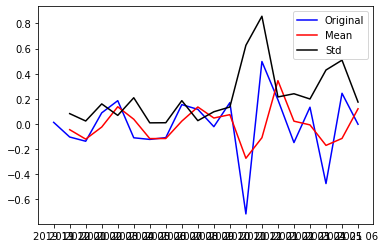

Results of Dicker-Fuller Test:
Test Statistic                 -4.439738
p-value                         0.000252
#Lags Used                      8.000000
Number of Observations Used    11.000000
Critical Value (1%)            -4.223238
Critical Value (5%)            -3.189369
Critical Value (10%)           -2.729839
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


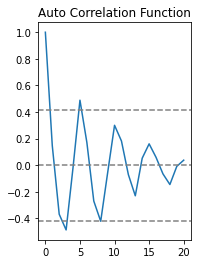

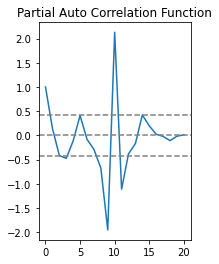

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


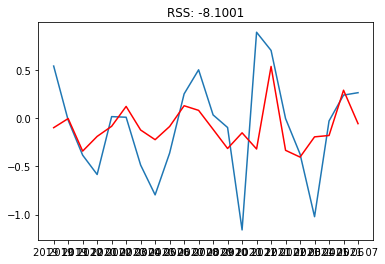

In [ ]:
e5001_logdiff, e5001_arima = create_arima(total_e5001_cn, 2,1,0)

		predictions_diff
Date
2019 10   -0.098079
2019 11   -0.003553
2019 12   -0.341175
2020 01   -0.188661
2020 02   -0.083413
2020 03    0.122602
2020 04   -0.122102
2020 05   -0.222535
2020 06   -0.085755
2020 07    0.129598
2020 08    0.081676
2020 09   -0.115402
2020 10   -0.313951
2020 11   -0.151390
2020 12   -0.319136
2021 01    0.537499
2021 02   -0.332922
2021 03   -0.403257
2021 04   -0.193230
2021 05   -0.179073
2021 06    0.290707
2021 07   -0.056162
dtype: float64 


		predictions_diff_cumsum
Date
2019 10   -0.098079
2019 11   -0.101631
2019 12   -0.442807
2020 01   -0.631468
2020 02   -0.714880
2020 03   -0.592279
2020 04   -0.714381
2020 05   -0.936916
2020 06   -1.022671
2020 07   -0.893073
2020 08   -0.811397
2020 09   -0.926799
2020 10   -1.240751
2020 11   -1.392141
2020 12   -1.711277
2021 01   -1.173779
2021 02   -1.506701
2021 03   -1.909958
2021 04   -2.103188
2021 05   -2.282261
2021 06   -1.991554
2021 07   -2.047716
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


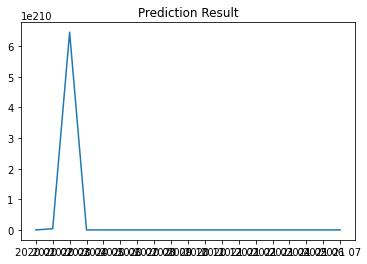

<Figure size 432x288 with 0 Axes>

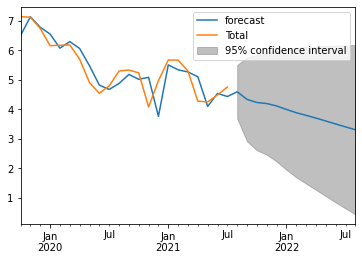

In [ ]:
e5001_forecast_result = after_arima(total_e5001_cn, e5001_arima, 12)

e501

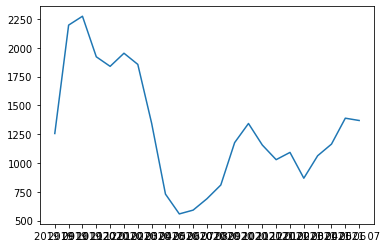

********************************************************************************
********************************************************************************
******************************************************************************** 



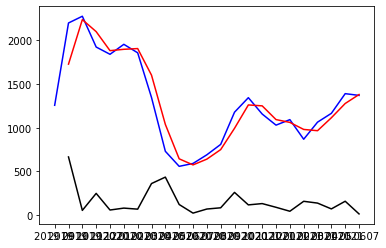

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -1.449327
p-value                         0.558413
#Lags Used                      8.000000
Number of Observations Used    14.000000
Critical Value (1%)            -4.012034
Critical Value (5%)            -3.104184
Critical Value (10%)           -2.690987
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


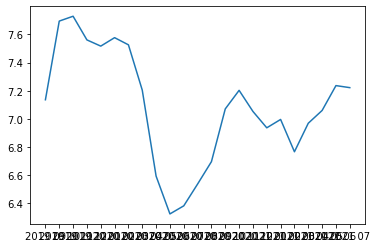

				Moving Everage


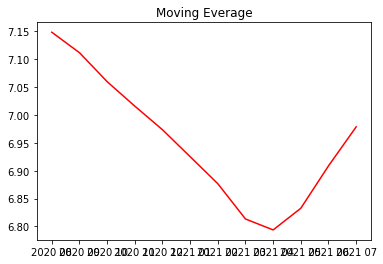

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


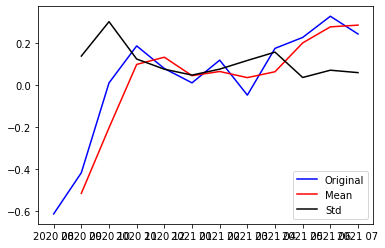

Results of Dicker-Fuller Test:
Test Statistic                 -2.995207
p-value                         0.035344
#Lags Used                      0.000000
Number of Observations Used    11.000000
Critical Value (1%)            -4.223238
Critical Value (5%)            -3.189369
Critical Value (10%)           -2.729839
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


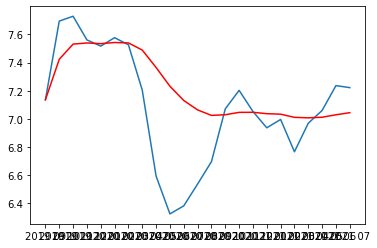

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


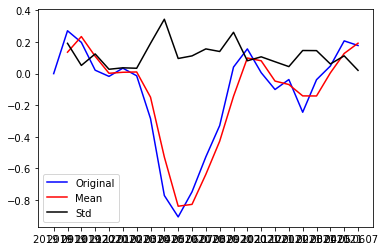

Results of Dicker-Fuller Test:
Test Statistic                 -1.448229
p-value                         0.558949
#Lags Used                      5.000000
Number of Observations Used    17.000000
Critical Value (1%)            -3.889266
Critical Value (5%)            -3.054358
Critical Value (10%)           -2.666984
dtype: float64
				dataset Log Diff Shifting


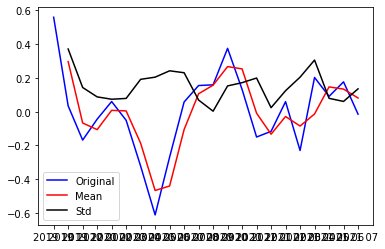

Results of Dicker-Fuller Test:
Test Statistic                 -1.595789
p-value                         0.485708
#Lags Used                      7.000000
Number of Observations Used    14.000000
Critical Value (1%)            -4.012034
Critical Value (5%)            -3.104184
Critical Value (10%)           -2.690987
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


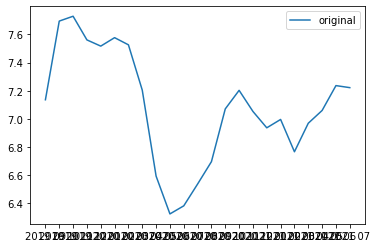

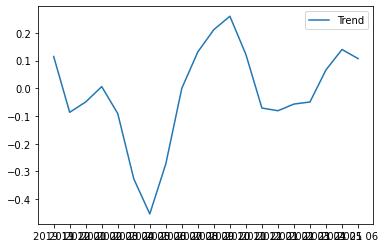

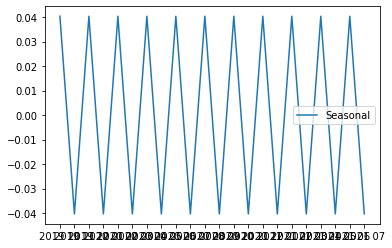

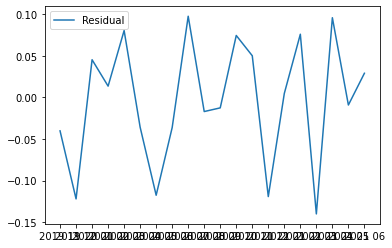

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


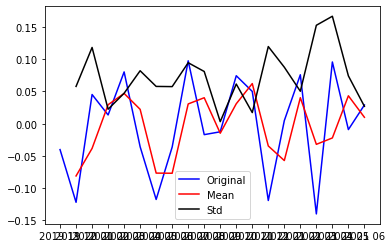

Results of Dicker-Fuller Test:
Test Statistic                -6.700910e+00
p-value                        3.891550e-09
#Lags Used                     8.000000e+00
Number of Observations Used    1.100000e+01
Critical Value (1%)           -4.223238e+00
Critical Value (5%)           -3.189369e+00
Critical Value (10%)          -2.729839e+00
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


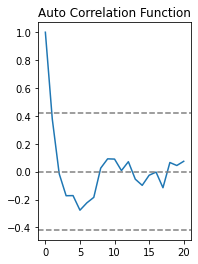

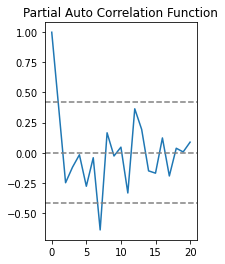

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


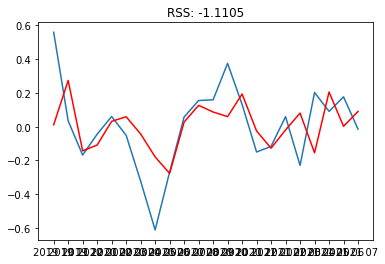

In [ ]:
e501_logdiff, e501_arima = create_arima(total_e501_cn, 2,1,0)

		predictions_diff
Date
2019 10    0.011146
2019 11    0.273832
2019 12   -0.143147
2020 01   -0.108484
2020 02    0.031744
2020 03    0.058914
2020 04   -0.042891
2020 05   -0.178645
2020 06   -0.276366
2020 07    0.027455
2020 08    0.126435
2020 09    0.087003
2020 10    0.059631
2020 11    0.193662
2020 12   -0.025229
2021 01   -0.127097
2021 02   -0.019173
2021 03    0.080725
2021 04   -0.154685
2021 05    0.205433
2021 06    0.002049
2021 07    0.090435
dtype: float64 


		predictions_diff_cumsum
Date
2019 10    0.011146
2019 11    0.284979
2019 12    0.141832
2020 01    0.033348
2020 02    0.065092
2020 03    0.124005
2020 04    0.081115
2020 05   -0.097530
2020 06   -0.373896
2020 07   -0.346441
2020 08   -0.220006
2020 09   -0.133003
2020 10   -0.073373
2020 11    0.120289
2020 12    0.095060
2021 01   -0.032037
2021 02   -0.051210
2021 03    0.029515
2021 04   -0.125170
2021 05    0.080263
2021 06    0.082312
2021 07    0.172747
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


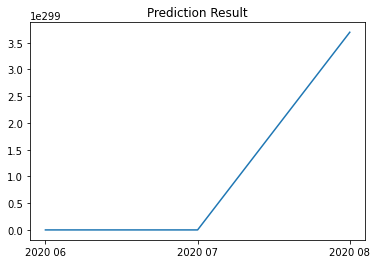

<Figure size 432x288 with 0 Axes>

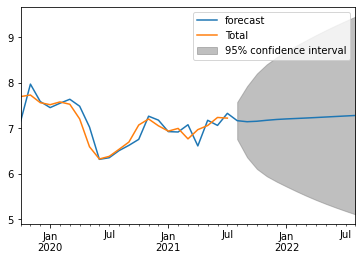

In [ ]:
e501_forecast_result = after_arima(total_e501_cn, e501_arima, 12)

e51

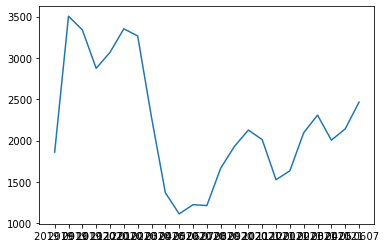

********************************************************************************
********************************************************************************
******************************************************************************** 



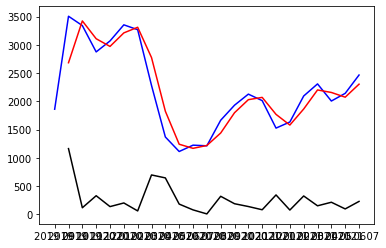

********************************************************************************
********************************************************************************
******************************************************************************** 

Results of Dicker-Fuller Test:
Test Statistic                 -1.714029
p-value                         0.423899
#Lags Used                      0.000000
Number of Observations Used    22.000000
Critical Value (1%)            -3.769733
Critical Value (5%)            -3.005426
Critical Value (10%)           -2.642501
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale


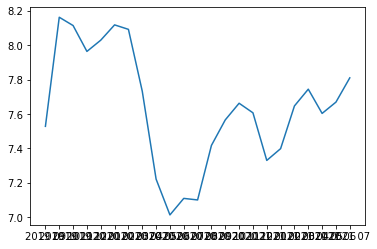

				Moving Everage


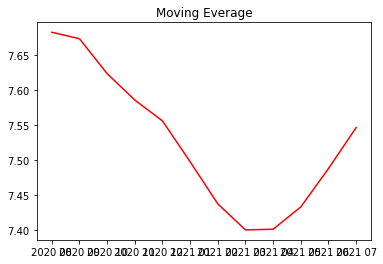

********************************************************************************
********************************************************************************
******************************************************************************** 

				Log Scale Minus Moving Avarage


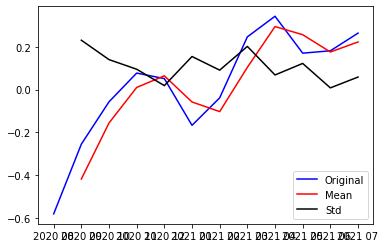

Results of Dicker-Fuller Test:
Test Statistic                -0.019614
p-value                        0.956880
#Lags Used                     4.000000
Number of Observations Used    7.000000
Critical Value (1%)           -4.938690
Critical Value (5%)           -3.477583
Critical Value (10%)          -2.843868
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Exponential Decay Weight Avarage


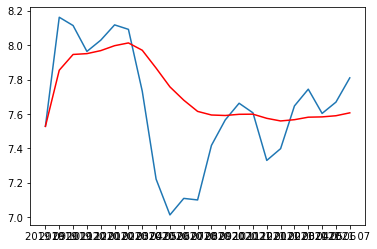

********************************************************************************
********************************************************************************
******************************************************************************** 

				dataset Log Scale - Moving Exp Decay Avarage


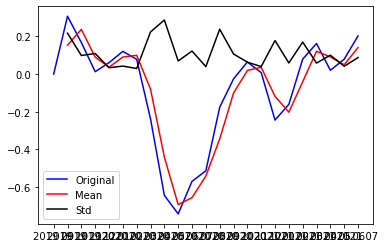

Results of Dicker-Fuller Test:
Test Statistic                 -1.417294
p-value                         0.573958
#Lags Used                      0.000000
Number of Observations Used    22.000000
Critical Value (1%)            -3.769733
Critical Value (5%)            -3.005426
Critical Value (10%)           -2.642501
dtype: float64
				dataset Log Diff Shifting


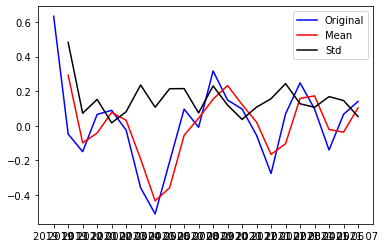

Results of Dicker-Fuller Test:
Test Statistic                 -2.876624
p-value                         0.048135
#Lags Used                      9.000000
Number of Observations Used    12.000000
Critical Value (1%)            -4.137829
Critical Value (5%)            -3.154972
Critical Value (10%)           -2.714477
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				Decomposition


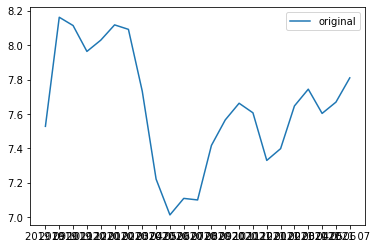

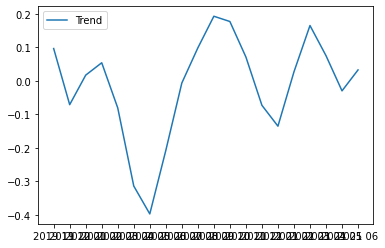

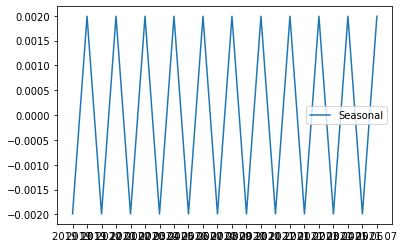

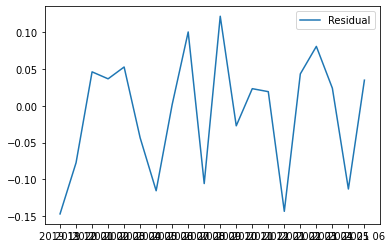

********************************************************************************
********************************************************************************
******************************************************************************** 

				Desompose Log Data


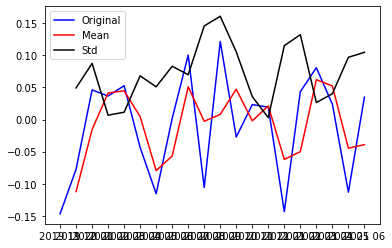

Results of Dicker-Fuller Test:
Test Statistic                 -1.001223
p-value                         0.752818
#Lags Used                      8.000000
Number of Observations Used    11.000000
Critical Value (1%)            -4.223238
Critical Value (5%)            -3.189369
Critical Value (10%)           -2.729839
dtype: float64
********************************************************************************
********************************************************************************
******************************************************************************** 

				ACF and PACF Plot


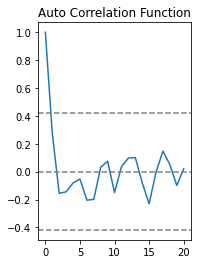

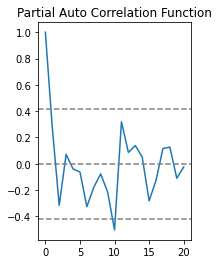

********************************************************************************
********************************************************************************
******************************************************************************** 

			PLOTTING ARIMA


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


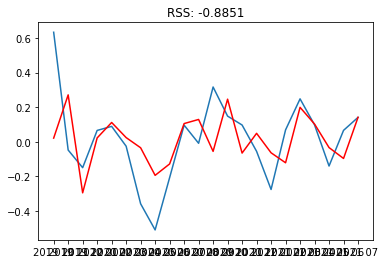

In [ ]:
e51_logdiff, e51_arima = create_arima(total_e51_cn, 2,1,1)

		predictions_diff
Date
2019 10    0.020834
2019 11    0.271109
2019 12   -0.295893
2020 01    0.021889
2020 02    0.111263
2020 03    0.023900
2020 04   -0.035096
2020 05   -0.194688
2020 06   -0.128624
2020 07    0.104952
2020 08    0.128865
2020 09   -0.055926
2020 10    0.246135
2020 11   -0.065698
2020 12    0.048556
2021 01   -0.064129
2021 02   -0.121885
2021 03    0.198958
2021 04    0.102196
2021 05   -0.033938
2021 06   -0.096880
2021 07    0.141220
dtype: float64 


		predictions_diff_cumsum
Date
2019 10    0.020834
2019 11    0.291943
2019 12   -0.003950
2020 01    0.017939
2020 02    0.129202
2020 03    0.153102
2020 04    0.118006
2020 05   -0.076682
2020 06   -0.205306
2020 07   -0.100354
2020 08    0.028511
2020 09   -0.027416
2020 10    0.218719
2020 11    0.153021
2020 12    0.201578
2021 01    0.137449
2021 02    0.015564
2021 03    0.214522
2021 04    0.316718
2021 05    0.282780
2021 06    0.185900
2021 07    0.327121
dtype: float64 


		predictions_log
Date
2019 0

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


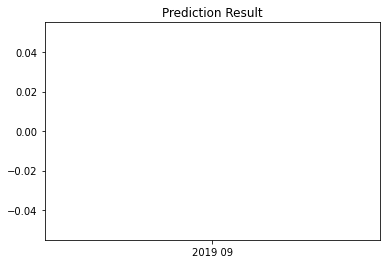

<Figure size 432x288 with 0 Axes>

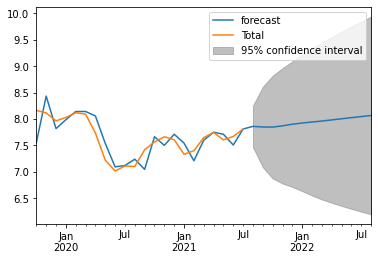

In [ ]:
e51_forecast_result = after_arima(total_e51_cn, e51_arima, 12)

In [ ]:
print(e5001, e201, e1001)

In [ ]:
print(e1, e1001, e501, e51)